<a href="https://colab.research.google.com/github/RaziehSh1987/3D-landmarks-Pose_estimation/blob/main/compareAcuracy_Mediapipe_BlazePose.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>







```
 extract coordinates
 ```






In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def extract_one_vector(text_line):
    start_index = text_line.index('(') + 1
    end_index = text_line.index(')')

    values_string = text_line[start_index:end_index]
    values_array = values_string.split(',')

    values = [float(value) for value in values_array]

    return values


extact Landmark

In [ ]:
# find landmark for grounf throgh and predicted skeleton
def find_landmark(text_line):
    start_index = text_line.index(',') + 1
    end_index = text_line.index(']')

    second_string = text_line[start_index:end_index]
    # convert string to int
    # landmark_number = int(second_string)
    landmark_number = second_string
    return landmark_number


**extract framenumber**

In [ ]:
def find_frame_number(text_line):
    start_index = text_line.index('[') + 1
    end_index = text_line.index(',')

    second_string = text_line[start_index:end_index]
    # convert string to int
    # landmark_number = int(second_string)
    landmark_number = second_string
    return landmark_number

//////Read all  ground truth and predicted files for** indivisual cameras**:
if i run bellow cell , i mustn't rune the next cell after bellow cell

In [ ]:
# #@title
# # Read all   ground truth Landmarks files
# file_path_Groundtruth = "/content/drive/MyDrive/BishopThesisv9-Medapipe-unity/input/coordinates_accuracy/AnimationTransform.txt"
# with open(file_path_Groundtruth, 'r') as f:
#     lines_Groundtruth = f.readlines()
#     # print(lines_Groundtruth)

# # file_paths = [#mediapipe_predicted_coordinate_old_version_blazepose
#     # "/content/drive/MyDrive/BishopThesisv9-Medapipe-unity/input/coordinates_accuracy/coordinate1.txt",
#     # "/content/drive/MyDrive/BishopThesisv9-Medapipe-unity/input/coordinates_accuracy/coordinate2.txt",
#     # "/content/drive/MyDrive/BishopThesisv9-Medapipe-unity/input/coordinates_accuracy/coordinate3.txt",
#     # "/content/drive/MyDrive/BishopThesisv9-Medapipe-unity/input/coordinates_accuracy/coordinate4.txt"
# # ]
# file_paths = [#Blazepose3d_predicted_coordinate_New version and is more correct
#     "/content/drive/MyDrive/BishopThesisv10-3dLandmark-unity/BlazePose_input_output/3d_output_txt/3d_landmarks_1.txt",
#     "/content/drive/MyDrive/BishopThesisv10-3dLandmark-unity/BlazePose_input_output/3d_output_txt/3d_landmarks_2.txt",
#     "/content/drive/MyDrive/BishopThesisv10-3dLandmark-unity/BlazePose_input_output/3d_output_txt/3d_landmarks_3.txt",
#     "/content/drive/MyDrive/BishopThesisv10-3dLandmark-unity/BlazePose_input_output/3d_output_txt/3d_landmarks_4.txt",

# ]
# lines_predicted = []

# for file_path in file_paths:
#   # Read all predicted Landmarks file for one coordinate file 
#     with open(file_path, 'r') as f:
#         lines = f.readlines()
#     #lines_predicted[0] is  Content of coordinate1.txt
#     lines_predicted.append(lines)



//////Read all ground truth and predicted files for ** all distances and angles**:

In [ ]:
#@title
# Read all   ground truth Landmarks files
file_path_Groundtruth = "/content/drive/MyDrive/BishopThesisv10-3dLandmark-unity/unity/new_video_all_distances_angles/AnimationTransform.txt"
with open(file_path_Groundtruth, 'r') as f:
    lines_Groundtruth = f.readlines()
    # print(lines_Groundtruth)

file_paths = ["/content/drive/MyDrive/BishopThesisv10-3dLandmark-unity/BlazePose_input_output/3d_output_txt/3d_landmarks_1234.txt"]
lines_predicted = []

for file_path in file_paths:
  # Read all predicted Landmarks file for one coordinate file 
    with open(file_path, 'r') as f:
        lines = f.readlines()
    #lines_predicted[0] is  Content of coordinate1.txt
    lines_predicted.append(lines)



# **///////Create 2 same list of groundtruth and predicted landmark to calculate Lost Function: I have to enable and comment case function to mediapipe or video3d algorithm**
Axes to each coordinate ,  somthing like   # switch(find_landmark(line):  #  case  "mixamorig2:HeadTop_End":
Transform(ground_truh)=coordinate(predicted-mediapipe)=coordinate(predicted-video3d)
* right|left foot =right|left Ankle[28,27]=[0,5]
* right|left knee=right|left knee[26,25]=[1,4]
* right|left hip=right|left hip[24,23]=[2,3]
* right|left shoulder=right|left shoulder[12,11]=[12,13]
* right|left elbow=right|left elbow[14,13]=[11,14]
* right|left hand=right|left wrist[16,15]=[10,15]
* head=nose[0]=[8]



In [ ]:
from pickle import FRAME
LandmaksVectors_Groundtruth=[]
LandmaksVectors_predicted=[]
previous_frame=0

# 'Right_Foot_Ankle','Left_Foot_Ankle','Right_knee','Left_knee','Right_hip','Left_hip','Right_shoulder','Left_shoulder','Right_elbow','Left_elbow','Right_hand','Left_hand','head'

# Define functions to handle each case, somthing like   # switch(find_landmark(line):  #  case  "mixamorig2:HeadTop_End":
def handle_Right_Foot_Ankle(flag,coordinate,frame_number,coord_num):
  if len(LandmaksVectors_predicted) <= coord_num:
    LandmaksVectors_predicted.append([])
  # print(f'{coordinate}------------')
  landmark_index=0
  if flag==1:
    LandmaksVectors_Groundtruth.append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])
  else:
    LandmaksVectors_predicted[coord_num].append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])    
def handle_Left_Foot_Ankle(flag,coordinate,frame_number,coord_num):
  if len(LandmaksVectors_predicted) <= coord_num:
    LandmaksVectors_predicted.append([])
  landmark_index=1
  if flag==1:
    LandmaksVectors_Groundtruth.append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])
  else:
    LandmaksVectors_predicted[coord_num].append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])    
def handle_Right_knee(flag,coordinate,frame_number,coord_num):
  if len(LandmaksVectors_predicted) <= coord_num:
    LandmaksVectors_predicted.append([])
  landmark_index=2
  if flag==1:
    LandmaksVectors_Groundtruth.append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])
  else:
    LandmaksVectors_predicted[coord_num].append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])    
def handle_Left_knee(flag,coordinate,frame_number,coord_num):
  if len(LandmaksVectors_predicted) <= coord_num:
    LandmaksVectors_predicted.append([])
  landmark_index=3
  if flag==1:
    LandmaksVectors_Groundtruth.append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])
  else:
    LandmaksVectors_predicted[coord_num].append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])    
def handle_Right_hip(flag,coordinate,frame_number,coord_num):
  if len(LandmaksVectors_predicted) <= coord_num:
    LandmaksVectors_predicted.append([])
  landmark_index=4
  if flag==1:
    LandmaksVectors_Groundtruth.append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])
  else:
    LandmaksVectors_predicted[coord_num].append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])    
def handle_Left_hip(flag,coordinate,frame_number,coord_num):
  if len(LandmaksVectors_predicted) <= coord_num:
    LandmaksVectors_predicted.append([])
  landmark_index=5
  if flag==1:
    LandmaksVectors_Groundtruth.append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])
  else:
    LandmaksVectors_predicted[coord_num].append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])    
def handle_Right_shoulder(flag,coordinate,frame_number,coord_num):
  if len(LandmaksVectors_predicted) <= coord_num:
    LandmaksVectors_predicted.append([])
  landmark_index=6
  if flag==1:
    LandmaksVectors_Groundtruth.append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])
  else:
    LandmaksVectors_predicted[coord_num].append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])    
def handle_Left_shoulder(flag,coordinate,frame_number,coord_num):
  if len(LandmaksVectors_predicted) <= coord_num:
    LandmaksVectors_predicted.append([])
  landmark_index=7
  if flag==1:
    LandmaksVectors_Groundtruth.append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])
  else:
    LandmaksVectors_predicted[coord_num].append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])    
def handle_Right_elbow(flag,coordinate,frame_number,coord_num):
  if len(LandmaksVectors_predicted) <= coord_num:
    LandmaksVectors_predicted.append([])
  landmark_index=8
  if flag==1:
    LandmaksVectors_Groundtruth.append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])
  else:
    LandmaksVectors_predicted[coord_num].append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])    
def handle_Left_elbow(flag,coordinate,frame_number,coord_num):
  if len(LandmaksVectors_predicted) <= coord_num:
    LandmaksVectors_predicted.append([])
  landmark_index=9
  if flag==1:
    LandmaksVectors_Groundtruth.append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])
  else:
    LandmaksVectors_predicted[coord_num].append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])    
def handle_Right_hand(flag,coordinate,frame_number,coord_num):
  if len(LandmaksVectors_predicted) <= coord_num:
    LandmaksVectors_predicted.append([])
  landmark_index=10
  if flag==1:
    LandmaksVectors_Groundtruth.append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])
  else:
    LandmaksVectors_predicted[coord_num].append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])    
def handle_Left_hand(flag,coordinate,frame_number,coord_num):
  if len(LandmaksVectors_predicted) <= coord_num:
    LandmaksVectors_predicted.append([])
  landmark_index=11
  if flag==1:
    LandmaksVectors_Groundtruth.append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])
  else:
    LandmaksVectors_predicted[coord_num].append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])    
def handle_head_nose(flag,coordinate,frame_number,coord_num):
  if len(LandmaksVectors_predicted) <= coord_num:
    LandmaksVectors_predicted.append([])
  landmark_index=12
  if flag==1:
    LandmaksVectors_Groundtruth.append([coordinate[0], coordinate[1],coordinate[2],landmark_index,frame_number])
  else:
    LandmaksVectors_predicted[coord_num].append([coordinate[0], coordinate[1],Groundtruth_coordinate[2],landmark_index,frame_number])    

# # Define the dictionary that maps each case to its corresponding function, I used flag=0 and 1 to specify the predicted coordinate or  ground truth coordinates
case_functions = {
       ' mixamorig2:RightFoot':lambda coordinate,frame,coord_num:handle_Right_Foot_Ankle(1, coordinate,frame,coord_num),
       '28':lambda coordinate,frame,coord_num:handle_Right_Foot_Ankle(0, coordinate,frame,coord_num), #Mediapipe
      #  '0':lambda coordinate,frame,coord_num:handle_Right_Foot_Ankle(0, coordinate,frame,coord_num), #Video3D
       ' mixamorig2:LeftFoot':lambda coordinate,frame,coord_num:handle_Left_Foot_Ankle(1, coordinate,frame,coord_num),
       '27':lambda coordinate,frame,coord_num:handle_Left_Foot_Ankle(0, coordinate,frame,coord_num),
      #  '5':lambda coordinate,frame,coord_num:handle_Left_Foot_Ankle(0, coordinate,frame,coord_num),
       ' mixamorig2:RightLeg':lambda coordinate,frame,coord_num:handle_Right_knee(1, coordinate,frame,coord_num),
       '26':lambda coordinate,frame,coord_num:handle_Right_knee(0, coordinate,frame,coord_num),
      # '1':lambda coordinate,frame,coord_num:handle_Right_knee(0, coordinate,frame,coord_num),
       ' mixamorig2:LeftLeg':lambda coordinate,frame,coord_num:handle_Left_knee(1, coordinate,frame,coord_num),
       '25':lambda coordinate,frame,coord_num:handle_Left_knee(0, coordinate,frame,coord_num),
      # '4':lambda coordinate,frame,coord_num:handle_Left_knee(0, coordinate,frame,coord_num),
       ' mixamorig2:RightUpLeg':lambda coordinate,frame,coord_num:handle_Right_hip(1, coordinate,frame,coord_num),
       '24':lambda coordinate,frame,coord_num:handle_Right_hip(0, coordinate,frame,coord_num),
      #  '2':lambda coordinate,frame,coord_num:handle_Right_hip(0, coordinate,frame,coord_num),
       ' mixamorig2:LeftUpLeg':lambda coordinate,frame,coord_num:handle_Left_hip(1, coordinate,frame,coord_num),
       '23':lambda coordinate,frame,coord_num:handle_Left_hip(0, coordinate,frame,coord_num),
      #  '3':lambda coordinate,frame,coord_num:handle_Left_hip(0, coordinate,frame,coord_num),
       ' mixamorig2:RightShoulder':lambda coordinate,frame,coord_num:handle_Right_shoulder(1, coordinate,frame,coord_num),
       '12':lambda coordinate,frame,coord_num:handle_Right_shoulder(0, coordinate,frame,coord_num),
      #  '12':lambda coordinate,frame,coord_num:handle_Right_shoulder(0, coordinate,frame,coord_num),
       ' mixamorig2:LeftShoulder':lambda coordinate,frame,coord_num:handle_Left_shoulder(1, coordinate,frame,coord_num),
       '11':lambda coordinate,frame,coord_num:handle_Left_shoulder(0, coordinate,frame,coord_num),
      # '13':lambda coordinate,frame,coord_num:handle_Left_shoulder(0, coordinate,frame,coord_num),
       ' mixamorig2:RightForeArm':lambda coordinate,frame,coord_num:handle_Right_elbow(1, coordinate,frame,coord_num),
       '14':lambda coordinate,frame,coord_num:handle_Right_elbow(0, coordinate,frame,coord_num),
      # '11':lambda coordinate,frame,coord_num:handle_Right_elbow(0, coordinate,frame,coord_num),
       ' mixamorig2:LeftForeArm':lambda coordinate,frame,coord_num:handle_Left_elbow(1, coordinate,frame,coord_num),
       '13':lambda coordinate,frame,coord_num:handle_Left_elbow(0, coordinate,frame,coord_num),
      # '14':lambda coordinate,frame,coord_num:handle_Left_elbow(0, coordinate,frame,coord_num),
       ' mixamorig2:RightHand':lambda coordinate,frame,coord_num:handle_Right_hand(1, coordinate,frame,coord_num),
       '16':lambda coordinate,frame,coord_num:handle_Right_hand(0, coordinate,frame,coord_num),
        # '10':lambda coordinate,frame,coord_num:handle_Right_hand(0, coordinate,frame,coord_num),
       ' mixamorig2:LeftHand':lambda coordinate,frame,coord_num:handle_Left_hand(1, coordinate,frame,coord_num),
       '15':lambda coordinate,frame,coord_num:handle_Left_hand(0, coordinate,frame,coord_num),
      # '15':lambda coordinate,frame,coord_num:handle_Left_hand(0, coordinate,frame,coord_num),
       ' mixamorig2:HeadTop_End':lambda coordinate,frame,coord_num:handle_head_nose(1, coordinate,frame,coord_num),
       '0':lambda coordinate,frame,coord_num:handle_head_nose(0, coordinate,frame,coord_num)
      # '8':lambda coordinate,frame,coord_num:handle_head_nose(0, coordinate,frame,coord_num)
}

# ------------------------------------------------------------
# create a List of Groundtruth Coordinates---
for line_g in lines_Groundtruth:
  Groundtruth_coordinate=extract_one_vector(line_g)
  # print(Groundtruth_coordinate)
 # Call the function that corresponds to the given case
  landmark=find_landmark(line_g)
  print(landmark)
  frame=find_frame_number(line_g)
  print(f'GroundTruth coordinate ,frame#={frame} ,Landmark={landmark}')
  # call dictionary to find corespond coordinate to landmark
  func = case_functions.get(landmark, lambda _,__,___: print("Landmark not found:", landmark))

  if func is not None:
        func(Groundtruth_coordinate,frame,6)#we don't nedd number6 for Groundtruth coordinate
  else:
        print("Landmark not found:", landmark)


# ---------------------------------------------------------
# create a List of Predicted Coordinates---
for coordinate_num in range(0,len(file_paths)):
  for line_p in lines_predicted[coordinate_num]:
    predicted_coordinate=extract_one_vector(line_p)
  # Call the function that corresponds to the given case
    landmark_predicted=find_landmark(line_p)
    frame_p=find_frame_number(line_p)
    print(f'Predicted coordinate={coordinate_num+1} ,frame#={frame_p} ,Landmark_p={landmark_predicted}')
    # call dictionary to find corespond coordinate to landmark
    func_p = case_functions.get(landmark_predicted, lambda _,__,___: print("predicted Landmark not found:", landmark_predicted))
    if func_p is not None:
          func_p(predicted_coordinate,frame_p,coordinate_num)
    else:
          print("Landmark not found:", landmark_predicted)

  


Streaming output truncated to the last 5000 lines.
Predicted coordinate=1 ,frame#=577 ,Landmark_p=21
predicted Landmark not found: 21
Predicted coordinate=1 ,frame#=577 ,Landmark_p=22
predicted Landmark not found: 22
Predicted coordinate=1 ,frame#=577 ,Landmark_p=23
Predicted coordinate=1 ,frame#=577 ,Landmark_p=24
Predicted coordinate=1 ,frame#=577 ,Landmark_p=25
Predicted coordinate=1 ,frame#=577 ,Landmark_p=26
Predicted coordinate=1 ,frame#=577 ,Landmark_p=27
Predicted coordinate=1 ,frame#=577 ,Landmark_p=28
Predicted coordinate=1 ,frame#=577 ,Landmark_p=29
predicted Landmark not found: 29
Predicted coordinate=1 ,frame#=577 ,Landmark_p=30
predicted Landmark not found: 30
Predicted coordinate=1 ,frame#=577 ,Landmark_p=31
predicted Landmark not found: 31
Predicted coordinate=1 ,frame#=577 ,Landmark_p=32
predicted Landmark not found: 32
Predicted coordinate=1 ,frame#=578 ,Landmark_p=0
Predicted coordinate=1 ,frame#=578 ,Landmark_p=1
predicted Landmark not found: 1
Predicted coordinate=

# use **interpolate** to make same the landmark number and frame number in 2 files(ground truth and predicted):

In [ ]:
# # Define a function to calculate the Euclidean distance between two points
# def euclidean_distance(point1, point2):
#     return np.sqrt(np.sum((point1 - point2) ** 2))

# # flag=0
# new_all_lists_p = [[] for _ in range(len(pred_landmarks))]  # initialize the list with empty lists
# # Loop over all the frames and calculate the distance between corresponding landmarks
# for num_predict_file in range(len(pred_landmarks)):
#     gt_coordinate=[]
#     for list_g in gt_landmarks:
#       if any( list_g[-2:]==sublist_pp[-2:] for sublist_pp in pred_landmarks[num_predict_file])==0:
#             new_all_lists_p[num_predict_file].append([0, 0, 0, int(list_g[-2]), str(list_g[-1])])
#         # gt_coordinate = list_g
#     for sublist_p in pred_landmarks[num_predict_file]:
#        new_all_lists_p[num_predict_file].append(sublist_p)

# print(new_all_lists_p)
# print(len(new_all_lists_p[0]))

# # euclidean_distance()
# ----------
import numpy as np

# # Define the landmarks
gt_landmarks=LandmaksVectors_Groundtruth
pred_landmarks=LandmaksVectors_predicted

# Define a function to calculate the Euclidean distance between two points
def euclidean_distance(point1, point2):
    return np.sqrt(np.sum((point1 - point2) ** 2))

exist_flag=0
sublist_pp=None
new_all_lists_p = [[] for _ in range(len(pred_landmarks))]  # initialize the list with empty lists
# Loop over all the frames and calculate the distance between corresponding landmarks
for num_predict_file in range(len(pred_landmarks)):
    # gt_coordinate=[]
    for list_g in gt_landmarks:
      for sublist_p in pred_landmarks[num_predict_file]:
       
        if ( list_g[-2:]!=sublist_p[-2:]):
           exist_flag=0
        else:
          exist_flag=1
          sublist_pp=sublist_p
          break

      if exist_flag==0 :
         new_all_lists_p[num_predict_file].append([0, 0, 0, int(list_g[-2]), str(list_g[-1])])
      elif exist_flag==1:
          new_all_lists_p[num_predict_file].append(sublist_pp)

print([[gt_landmarks[i],new_all_lists_p[0][i]] for i in range(len(gt_landmarks))])

        


[[[-2.044032, 1.773751, -2.696811, 10, '0'], [-1.0, -1.0, -1.0, 10, '0']], [[-1.735393, 1.77375, -2.775799, 8, '0'], [-1.0, -1.0, -1.0, 8, '0']], [[-1.282995, 1.809685, -2.891642, 6, '0'], [-1.0, -1.0, -1.0, 6, '0']], [[-1.222214, 2.18694, -2.928118, 12, '0'], [-1.0, -1.0, -2.895346, 12, '0']], [[-0.3903559, 1.77375, -3.120215, 11, '0'], [-1.0, -1.0, -1.0, 11, '0']], [[-0.6989818, 1.77375, -3.041231, 9, '0'], [-1.0, -1.0, -1.0, 9, '0']], [[-1.151398, 1.809685, -2.925384, 7, '0'], [-1.0, -1.0, -1.0, 7, '0']], [[-1.343905, 0.1979768, -2.924632, 0, '0'], [-1.0, -1.0, -1.0, 0, '0']], [[-1.33309, 0.7127296, -2.96228, 2, '0'], [-1.0, -1.0, -1.0, 2, '0']], [[-1.3322, 1.229072, -2.955653, 4, '0'], [-1.0, -1.0, -1.0, 4, '0']], [[-1.127388, 0.1979756, -2.842992, 1, '0'], [-1.0, -1.0, -1.0, 1, '0']], [[-1.110292, 0.7127016, -2.879362, 3, '0'], [-1.0, -1.0, -1.0, 3, '0']], [[-1.114905, 1.229078, -2.876112, 5, '0'], [-1.0, -1.0, -1.0, 5, '0']], [[-1.488, 1.191876, -3.0702, 10, '1'], [-1.0, -1.0, -1


13 rows[0-12]
```
[[[-3.599415, 2.062488, 0.2937441, 10, '0'], [0, 0, 0, 10, '0']],
 [[-3.255137, 2.062487, 0.2150053, 8, '0'], [0, 0, 0, 8, '0']],
 [[-2.750498, 2.105472, 0.09952135, 6, '0'], [0.21365830302238464, 0.20614472031593323, -0.4055309593677521, 6, '0']],
 [[-2.682102, 2.556741, 0.06083167, 12, '0'], [0.3714017868041992, 0.31420978903770447, 0.09904359, 12, '0']], 
[[-1.754781, 2.062487, -0.1283437, 11, '0'], [0, 0, 0, 11, '0']],
 [[-2.099045, 2.062486, -0.04960891, 9, '0'], [0, 0, 0, 9, '0']],
 [[-2.603704, 2.105472, 0.06587913, 7, '0'], [0.204880490899086, 0.18314027786254883, -0.357490599155426, 7, '0']], 
[[-2.795471, 0.1775616, 0.1403908, 0, '0'], [0, 0, 0, 0, '0']],
 [[-2.808539, 0.7933042, 0.09898109, 2, '0'], [0, 0, 0, 2, '0']],
 [[-2.803658, 1.410948, 0.1045593, 4, '0'],[0.0494055300951004, -0.012866593897342682, 0.004704539198428392, 4, '0']],
 [[-2.545413, 0.1775602, 0.0831987, 1, '0'], [0, 0, 0, 1, '0']],
 [[-2.551895, 0.7932707, 0.03912316, 3, '0'], [0, 0, 0, 3, '0']],
 [[-2.554167, 1.410955, 0.0449513, 5, '0'], [-0.05029977858066559, 0.013875089585781097, -0.010360674932599068, 5, '0']],

```



**Show 2 list of Landmarks(for Predicted and groundtrouth):**

In [ ]:
# # print a new list of Groundtruth Coordinates
# print("Ground trouth")
# for i in range(len(gt_landmarks)):
#   print(gt_landmarks[i])

# print a new list of Predicted Coordinates
# print(len(file_paths))
for coordinate_num in range(0,len(file_paths)):
  print(f"File predicted coordinate[{ coordinate_num+1}]:")
  # for i in range(len(LandmaksVectors_predicted[coordinate_num])):
  #   print(LandmaksVectors_predicted[coordinate_num][i])
  for i in range(len(new_all_lists_p[coordinate_num])):
    print(f'groundTruth={gt_landmarks[i]},predict={new_all_lists_p[coordinate_num][i]}')


Streaming output truncated to the last 5000 lines.
groundTruth=[-1.000746, 1.490541, -2.852204, 9, '362'],predict=[0.5720368027687073, 0.29837197065353394, -0.04739899933338165, 9, '362']
groundTruth=[-1.163069, 1.861481, -2.917242, 7, '362'],predict=[0.5639664530754089, 0.23285306990146637, -0.055028729140758514, 7, '362']
groundTruth=[-1.26962, 0.3151777, -3.021806, 0, '362'],predict=[0.5369117856025696, 0.39195486903190613, -0.06779012829065323, 0, '362']
groundTruth=[-1.244007, 0.8184514, -3.142161, 2, '362'],predict=[0.5610316395759583, 0.2924678325653076, -0.10346610844135284, 2, '362']
groundTruth=[-1.352791, 1.282779, -2.923975, 4, '362'],predict=[0.5545660257339478, 0.22296369075775146, -0.017233530059456825, 4, '362']
groundTruth=[-1.296321, 0.5211296, -2.524034, 1, '362'],predict=[0.5183340311050415, 0.38687336444854736, -0.05350367724895477, 1, '362']
groundTruth=[-1.025512, 0.789163, -2.915339, 3, '362'],predict=[0.551124632358551, 0.28067901730537415, -0.05781437829136848

# Calculate the center of mass (COM) of all joints (for gt and predict) to compare 2 different size of skeleton to each other


```
To calculate the center of mass (COM) of all joints:
- calculate the mean position of all joints along each dimension (x, y, z) separately
[x1,y1,z1],[x2,y2,z2]..[x3,y3,z3]--->for neck landmark
x_mean=(x1+x2+x..+xn)/n--->calculate COM
y_mean=(y1+y2+..+yn)/n
z_mean=(z1+z2+..+zn)/n

- for each landmarks of all frames --> new_pred_landmarks or new_gt_landmarks=landmarks(x,y,z)-(x_mean,y_mean,z_mean)

- Normalize the numbers between 0 and 1 :
    - find max of each dimension of x , y , z for each landmark
      gt_coord_max_x.append(np.max(x_coord))
      gt_coord_max_y.append(np.max(y_coord))
      gt_coord_max_z.append(np.max(z_coord))
    -devide each coordinate x ,y,z (sepratly) by the corespond max
     and save into "gt_normalized" and "pred_normalized"
-now we can calculate the loss fonction between gt frame and predicted frame(in the next cell)


```


In [ ]:
# COM ground truth--------------------------------------------------------------
landmarks=[[] for _ in range(0,13)] 
land_counter=13
land_mean=[]
gt_coord_mean=[]

for land_count in range(0,land_counter): 
  landmarks[land_count] = [gt_landmarks[j][0:5] for j in range(len(gt_landmarks)) if (gt_landmarks[j][3] == land_count and gt_landmarks[j][0:3]!=[-1.0, -1.0, -1.0] and gt_landmarks[j]!=None) ]
  
  x_coord = [land_mrk[0] for land_mrk in landmarks[land_count]]
  x_mean=np.mean(x_coord)

  y_coord = [land_mrk[1] for land_mrk in landmarks[land_count]]
  y_mean=np.mean(y_coord)

  z_coord = [land_mrk[2] for land_mrk in landmarks[land_count]]
  z_mean=np.mean(z_coord)

  # print(f'for all gt frames of landmark[{land_count}] x_mean={x_mean} , y_mean={y_mean} , z_mean={z_mean}')
  gt_coord_mean.append([x_mean,y_mean,z_mean])

# with landamek number ordering:0 to  12 
print(f'COM(center of mass) of ground truth frames for each landmarks(0 to 12)={gt_coord_mean}')  #output=> COM(center of mass) of ground truth frames for each landmarks=[[-2.6664635277777777, 0.15971656063492065, 0.26011130135714283,landmark_num=0(for all frames)], [-2.509500115079365, 0.15597808214285716, 0.15532832763373017,landmark_num=1(for all frames)], [

#COM predicted----------------------------
landmarks_pred=[[] for _ in range(0,13)] 
land_counter_pred=13
land_mean_pred=[]

pred_coord_mean=[]
for coord_num_pred in range(0,len(file_paths)):
  pred_mean=[]
  for land_count_pred in range(0,land_counter_pred): 
    landmarks_pred[land_count_pred] = [new_all_lists_p[coord_num_pred][j][0:5] for j in range(len(new_all_lists_p[coord_num_pred])) if (new_all_lists_p[coord_num_pred][j][3] == land_count_pred and new_all_lists_p[coord_num_pred][j][0:3]!=[-1.0, -1.0, -1.0] and new_all_lists_p[coord_num_pred][j]!=None) ]
    
    x_coord = [land_mrk[0] for land_mrk in landmarks_pred[land_count_pred]]
    x_mean=np.mean(x_coord)

    y_coord = [land_mrk[1] for land_mrk in landmarks_pred[land_count_pred]]
    y_mean=np.mean(y_coord)

    z_coord = [land_mrk[2] for land_mrk in landmarks_pred[land_count_pred]]
    z_mean=np.mean(z_coord)

    # print(f'for all prediction[{coord_num_pred}] frames of landmark[{land_count_pred}] x_mean={x_mean} , y_mean={y_mean} , z_mean={z_mean}')
    pred_mean.append([x_mean,y_mean,z_mean])
  pred_coord_mean.append(pred_mean)
  

print(f'COM(center of mass) of all predicted frames for each landmarks(0 to 12)  ={pred_coord_mean}')#{pred_coord_mean}')

#subtract x-center , y_center , z_center from all x,y,z coordinates base on each landmark number-------------------for ground truth coordinates------------------------------
new_gt_landmarks=[]
for j in range(len(gt_landmarks)):
      new_gt_landmarks.append(np.append(np.array(gt_landmarks[j][0:3])-np.array(gt_coord_mean[gt_landmarks[j][3]]),gt_landmarks[j][3:5]).tolist())#.append(gt_landmarks[j][3:5]))
print(f'Subtracted ground truth landmarks={new_gt_landmarks}')
#subtract for prediction coordinates------------------------------
new_pred_landmarks=[[] for _ in range(0,len(file_paths))] 
for coord_num_pred in range(0,len(file_paths)):
  for j in range(len(new_all_lists_p[coord_num_pred])):
        new_pred_landmarks[coord_num_pred].append(np.append(np.array(new_all_lists_p[coord_num_pred][j][0:3])-np.array(pred_coord_mean[coord_num_pred][new_all_lists_p[coord_num_pred][j][3]]),new_all_lists_p[coord_num_pred][j][3:5]).tolist())#.append(gt_landmarks[j][3:5]))
  print(f'Subtracted predicted{[coord_num_pred]} landmarks={ new_pred_landmarks[coord_num_pred]}\n')

# Normalized ground truth  coordinate between -1,+1-------------------------------------------------------------------------------------
landmarks_gt_normalized=[[] for _ in range(0,13)] 
gt_coord_max_x=[]
gt_coord_max_y=[]
gt_coord_max_z=[]
for land_count in range(0,13): 
  landmarks_gt_normalized[land_count] = [new_gt_landmarks[j][0:5] for j in range(len(new_gt_landmarks)) if (int(new_gt_landmarks[j][3]) == land_count) ]
  # print(landmarks_gt_normalized[land_count])
  x_coord = [np.abs(float(land_mrk[0])) for land_mrk in landmarks_gt_normalized[land_count]]
  y_coord = [np.abs(float(land_mrk[1])) for land_mrk in landmarks_gt_normalized[land_count]]
  z_coord = [np.abs(float(land_mrk[2])) for land_mrk in landmarks_gt_normalized[land_count]]

  gt_coord_max_x.append(np.max(x_coord))
  gt_coord_max_y.append(np.max(y_coord))
  gt_coord_max_z.append(np.max(z_coord))
# for j in range(len(new_gt_landmarks)):
#   print(np.array(int(new_gt_landmarks[j][4])))
# normalize x,y,z values
gt_normalized = [[float(new_gt_landmarks[j][0])/gt_coord_max_x[int(new_gt_landmarks[j][3])],
                  float(new_gt_landmarks[j][1])/gt_coord_max_y[int(new_gt_landmarks[j][3])],
                  float(new_gt_landmarks[j][2])/gt_coord_max_z[int(new_gt_landmarks[j][3])],
                  int(new_gt_landmarks[j][3]),
                  int(new_gt_landmarks[j][4])] for j in range(len(new_gt_landmarks))]


print(f'ground truth Normalized coordinates is: {gt_normalized}\n , {gt_normalized}')
  # ----
# Normalized predicted  coordinate between -1,+1-------------------------------------------------------------------------------------
pred_normalized=[[] for _ in range(0,len(file_paths))] 
for coord_num_pred in range(0,len(file_paths)):  
  landmarks_pred_normalized=[[] for _ in range(0,13)] 
  pred_coord_max_x=[]
  pred_coord_max_y=[]
  pred_coord_max_z=[]
  for land_count in range(0,13): 
    landmarks_pred_normalized[land_count] = [new_pred_landmarks[coord_num_pred][j][0:5] for j in range(len(new_pred_landmarks[coord_num_pred])) if int(new_pred_landmarks[coord_num_pred][j][3]) == land_count ]
    # print(landmarks_gt_normalized[land_count])
    x_coord = [np.abs(float(land_mrk[0])) for land_mrk in landmarks_pred_normalized[land_count]]
    y_coord = [np.abs(float(land_mrk[1])) for land_mrk in landmarks_pred_normalized[land_count]]
    z_coord = [np.abs(float(land_mrk[2])) for land_mrk in landmarks_pred_normalized[land_count]]

    pred_coord_max_x.append(np.max(x_coord))
    pred_coord_max_y.append(np.max(y_coord))
    pred_coord_max_z.append(np.max(z_coord))

  # normalize x,y,z values
  pred_normalized[coord_num_pred].append(np.array([[float(new_pred_landmarks[coord_num_pred][j][0])/pred_coord_max_x[int(new_pred_landmarks[coord_num_pred][j][3])],
                                                  float(new_pred_landmarks[coord_num_pred][j][1])/pred_coord_max_y[int(new_pred_landmarks[coord_num_pred][j][3])],
                                                  float(new_pred_landmarks[coord_num_pred][j][2])/pred_coord_max_z[int(new_pred_landmarks[coord_num_pred][j][3])],
                                                  int(new_pred_landmarks[coord_num_pred][j][3]),
                                                  int(new_pred_landmarks[coord_num_pred][j][4])] for j in range(len(new_pred_landmarks[coord_num_pred]))]).tolist())
  pred_normalized=np.array(pred_normalized)
  print(f'predicted Normalized coordinates for camera {coord_num_pred} is: {pred_normalized[coord_num_pred]}\n ')

COM(center of mass) of ground truth frames for each landmarks(0 to 12)=[[-1.32399916064257, 0.3702854556894244, -2.8440470481927704], [-1.1644152443105757, 0.36923479772423023, -2.806464182061579], [-1.2850348514056225, 0.8019036018741633, -3.0486569879518073], [-1.0598265285140565, 0.8022312746987952, -2.962528246318608], [-1.3467784658634538, 1.2727226465863455, -2.9268912248995984], [-1.137221595716198, 1.270628048192771, -2.833434953145917], [-1.2898169665327979, 1.8475158500669346, -2.9464619518072284], [-1.162451358768407, 1.8518619785809904, -2.901147536813922], [-1.4852539772423026, 1.4975464323962517, -2.9695353105756355], [-1.000771602677376, 1.5133237309236949, -2.7928648112449794], [-1.449993234270415, 1.2465848848728247, -3.0634536639892906], [-1.000274538420348, 1.268445500669344, -2.8840149410977247], [-1.2015846157965193, 2.218524983935743, -3.0021456064257026]]
COM(center of mass) of all predicted frames for each landmarks(0 to 12)  =[[[0.403002176054464, 0.37516305035

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



predicted Normalized coordinates for camera 0 is: [[[-1.00000000e+00 -1.00000000e+00 -1.00000000e+00  1.00000000e+01
    0.00000000e+00]
  [-1.00000000e+00 -1.00000000e+00 -1.00000000e+00  8.00000000e+00
    0.00000000e+00]
  [-1.00000000e+00 -1.00000000e+00 -1.00000000e+00  6.00000000e+00
    0.00000000e+00]
  ...
  [-2.89340759e-01 -2.73016279e-01 -5.58057830e-02  1.00000000e+00
    7.46000000e+02]
  [-2.88400712e-01 -2.40183626e-01 -1.49320702e-02  3.00000000e+00
    7.46000000e+02]
  [-2.88165121e-01 -2.03393164e-01  2.67144582e-03  5.00000000e+00
    7.46000000e+02]]]
 


# **Calculate Loss function for n cameras**
 ,based on comparing the ground truth frame with predicted fram(by adding the difference of each (gt_joint)-(pred_joint)+.. for 1 frame:


loss_1_frame=np.sqrt[(((x,y,z)neck_gt - (x,y,z)_neck_pred)^2 )+
                      ((x,y,z)shoulder_gt - (x,y,z)_shoulder_pre)^2 )+
                      ...............................................+
                      ..(all joints)]
(this line is for 1 frame and I have to    calculate for all frames of each camera)
```

In [ ]:
# print(len(gt_normalized)/13,gt_normalized[234][0:3])
coord_num=0
gt_coord_loss=[[] for i in range(0,len(file_paths))]

for coord_num in range(0,len(file_paths)):
  frame_loss=[]
  for frame_num in range(0,int(len(gt_normalized[:][:])/13)) :
      gt_frame=[gt_normalized[:][:][:][frame] for frame in range(0,len(gt_normalized[:][:])) if int(gt_normalized[:][:][:][frame][4])==frame_num]
      pred_frame=[pred_normalized[coord_num][:][0][frame] for frame in range(0,len(pred_normalized[coord_num][:][0][:])) if pred_normalized[coord_num][:][0][frame][4]==float(frame_num)]
      print(gt_frame)
      landmarks_sum=[]
      for frame_gt_num in range(0,len(gt_frame)):
        if np.all(gt_frame[frame_gt_num][3:5] == pred_frame[frame_gt_num][3:5]):
        # if(gt_frame[frame_gt_num][3:5]==pred_frame[frame_gt_num][3:5]):
            landmarks_sum.append(np.power(np.array(gt_frame[frame_gt_num][0:3])-np.array(pred_frame[frame_gt_num][0:3]),2))  
      frame_loss.append(np.sqrt(np.sum(landmarks_sum)))

  gt_coord_loss[coord_num].append(frame_loss)
  print(f'for camera({coord_num}) with number of frames={len(gt_coord_loss[coord_num][0])} loss functions for all frames are={gt_coord_loss[coord_num][0]}')
print(f'loss function for all cameras={gt_coord_loss}')
# print(len(gt_coord_loss),len(gt_coord_loss[0]),gt_coord_loss)

[[-1.0, 1.0, 1.0, 10, 0], [-1.0, 1.0, 0.8392836871123139, 8, 0], [0.17515560929520355, -0.6620515440543211, 1.0, 6, 0], [-0.23753331040848347, -0.5063888552819952, 1.0, 12, 0], [1.0, 1.0, -0.749869883085175, 11, 0], [1.0, 1.0, -0.9456748450539355, 9, 0], [0.25933068549994465, -0.6903509840023697, -0.7703050056105173, 7, 0], [-0.08672806476651543, -0.3898334329904281, -0.1453932915609872, 0, 0], [-0.28799189387913343, -0.7204268498987788, 0.27090504888166633, 2, 0], [0.6558466946395253, -0.6495859424222052, -0.7374204357316474, 4, 0], [0.11919097851376048, -0.36642208506898516, -0.0665447852307885, 1, 0], [-0.2508804402586216, -0.6928585471091375, 0.24313581130479028, 3, 0], [1.0, -0.7223451153658372, -1.0, 5, 0]]
[[-0.06398027859832682, -0.10377921361585733, -0.018400302728834163, 10, 1], [-0.011181872891567341, -0.07666241453705384, -0.06712010127795337, 8, 1], [-1.0, 0.0036776886435979047, 0.13810577276410832, 6, 1], [-0.9960736172223886, 0.20563415849192784, 0.4315499037209261, 12, 

In [ ]:
print(f'loss function for all cameras={gt_coord_loss}')


loss function for all cameras=[[[7.4787307034400055, 6.045854103390569, 6.045854103390569, 6.045854103390569, 6.045854103390569, 6.043513052931355, 6.037385320604602, 6.033852653470447, 6.033067876324596, 6.026539717459966, 6.0297351462378375, 6.032236341170937, 6.025482586094103, 6.0111914702594795, 6.014919165833887, 6.029455592023637, 2.7562226784467576, 2.7805177037426816, 2.8230421134152013, 2.795104916914546, 2.8006831620121178, 2.8472209349890556, 2.894027338844299, 6.097324980500025, 6.1176101118421435, 6.124468733493801, 2.820394563917789, 6.045944472323589, 2.727394108173936, 2.6888647361890645, 2.7427764213313397, 2.837227875793899, 2.8680837079895367, 2.732372537461325, 2.6700154456479432, 5.964938336930984, 5.969734924324278, 5.953673587084174, 5.977729423838877, 6.00024005921994, 5.930496549780514, 5.882951142577197, 5.87914513850921, 5.885488577331825, 5.880552449164757, 5.936429627932785, 2.6247285635822375, 2.4993186330543975, 2.343179665922867, 5.87021417281428, 5.889

# **2-D plot for Camera with 740 different distances and 740 different angles**

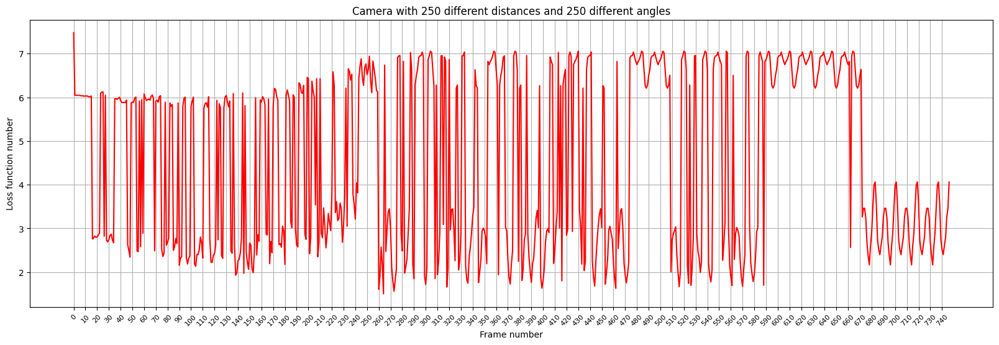

In [ ]:
# import matplotlib.pyplot as plt

# # example x data
# x = list(range(len(gt_coord_loss[0][0])))

# # example y data for the first series
# y = gt_coord_loss[0][0]

# # plot the series
# plt.plot(x, y, color='red')
# plt.title('Camera with 250 different distances and 250 different angles')
# plt.xlabel('Frame number')
# plt.ylabel('Loss function number')

# # display the plot
# plt.show()

import matplotlib.pyplot as plt

# example x data
x = list(range(len(gt_coord_loss[0][0])))

# example y data for the first series
y = gt_coord_loss[0][0]

# create a larger figure with figsize parameter
plt.figure(figsize=(20, 6))  # Adjust the values as per your preference

# plot the series
plt.plot(x, y, color='red')
plt.title('Camera with 250 different distances and 250 different angles')
plt.xlabel('Frame number')
plt.ylabel('Loss function number')

# set the x-axis ticks to display every 10th number
plt.xticks(range(0, len(x), 10), rotation=45,size=8)

# Enable gridlines
plt.grid(True)



# display the plot
plt.show()


# ** 3d_plot of loss function wich high loss_func are red and low loss_func are green 
(loss function shows the distance between ground truth skeleton with predicted skeleton) **

In [ ]:
import plotly.graph_objects as go

# example x data (frame number)
x = list(range(len(gt_coord_loss[0][0])))

# example y data (loss function number)
y = [0] * len(x)  # Assuming a constant loss function number

# example z data (loss function values)
z = gt_coord_loss[0][0]

# Create a 3D scatter plot
fig = go.Figure(data=go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=2,
        color=z,
        colorscale='RdYlGn_r',  # Reverse colormap for colors
        opacity=1
    )
))

# Update the layout with axis labels and title
fig.update_layout(
    scene=dict(
        xaxis=dict(
            title='Frame number',
            tickmode='linear',
            tick0=0,
            dtick=10,
            tickangle=50,  # Rotate the tick labels by 45 degrees
            tickfont=dict(size=9),  # Set the size of the tick labels
            showgrid=True  # Show gridlines on the axis
        ),
        yaxis_title='Loss function number',
        zaxis_title='Loss function value',
        # zaxis_title='Logarithmic Loss function value',  # Update the axis title
        zaxis=dict(type='log')  # Use a logarithmic scale for the z axis
  
    ),
    title='Loss Function Visualization in 3D',
    width=900,  # Set the width of the plot
    height=800  # Set the height of the plot
)

# Display the plot
fig.show()


# **3d plot to show all loss function corespond to each angles and distances of camera**

In [ ]:
loss_function_values = gt_coord_loss[0][0]
print(len(loss_function_values))
# loss_function_values = [[4.780950740125747, 6.672061378360859, 6.672061378360859, ...]]


import plotly.graph_objects as go
import numpy as np

# Example range of x, y, z values
x_range = range(-5, 6)
y_range = range(2, 7)
z_range = range(-5, 6)

# Create empty lists to store x, y, z coordinates and colors
x = []
y = []
z = []
colors = []
hovertext = []

# Iterate over the ranges and generate coordinates, colors, and hovertext
for y_val in y_range:
    for z_val in z_range:
        for x_val in x_range:
            x.append(x_val)
            y.append(y_val)
            z.append(z_val)
            idx = (y_val - 2) * 11 * 11 + (z_val + 5) * 11 + (x_val + 5)
            if idx < len(loss_function_values):
                color = loss_function_values[idx]
                if color > 4:
                    colors.append('red')
                else:
                    colors.append('green')
                hovertext.append(f'X: {x_val}, Y: {y_val}, Z: {z_val}<br>Loss function value: {color:.2f}')
            else:
                colors.append('gray')  # Default color for points without a value
                hovertext.append(f'X: {x_val}, Y: {y_val}, Z: {z_val}<br>No loss function value')

# Create a 3D scatter plot
fig = go.Figure(data=go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=2,
        color=colors,
        opacity=1
    ),
    hovertext=hovertext,
    hoverinfo='text'
))

# Update the layout with axis labels, title, and tick marks
fig.update_layout(
    scene=dict(
        xaxis=dict(title='X', tickvals=[-5,-4,-3,-2,-1, 0,1,2,3,4, 5]),
        yaxis=dict(title='Y', tickvals=[2, 3, 4, 5, 6]),
        zaxis=dict(title='Z', tickvals=[-5,-4,-3,-2,-1, 0,1,2,3,4, 5])
    ),
    title='Loss Function Visualization in 3D',
    width=900,  # Set the width of the plot
    height=800  # Set the height of the plot
)

# Display the plot
fig.show()


green_count = sum(color == 'green' for color in colors)
red_count = sum(color == 'red' for color in colors)
print(f'number of green_point={green_count},red_point={red_count}')



747


number of green_point=306,red_point=299


# **3-D plot for one camera with all distances and all angles:**

In [ ]:
import plotly.graph_objs as go

# example x data
x = list(range(len(gt_coord_loss[0][0])))

# example y data for the first element
y1 = gt_coord_loss[0][0]

# create a 3D scatter plot for the first camera view with the loss function as the z-axis
fig = go.Figure()

fig.add_trace(go.Scatter3d(
    x=x,
    y=[0]*len(x),
    z=y1,
    mode='lines',
    name='Camera View',
    line=dict(color='red', width=1.5)
))

# update the layout of the plot with the appropriate axis labels and title
fig.update_layout(scene=dict(xaxis_title='Frame number', yaxis_title='Camera view', zaxis_title='Loss function number'),
                  title='3D-plot of Loss function plot for the Camera with 250 different distances and 250 different angles')

# display the plot
fig.show()


# **2d-plot for 4 cameras loss function:**
this is not necessary for all distance

In [ ]:

# import matplotlib.pyplot as plt


# # data is a list of four arrays, each with different x and y values

# fig, axs = plt.subplots(2, 2, figsize=(10, 8))

# # example x data
# x = list(range(len(gt_coord_loss[1][0])))

# # example y data for 4 different series
# y1 =gt_coord_loss[0][0]
# y2 =gt_coord_loss[1][0]
# y3 =gt_coord_loss[2][0]
# y4 =gt_coord_loss[3][0]

# # plot each series with a different color
# axs[0, 0].plot(x, y1, color='blue')
# axs[0, 0].set_title('1.Right-side camera')
# axs[0, 0].set_xlabel('Frame number')
# axs[0, 0].set_ylabel('Loss function number')

# axs[0, 1].plot(x, y2, color='red')
# axs[0, 1].set_title('2.Left-side camera')
# axs[0, 1].set_xlabel('Frame number')
# axs[0, 1].set_ylabel('Loss function number')

# axs[1, 0].plot(x, y3, color='green')
# axs[1, 0].set_title('3.Front-side camera')
# axs[1, 0].set_xlabel('Frame number')
# axs[1, 0].set_ylabel('Loss function number')

# axs[1, 1].plot(x, y4, color='purple')
# axs[1, 1].set_title('4.Rear-side camera')
# axs[1, 1].set_xlabel('Frame number')
# axs[1, 1].set_ylabel('Loss function number')

# # add labels and title
# # fig.text(0.5, 0.02, 'Frame number', ha='center')
# # fig.text(0.04, 0.5, 'Loss function number', va='center', rotation='vertical')
# fig.suptitle('2D-plot of Loss function plot comparing ground truth and predicted landmarks for four camera views', fontsize=16)

# # adjust the distance between each subplot
# plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.4)

# # display the plot
# plt.show()


# **3d-plot for 4 cameras loss function:**
this is not necessary for all distance

In [ ]:
# import plotly.graph_objs as go

# # example x data
# x = list(range(len(gt_coord_loss[1][0])))

# # example y data for 4 different series
# y1 = gt_coord_loss[0][0]
# y2 = gt_coord_loss[1][0]
# y3 = gt_coord_loss[2][0]
# y4 = gt_coord_loss[3][0]

# # create 3D scatter plots for each camera view with the loss function as the z-axis
# fig = go.Figure()

# fig.add_trace(go.Scatter3d(
#     x=x,
#     y=[0]*len(x),
#     z=y1,
#     mode='lines',
#     name='Right-side camera',
#     line=dict(color='blue', width=3)
# ))

# fig.add_trace(go.Scatter3d(
#     x=x,
#     y=[1]*len(x),
#     z=y2,
#     mode='lines',
#     name='Left-side camera',
#     line=dict(color='red', width=3)
# ))

# fig.add_trace(go.Scatter3d(
#     x=x,
#     y=[2]*len(x),
#     z=y3,
#     mode='lines',
#     name='Front-side camera',
#     line=dict(color='green', width=3)
# ))

# fig.add_trace(go.Scatter3d(
#     x=x,
#     y=[3]*len(x),
#     z=y4,
#     mode='lines',
#     name='Rear-side camera',
#     line=dict(color='purple', width=3)
# ))

# # update the layout of the plot with the appropriate axis labels and title
# fig.update_layout(scene=dict(xaxis_title='Frame number', yaxis_title='Camera view', zaxis_title='Loss function number'),
#                   title='3D-plot of Loss function plot comparing ground truth and predicted landmarks for four camera views')

# # display the plot
# fig.show()


**Bar 2d-plot for 4 cameras loss function:**
this is not necessary for all distance

In [ ]:
# import matplotlib.pyplot as plt
# averag_loss_all_cams=[]
# for i in range(0,4):
#  averag_loss_all_cams.append(np.mean(gt_coord_loss[i][0]))
# # print(averag_loss_all_cams)



# labels = ['Right camera', 'Left camera', 'Front camera', 'Rear camera']

# fig, ax = plt.subplots()

# ax.bar(labels, averag_loss_all_cams)

# # add labels to the x and y axis
# ax.set_xlabel('Camera View')
# ax.set_ylabel('Loss Function')

# # add titles to each bar and display the value on it
# for i, v in enumerate(averag_loss_all_cams):
#     ax.text(i, v+0.025, str(round(v,2)), color='black', ha='center', fontweight='bold')

# # add a title to the plot
# ax.set_title('Loss Function Comparison for Four Camera Views')

# # show the plot
# plt.show()



#**Calculate the Joint by Joint Loss function:**

```
this command calculate the precise  value of subtract of 2 set of 3d array:
        landmarks[land_counter].append(np.linalg.norm(np.array(gt_landmarks[i][:3]) -np.array(new_all_lists_p[coord_num][i][0:3])))

above command is equal to the below command:
    # sqrt((x_gt1 - x_pred1)^2 + (y_gt1 - y_pred1)^2 + (z_gt1 - z_pred1)^2)
    d=np.sqrt((np.array(gt_landmarks[i][0])-np.array( new_all_lists_p[coord_num][i][0]))^2 + (np.array(gt_landmarks[i][1])-np.array( new_all_lists_p[coord_num][i][1]))^2 + (np.array(gt_landmarks[i][2])-np.array( new_all_lists_p[coord_num][i][2]))^2)
    landmarks[land_counter].append((gt_landmarks[i][3:5],d))

    output is-->file coordinates0=[[[([10, '0'], 4.158837660771795), ([10, '1'], 3.7203367918084407), ([10, '2'], 3.6091547940439934), 
        
```



In [ ]:
# print(gt_landmarks[0])

# coord_num=0



gt_pred_landmarks_subtract=[]#gt_landmarks[i][:3])-new_all_lists_p[coord_num][i][0:3] for all frames for all coordinates

for coord_num in range(0,len(file_paths)):
  landmarks=[[] for _ in range(0,13)] 
  land_counter=0

  for i in range(0,len(gt_landmarks)):
      if land_counter<=12 :  
        # print(land_counter)

        # Calculate the Euclidean distance between the points# dist = np.linalg.norm(x - y)
        # landmarks[land_counter].append((gt_landmarks[i][3:5], np.linalg.norm(np.array(gt_landmarks[i][:3]) -np.array(new_all_lists_p[coord_num][i][0:3]))))  #--->file coordinates0=[[[([10, '0'], 4.158837660771795), ([10, '1'], 3.7203367918084407), ([10, '2'], 3.6091547940439934), 
        landmarks[land_counter].append(np.linalg.norm(np.array(gt_landmarks[i][:3]) -np.array(new_all_lists_p[coord_num][i][0:3])))    

        
        # landmarks[land_counter].append((gt_landmarks[i][3:5],np.array(gt_landmarks[i][:3])-np.array( new_all_lists_p[coord_num][i][0:3])))
       
        # landmarks[land_counter].append(np.array(gt_landmarks[i][:3])-np.array( new_all_lists_p[coord_num][i][0:3]))
       
        # print(f'{gt_landmarks[i][3:5]}={np.array(gt_landmarks[i][:3])- np.array(new_all_lists_p[coord_num][i][0:3])}')
        land_counter+=1
      else:
        land_counter=0
        # print(land_counter)

        # landmarks[land_counter].append((gt_landmarks[i][3:5], np.linalg.norm(np.array(gt_landmarks[i][:3]) -np.array(new_all_lists_p[coord_num][i][0:3]))))
        landmarks[land_counter].append(np.linalg.norm(np.array(gt_landmarks[i][:3]) -np.array(new_all_lists_p[coord_num][i][0:3])))
        # print(f'{gt_landmarks[i][3:5]}={np.array(gt_landmarks[i][:3])- np.array(new_all_lists_p[coord_num][i][0:3])}')
        land_counter+=1
        
  # Reset land_counter for next iteration of outer loop
  land_counter = 0
  gt_pred_landmarks_subtract.append(landmarks)


# for coord_num in range(0,4):
#   filename = f"/content/drive/MyDrive/BishopThesisv9-Medapipe-unity/output/Euclidean_dist_gt_pred_each_joint_for_all_fram/coordinates{coord_num}.txt"
#   print(f'file coordinates{coord_num}={gt_pred_landmarks_subtract[coord_num]}')
#   with open(filename, "w") as file:
#         file.write(str(gt_pred_landmarks_subtract[coord_num]))
#         print(f"File '{filename}' created and written successfully.")

import csv
import os
output_path ="/content/drive/MyDrive/BishopThesisv9-Medapipe-unity/output/Euclidean_dist_gt_pred_each_joint_for_all_frame"
for coord_num in range(0,len(file_paths)):
  print(f'file coordinates{coord_num}={gt_pred_landmarks_subtract[coord_num]}')
  # filename = f"coordinates_{coord_num}.csv"
  # file_path = os.path.join(output_path, filename)
  # with open(file_path, 'w', newline='') as file:
  #   writer = csv.writer(file)
  #   writer.writerow(gt_pred_landmarks_subtract[coord_num])
  #   print(f"File '{filename}' created and written successfully.")


file coordinates0=[[3.4150937024840182, 3.054208971137371, 3.054208971137371, 3.054208971137371, 3.054208971137371, 3.0544680086998786, 3.0542159562102023, 3.05519760141746, 3.0563649728900173, 3.0623849806792744, 3.071538854950398, 3.072342413299826, 3.0656430416532516, 3.0623103728071066, 3.062459714022374, 3.066424719145572, 3.6389380903085495, 3.6201223483774965, 3.62440055008271, 3.626498446780926, 3.7190685517597983, 3.6794379127861983, 3.719168076250731, 3.0828683048935126, 3.1123788978710487, 3.1064557182488532, 3.642310581372887, 3.0732552030788134, 3.6166933170803093, 3.6347305188117898, 3.8784401055543682, 3.6216826648467206, 3.682942993267294, 3.6100962568073167, 3.5869072345775947, 3.067223345675857, 3.0734417390700606, 3.111789956429257, 3.13339709506695, 3.1276941687462023, 3.0794355513491425, 3.0675278422839134, 3.061346102652557, 3.0740013281431744, 3.0955213847476486, 3.148555274480662, 3.7621458153740925, 3.7190581030309757, 3.6981768867603675, 3.0643018261853707, 3.

**Plot Loss function by comparing the difference between groundtruth and predicted kandmark base on joint by joint and for all frames**

In [ ]:
# plot for 4 cameras --Mian Part-----------
import plotly.graph_objs as go

camera_dict={0:'right_side', 1:'left_side', 2:'front', 3:'rear'}
for camera_num in range(0,len(file_paths)):
# camera_num=0 #i have 4 camera 0 to 3
  file = gt_pred_landmarks_subtract[camera_num] #[coord_num]  # replace with your data

  # define the labels for the axis
  frames = range(len(file[0][:]))
  
  landmarks = ['Right_Foot_Ankle', 'Left_Foot_Ankle', 'Right_knee', 'Left_knee', 'Right_hip', 'Left_hip', 'Right_shoulder', 'Left_shoulder', 'Right_elbow', 'Left_elbow', 'Right_hand', 'Left_hand', 'head']  # replace '...' with the remaining landmark names

  # create the scatter plot
  # fig = go.Figure(data=[go.Scatter3d(x=[i]*len(frames), y=list(frames), z=file[i], mode='markers', marker=dict(size=2), name=landmarks[i]) for i in range(len(landmarks))])
  fig = go.Figure(data=[go.Scatter3d(x=[i]*len(frames), y=list(frames), z=file[i], mode='lines', marker=dict(size=2), name=landmarks[i]) for i in range(len(landmarks))])

  # set the axis labels
  fig.update_layout(scene=dict(xaxis_title='Landmarks', yaxis_title='Frames', zaxis_title='Loss functions'))

  # 0=right_side  1=left_side  2=front  3=back
  # set the title of the plot
  # fig.update_layout(title=f'Loss function plot between landmarks form  Camera with {camera_dict(camera_num)} view of Animation and predicted landmarks')
  fig.update_layout(title=f'Loss Function Plot Between Landmarks From Camera with {camera_dict[camera_num].title()} View of Animation and Predicted Landmarks')

  # enable interactivity
  fig.show()





#------------------------------3d plot skeleton+loss function:-------------------------------

#below cell is temporary ,it's just for trace the plot skeletons loss function without running all previuse cells:

In [ ]:
# gt_pred_landmarks_subtract=[]
# gt_pred_landmarks_subtract.append([[3.4150937024840182, 3.054208971137371, 3.054208971137371, 3.054208971137371, 3.054208971137371, 3.0544680086998786, 3.0542159562102023, 3.05519760141746, 3.0563649728900173, 3.0623849806792744, 3.071538854950398, 3.072342413299826, 3.0656430416532516, 3.0623103728071066, 3.062459714022374, 3.066424719145572, 3.6389380903085495, 3.6201223483774965, 3.62440055008271, 3.626498446780926, 3.7190685517597983, 3.6794379127861983, 3.719168076250731, 3.0828683048935126, 3.1123788978710487, 3.1064557182488532, 3.642310581372887, 3.0732552030788134, 3.6166933170803093, 3.6347305188117898, 3.8784401055543682, 3.6216826648467206, 3.682942993267294, 3.6100962568073167, 3.5869072345775947, 3.067223345675857, 3.0734417390700606, 3.111789956429257, 3.13339709506695, 3.1276941687462023, 3.0794355513491425, 3.0675278422839134, 3.061346102652557, 3.0740013281431744, 3.0955213847476486, 3.148555274480662, 3.7621458153740925, 3.7190581030309757, 3.6981768867603675, 3.0643018261853707, 3.0721092896897404, 3.120122307842114, 3.1747490252103394, 3.1677570601738068, 3.895495816692807, 3.7698852571299173, 3.0742687836527893, 3.7454047583622594, 3.1449505212387683, 3.980012790640239, 3.179268422468603, 3.097795367337552, 3.0814530480093314, 3.07953760258809, 3.090983910109045, 3.120164370428744, 3.203742080972499, 3.177871504665505, 3.1285080549933064, 3.804062026834314, 3.077171039763308, 3.083841726787061, 3.1488978417879805, 3.2250312162211703, 3.2130492886866833, 3.9654427188278, 3.9195660653937856, 3.84683464917142, 3.0878663215691513, 3.8796045498290495, 3.8702411012727382, 3.984007230320727, 3.1047363816192193, 3.080034761931917, 3.0678080108595456, 3.913561083090695, 4.03246580171641, 4.039307537001701, 3.95419773324637, 3.1432892934283028, 3.7359807642545673, 3.840599718917033, 3.8477948123550565, 3.169941085278558, 3.2691192673827305, 3.2520788905297175, 4.05799804005472, 3.9357493552433587, 3.918673720199596, 3.89288216916727, 3.205618933862695, 3.2685694996095767, 3.2485771458627855, 3.8742340961933026, 3.913930107192048, 3.989067478507485, 3.988035712647625, 3.993675640410478, 4.060175466950109, 4.007651128176693, 3.9050244871928665, 3.0811798036495697, 3.074443003722951, 3.0912250634303544, 3.1966389322183386, 3.3162589745430013, 4.020435808128362, 3.9997045372235687, 3.9639505917844025, 3.9032329163432147, 3.907520110803334, 3.964530180232514, 3.312369387242009, 3.838898563934714, 3.126822354652883, 3.0907306952185274, 3.4823689670176208, 3.6452207661901213, 3.180721092281749, 3.3374877308971493, 3.273037106233597, 3.182484694515749, 3.0862657706973327, 3.079685974052712, 3.6301180001751714, 3.7936298500330694, 3.3585919623194775, 3.7278785492653053, 3.637183072480961, 3.592215223490227, 3.626214576235395, 3.7050526051877477, 3.8678997176745966, 3.9126029215162674, 3.3210201362903535, 3.7194645882084187, 3.096685583771462, 3.604077265605852, 3.590684906206785, 3.6441364777899348, 3.84521652067267, 3.8086440644155344, 3.7852983089412544, 3.7506154906059592, 3.757154050306422, 3.1083626796255612, 3.7806902121944774, 3.838219452209251, 3.7929757052154445, 3.1741394182885228, 3.0864204433424165, 3.0809388687666295, 3.1221666318097117, 3.2957255615257166, 4.003759953455634, 3.9567902658096115, 3.148389492749587, 3.748760199026179, 3.6500914257207704, 3.668455893547023, 3.2195602741285962, 3.4103071008344688, 3.330276091681889, 3.2165300139917865, 3.0958734960214382, 3.79414658335891, 3.8057162730570915, 3.761757434068556, 3.8544138148414073, 3.8629526643873535, 4.0431167207105085, 3.0885454718349217, 3.0834439043097577, 3.1322986816336655, 3.3205444191103664, 4.217132846993213, 3.9752377485877104, 3.1583210585350563, 3.107651763424274, 3.7385781837613448, 3.7767590028197584, 4.01640036821967, 3.439527535633637, 3.3537288840891715, 3.2314897218895804, 3.0987424723037247, 3.0965687852817023, 3.8810899541598864, 4.0857917305348, 3.4552035552049607, 3.4212187702118673, 3.885653192093365, 4.021015825408173, 3.085983711950211, 3.142624545505556, 3.3424740622791673, 4.488344213165571, 3.3994151512371946, 3.896680169758568, 3.9481755401850203, 3.092609949520631, 3.868250693003523, 3.9619039153508027, 4.115428971465537, 4.071341088484938, 4.090689894686471, 4.111798016458217, 3.996983956961849, 3.974628688776786, 4.00961727624752, 4.134238972275664, 3.4402649653462745, 3.2102181050813354, 3.9687803971700353, 3.914012417717003, 3.9100020792513117, 4.174038961308553, 4.157789910606742, 4.181688127216967, 3.942019600547427, 3.835329352326947, 3.793014478249339, 3.171802710393728, 3.880926824174857, 3.4816633160496724, 3.387885648184868, 3.2570826163298348, 3.1056160602529412, 3.8813885775770047, 3.961524406129921, 4.0859662637372045, 4.082795994186222, 4.033290229845951, 3.2206416408875733, 3.096749315056839, 3.095115985272927, 3.1613313028162677, 3.377230324052832, 3.4801954176255676, 3.42937013575117, 3.185413282570568, 3.1204040155874044, 3.106070527639384, 3.180486216154536, 3.2815093355139187, 3.4936127959762513, 3.3766118049189484, 3.244792749461358, 3.1221525117205595, 3.1352930111906603, 3.637863522747314, 3.7447777354136194, 3.7695411824097493, 3.7762047818480067, 3.6581481999757495, 2.9313461196510042, 3.42028819548968, 3.3419672819876793, 3.2802540816750128, 3.2585115061301546, 3.343244838801369, 3.4008093747011507, 3.51343353428105, 3.5822068747271993, 3.7390985843093807, 3.8068627458194437, 3.2358676495340473, 3.2625651372878366, 3.2486569188232233, 3.5718376906434255, 3.394846898893014, 3.0408370970155567, 3.5521002920704836, 3.565088871111313, 3.626471277776407, 3.6673931939152364, 3.40022677569687, 2.8807430158797573, 2.911137711000461, 3.4837000333211794, 3.4343246405349404, 3.0482548654043025, 3.1279094482911427, 3.1698404134998657, 3.235866243991708, 3.2625651372878366, 3.2486576240005656, 3.163811383777168, 3.0752852613323536, 3.6170813512398174, 3.516690022065391, 3.4801428932685883, 2.900880110228963, 2.881284315869227, 2.877146016711178, 2.88074285041567, 2.911137820941324, 2.961227726481535, 3.707022762742785, 3.0482543151520347, 3.70830954080717, 3.780670395205794, 3.8225469604119127, 3.2625650234968497, 3.2486583230496864, 3.872702536159238, 3.075285799087623, 3.040838294308166, 3.725884882440238, 3.644948230959433, 2.9008807397001, 3.466268084658974, 3.523634960015186, 3.5814433632204867, 3.5777616930714418, 3.6375017331184045, 2.9894430178889513, 3.0482537649003243, 3.9109379607095107, 3.918292838639698, 4.120215067264808, 3.2625664285051728, 3.2486589096724208, 3.163814044437663, 3.7934102843241937, 3.788539241207057, 3.7705712109586447, 3.70850335207479, 3.6564012024265917, 3.6929482450474747, 3.7993104251452645, 3.7476733179291903, 2.911136540186839, 2.961225905020588, 2.9894417662316153, 3.7699492749969132, 3.8541098089664008, 3.922858740577728, 3.9962213318978965, 4.024447212965851, 4.055343835276094, 3.967929798246665, 3.8622026139779373, 3.040840889082492, 2.977763928464948, 2.9218374104480898, 2.9008819986429994, 2.881284934805824, 2.877145398791309, 2.8807416048873598, 2.911135259433165, 2.9612252464859883, 3.6431322225811735, 3.0482518129270426, 3.1279046903659005, 3.1698363471709383, 3.235863544262953, 3.2625663147145376, 3.6543796859842224, 3.7966258983698915, 3.7276685822246978, 3.7375619654446512, 3.588141975196939, 3.4363056837388073, 3.3914993272744005, 2.881284167294507, 2.8771461674591716, 2.8807417468372623, 2.911135259433165, 3.4162503356667786, 2.9894399119621053, 3.0482511336033324, 3.6106752210845894, 3.687507740501622, 3.7818991134224347, 3.8438621942631617, 3.2486623047488328, 3.6959032463628887, 3.579138733321606, 3.5013616879421128, 3.413207237303966, 3.3865076317857223, 3.400011396249834, 3.4162735089928358, 3.432475116907337, 3.462758807793571, 3.5251512063963544, 2.9612233469669254, 3.5273672700299916, 3.5449310084376857, 3.5174270024075294, 3.5142583960746556, 3.5118082275702145, 3.6606714445005584, 3.778246345479222, 3.814516941676021, 3.0752845805455142, 3.0408370970155567, 2.977760151547132, 3.44720599374253, 3.3762682538848994, 3.309868343414443, 3.1692644669685603, 2.880743977514142, 3.368425746048931, 2.9612344318655355, 3.751207393081244, 3.048261271586968, 3.127921057805967, 3.169852181331016, 3.703023638572183, 3.759466488255087, 3.2486483749396458, 3.1637932136203215, 3.0752708864285436, 3.4339875838980447, 2.9777479238365694, 2.9218242967711117, 2.9008723149116715, 2.881283189999553, 2.8771460316476816, 3.4468148411226176, 3.5549630701837183, 3.591151359831615, 2.9894623568504755, 3.862738954374926, 4.067854929781992, 3.169868841346279, 3.2358856941661274, 3.2625606551832873, 3.248637834100009, 3.1637730668339663, 3.70292287503962, 3.6916336109689625, 3.7295809230695425, 3.6319058506883986, 3.553130050665274, 3.5866547324989897, 3.696297142432902, 3.7268242170602432, 3.7624997805493487, 2.961257958971491, 2.9894738398126184, 3.7621901376469755, 3.8264584251224845, 3.8700334400864915, 3.8972494693068382, 3.966671989062338, 3.9841938596363122, 3.9084947786559305, 3.821850290290562, 3.7934568787100957, 3.7422856043673884, 2.921805085492357, 3.6014802366496435, 3.55037131522991, 3.5527503570244834, 3.571764451335003, 3.6897658177096058, 3.76890251225336, 3.7935323190252728, 3.8084458719491563, 3.8509166321671566, 3.889297423341765, 3.235907844128754, 3.262555466904279, 3.248615940993641, 3.1637343070370174, 3.075227867510796, 3.040784818643371, 2.977711144576317, 2.9217959648021283, 2.9008507624538358, 2.8812789146412046, 2.877146363448686, 2.880759206760954, 2.91117624386381, 2.961280827878538, 2.989497536832737, 3.048306235081213, 3.1279934985504685, 3.169917185955021, 3.2359188634633593, 3.2625526408832086, 3.248605406335771, 3.1637133334562724, 3.0752148543937543, 3.040771474390175, 2.9776984203731915, 2.9217873160024843, 2.9008439293714163, 2.8812777888148866, 2.877146529167223, 2.880762998525738, 2.911185191853311, 2.9612924175476154, 2.9895090200357313, 3.0483181531508485, 3.1280083430914947, 3.5736213703208617, 3.58695310647172, 3.6492382463431148, 3.680200347461399, 3.5715082743002178, 3.666633734521122, 3.732398821587195, 3.6115858789766, 3.5491280417077697, 2.900836505215866, 2.88127668127221, 2.877146076966027, 2.8807671212630153, 2.911193827777189, 3.4403713437142414, 3.542314733095251, 3.0483288416563585, 3.692592327879399, 3.758252588905844, 3.860839077538472, 3.262547452659808, 3.2485843309577174, 3.619604917206219, 3.432100379745445, 3.3520793051538615, 3.522205751265535, 3.4724573040602738, 2.9008292103964, 2.8812747879482097, 2.8771462427005687, 2.880771078577748, 2.9112024637778116, 3.504478152335698, 3.5124259309701857, 3.4937098319441473, 3.5464186282277264, 3.169962142564482, 3.235948741318379, 3.2625458040692705, 3.2485790636552156, 3.163667155784407, 3.0751824121601308, 3.0407441641298925, 2.9776750219471566, 3.5646315084146454, 3.6078473787296157, 3.5018065813113264, 2.877146393431172, 2.8807688712553805, 3.780211096852768, 3.8643121192410463, 3.8289294355722157, 3.7683496477935865, 3.128024829790518, 3.7027714494540085, 3.8378341868083057, 3.850437660502661, 3.880667843311466, 3.852362798509052, 3.8222125358958996, 3.890637706382325, 3.884528698508363, 3.764475577213538, 3.63798363418073, 2.881277318473354, 2.8771471616629207, 2.8807642676338516, 3.5365832922539098, 3.7018731082842624, 3.805588640339945, 3.841976642114628, 3.9506885777156104, 4.093460420648587, 4.061210851067104, 4.059718558879971, 3.248603534069524, 3.1637127699393, 3.0752143166651, 3.04077406911431, 3.7617255731271175, 2.921789867164475, 2.9008475768225046, 2.881278444295344, 2.877146378014334, 2.8807596876145363, 2.91117624386381, 2.9612801693271105, 2.9894942848965274, 3.0483017808092754, 3.127985267457154, 3.1699068066381697, 3.235911246255991, 3.262554881903598, 3.248615354383156, 3.1637348705599524, 3.075229086020422, 3.0407894328588423, 2.9777162334347778, 2.9218002634016584, 2.900855668848245, 2.881279403267583, 2.8771462123020446, 2.880755084108852, 2.9111663273164243, 2.9612669903919504, 2.989481760153254, 3.0482890113604713, 3.127964712594757, 3.169888873451087, 3.235900226934075, 3.2625578217311335, 3.24862718084501, 3.1637543106363366, 3.0752455406965473, 3.040803974473527, 2.9777289577384307, 2.9218114634707355, 2.9008635933052767, 2.8812814452092317, 2.877145428675096, 2.8807512689000068, 2.911157855763579, 2.961254315980983, 2.9894676919809653, 3.048278323013172, 3.1279449665994763, 3.1698709402931535, 3.2358869883600696, 3.2625606551832873, 3.24864053011856, 3.1637771180061027, 3.0752618524052555, 3.0408186652381954, 2.977742834900623, 2.921821107754032, 2.9008715178196014, 2.881282404201296, 2.8771460316476816, 2.8807459008027765, 2.9111474631412957, 2.9612402465421477, 2.989454500713299, 3.048265003403411, 3.1279251260138885, 3.169852181331016, 3.2358752666950865, 3.262564073654493, 3.248652356633132, 3.1637999254608373, 3.0752781641877536, 3.0408326317817953, 2.9777568714079057, 2.921831670178999, 3.4691120436030456, 2.8812842975806814, 2.877145865963872, 2.88074285041567, 2.9111384613188704, 2.9612270679463273, 2.9894410994935154, 3.048252363178121, 3.1279046903659005, 3.1698335378410643, 3.7658016850998672, 3.7993671545627175, 3.7899763766046086, 3.7110308291500353, 3.6202133661165607, 3.583612916266069, 3.5112595433168994, 3.440794680398265, 3.411419373328498, 3.37745639371421, 3.3707133144407284, 3.381433926014376, 3.4336749522843597, 3.495622503411517, 3.525032193297956, 3.5799515930987114, 3.6572625393445573, 3.698309203976325, 3.765787654754447, 3.7993679107985843, 3.7899878193050967, 3.711054100043814, 3.620231970336155, 3.583630195668911, 3.5112758690131427, 3.4408105983750397, 3.4114310953114675, 3.377460673686964, 3.3707102722117783, 3.3814253527249423, 3.433660568507901, 3.4956065838377746, 3.5250186133742614, 3.5799400290430845, 3.6572424990495227, 3.6982902641930364, 3.765774493502499, 3.799369364829116, 3.7899980282542365, 3.7110761758780972, 3.6202484678079765, 3.5836467340647573, 3.511293114922336, 3.440824799245379, 3.4114424652785806, 3.3774641565572536, 3.3707084135430643, 3.381415160734629, 3.4336457810212457, 3.4955918568085145, 3.5250054410077154, 3.5799289870328432, 3.6572240348075473, 3.6982714820600986, 3.7657620314877835, 3.799370818873304, 3.7900073990363135, 3.7110989664634384, 3.6202666153261425, 3.583662827775236, 3.511309019414412, 3.440839832402113, 3.4114554513932904, 3.377468436539711, 3.370705835993702, 3.381406943257939, 3.433629643570197, 3.495580505542105, 3.524992374244801, 3.579916618822567, 3.6572060586064876, 3.698253407778461, 3.7657474926610517, 3.799371427335448, 3.3813975437806776], [3.374604275370669, 3.2110671422170545, 3.2110671422170545, 3.2110671422170545, 3.2110671422170545, 3.2110056951529997, 3.210666886665915, 3.211001897499595, 3.2113701015026286, 3.213897987017478, 3.217856560553469, 3.2183829039955762, 3.216621743527361, 3.2159114864562115, 3.2161356601987428, 3.217032845623588, 3.678171934199663, 3.670263861380956, 3.670695080774647, 3.6803354973213636, 3.7240448022389483, 3.7138308438268943, 3.7511610222026928, 3.2212084938143946, 3.2331850113833576, 3.2313022082245726, 3.6857905549403878, 3.2185371952565656, 3.6157154949166666, 3.648536218541034, 3.8347311872264793, 3.6020488803182937, 3.67167020767417, 3.6376977864669646, 3.598323695319797, 3.2108601109475328, 3.20925919489623, 3.2222169278082444, 3.2302151706151094, 3.227484720307286, 3.2102447250916866, 3.2055507466759905, 3.2030265749576605, 3.203935835509351, 3.211271485734117, 3.230680661305447, 3.7274063733801017, 3.705991340054641, 3.7305501278388613, 3.201719239410289, 3.202001873742425, 3.2190177836423954, 3.2402739926106556, 3.2382768235072183, 3.9248751583002295, 3.7838804028065818, 3.208642944119055, 3.722608243632005, 3.226713903107928, 3.904063819826168, 3.2433285770695512, 3.213339814135754, 3.2079320986082296, 3.2096167438417007, 3.205892989086816, 3.2150161081696, 3.247680085838043, 3.2402003317293517, 3.2229114586054024, 3.7905543321892416, 3.204373878251725, 3.20116428303797, 3.2223257801314875, 3.251266765039436, 3.247053362321753, 3.959137924334434, 3.942086086957946, 3.864911528819823, 3.196374173388654, 3.815748937410554, 3.8477692123226443, 3.9646554966266927, 3.204436296384904, 3.196640049557817, 3.1939814627553806, 3.937397578699606, 4.004598662214502, 4.013011291911182, 3.9205585367798053, 3.216636383461612, 3.718041351810851, 3.8215431352314675, 3.8139377669206262, 3.216518047559193, 3.25590437210017, 3.2506438901222325, 4.036785895247434, 3.94145678721972, 3.920136786133564, 3.869840445819425, 3.2262023770442547, 3.2519693996326287, 3.2473853279072076, 3.8628774451884462, 3.884555779715575, 3.956439146888032, 3.9448875845832228, 3.949953332578173, 3.974765941592906, 3.945663543564648, 3.881919964872597, 3.192427191804536, 3.1891424227848466, 3.1855134520483506, 3.2172729676388974, 3.2667615742396934, 3.9455347541182086, 3.9307506280058697, 3.908473902374612, 3.8752473608139817, 3.866778670949407, 3.877568430086462, 3.260864479302076, 3.779589301280018, 3.1992876629529583, 3.1903227607369136, 3.450845138901345, 3.537394968123103, 3.2063532305917266, 3.269231550912997, 3.248431133996379, 3.2184349858634707, 3.190448359083563, 3.1875416286611853, 3.6421480342748853, 3.766703790141771, 3.276473694790483, 3.6567364007808347, 3.6262123342491446, 3.6241371664527495, 3.6636673963218924, 3.6874596718172077, 3.797061186447183, 3.8359962997760118, 3.263098922609304, 3.742523319054268, 3.1880649051870007, 3.5626391095727734, 3.561742024437266, 3.636836080918323, 3.75143420701293, 3.77039644241026, 3.786967892406052, 3.754698571655341, 3.7336294709146367, 3.1791744670215882, 3.6768012977730047, 3.7358657113475164, 3.7423287394497806, 3.2069928157861534, 3.190601003192659, 3.191187908226183, 3.178779372163787, 3.2338690910446575, 3.919431711378413, 3.898584730840769, 3.1948290984404784, 3.662193813658667, 3.5947929119779833, 3.6445404501336234, 3.2035280420678385, 3.2858863820823143, 3.2603682068102366, 3.21960085176315, 3.1875322157195525, 3.8036218764466274, 3.7754559636358227, 3.6798261967499872, 3.7795401000455517, 3.825799011625255, 3.9236619637840477, 3.1883630126334417, 3.1897700872752566, 3.175960632218227, 3.2352193791849726, 4.078655165857627, 3.920751998079541, 3.1925901488600132, 3.183932812843418, 3.6804128179718796, 3.7224597150596965, 3.875298918920353, 3.294227272838503, 3.2659501684786925, 3.219982113843181, 3.1848301853714274, 3.185480943210145, 3.8565817888091094, 3.9505316079903112, 3.304139388334276, 3.2945219775150996, 3.780616546375561, 3.8883328494782847, 3.1884996159051044, 3.173511360538355, 3.2362381894250305, 4.284859944798966, 3.283778541274365, 3.8861855728851276, 3.8660196028529605, 3.186709319855829, 3.7479683331284313, 3.8383680460644314, 4.005568834850274, 4.010959891479488, 4.038923325057254, 4.068778383702023, 3.9585948885053366, 3.9112397694493604, 3.913532256689282, 4.01307844247822, 3.302416841437646, 3.2038550657994818, 3.835629073671535, 3.8367704514297922, 3.815429234406339, 4.040928745113307, 4.060944377595994, 4.093530239824889, 3.909904922980701, 3.813789008166937, 3.7733912002641543, 3.1707398654758796, 3.762661701672996, 3.3109513400208708, 3.2746360226139637, 3.2201392980201957, 3.1808425617936513, 3.8454522419230446, 3.8574185486741888, 3.9341575230896617, 4.009743185007243, 3.989371334005489, 3.20279960796816, 3.1842266850783414, 3.1889365943596304, 3.1673738454988225, 3.237836717328562, 3.3037732140570726, 3.2960444552840915, 3.1862210375942217, 3.1758230371369875, 3.1885687941184524, 3.1662523316755724, 3.196872385429547, 3.3187583899999407, 3.276429823516597, 3.2285611833295027, 3.2131907136136504, 3.233160500094915, 3.6606977034934216, 3.7558300135962033, 3.7756562880537143, 3.8019311064601453, 3.7407896766527395, 3.1573690696934684, 3.515642365139267, 3.4851330066964636, 3.440762546600999, 3.4194764631565775, 3.4746743587682483, 3.526632438582244, 3.641695311251918, 3.6781432424878444, 3.809710476564888, 3.8320032829664434, 3.3177700075184537, 3.337540669137831, 3.331624699074162, 3.6008723362572828, 3.473146501795396, 3.2214588857208777, 3.5806183631803794, 3.740179901152755, 3.745174696200406, 3.7570790364440443, 3.548373607894932, 3.143655532759752, 3.1542667349788287, 3.555186780478738, 3.4862633642498504, 3.2168175526541756, 3.258478328126182, 3.280593177767399, 3.317769369887244, 3.337540669137831, 3.331624699074162, 3.285671771438833, 3.2393008389453426, 3.6685064913369265, 3.58753241532888, 3.585257699047259, 3.1489520254390984, 3.1430187743647027, 3.143397402394104, 3.143655532759752, 3.1542667349788287, 3.17483020910615, 3.810046439853485, 3.2168175526541756, 3.7206318700148535, 3.766799275246135, 3.8154515440381593, 3.337540669137831, 3.331625339140642, 3.902534723102631, 3.2393014611716824, 3.221459503351082, 3.8434211874961854, 3.7827435291557685, 3.1489520254390984, 3.593037983213105, 3.650811201391627, 3.7124983164765317, 3.692574645234498, 3.7257424445234664, 3.187661588304819, 3.216816932763349, 3.989323345202989, 3.9663733860891353, 4.039547046006722, 3.33754080508928, 3.331625339140642, 3.2856724034609717, 3.8309864271228964, 3.838872149868109, 3.84697342794694, 3.831548497422791, 3.830457745648471, 3.830187385648403, 3.8618449558153722, 3.846847869985485, 3.1542661714906055, 3.174828991032588, 3.1876601981726345, 3.8131216039768296, 3.8781975558180344, 3.9530478724286566, 4.024297481841657, 4.034817786746133, 4.036232406174542, 3.957771496479687, 3.886894480646443, 3.221460738612066, 3.1882311917589976, 3.159166372630128, 3.1489526183570944, 3.143017979048481, 3.143396812511109, 3.1436549396837434, 3.1542661714906055, 3.174828991032588, 3.7095876989772942, 3.2168163128727136, 3.258477074880227, 3.2805903833165457, 3.3177682331213254, 3.33754080508928, 3.6910381975934112, 3.8092026042861513, 3.7712103424541623, 3.8021916272816347, 3.671258589863667, 3.541298900532166, 3.509937067689077, 3.143017979048481, 3.143396812511109, 3.1436557317875953, 3.1542661714906055, 3.5037085833492285, 3.187659585225656, 3.2168155406490127, 3.6767655710880076, 3.7450301954810112, 3.8119063992242705, 3.852211861906854, 3.3316267354639235, 3.6987932448369536, 3.6166323637569278, 3.5637699803876095, 3.5026366903165607, 3.4892403215739054, 3.5332945452187023, 3.569277864739632, 3.6249249952954243, 3.637670397000122, 3.669240147050593, 3.1748277729598184, 3.5764223811781357, 3.594583973508341, 3.5369519336337603, 3.5192115525552925, 3.519708050498251, 3.6876101453738617, 3.8121877853553428, 3.8361024641491035, 3.2393008389453426, 3.2214590260478246, 3.1882285879593075, 3.5311339800028576, 3.491777558443589, 3.4504826298732483, 3.3246055189237786, 3.1436551347059365, 3.4043796622040716, 3.1748332808616895, 3.7827626074974585, 3.2168214243339652, 3.258484527123767, 3.280599256600843, 3.6985435177622805, 3.734768444548787, 3.331619850617564, 3.2856615352493326, 3.2392932241589367, 3.339755321648187, 3.1882220486793265, 3.1591602852318212, 3.1489474808810325, 3.1430186887174245, 3.1433958498098833, 3.5719248335077443, 3.6427588199640795, 3.6441810289689176, 3.187670519554366, 3.7435283232230576, 3.981384240265978, 3.28060876007213, 3.31778081059343, 3.337540006340748, 3.3316138576446703, 3.2856505364196904, 3.7156984720808874, 3.7475150053955666, 3.7776792332346765, 3.714038452255041, 3.6769346295376444, 3.702065359117101, 3.8178468680141733, 3.8586624020619746, 3.8411792848293036, 3.17484398154051, 3.1876752807557107, 3.7546074504107785, 3.8055710580607798, 3.8505577341029964, 3.8730305706980124, 3.931970511483576, 3.987877892639101, 3.9611136059265144, 3.890337903003103, 3.868404630049942, 3.8150975841702888, 3.159150613787352, 3.6970127782430864, 3.682258184572484, 3.688607749806166, 3.701764984575428, 3.7725673531863846, 3.831445900487923, 3.851771858429203, 3.869538869359973, 3.894020950211894, 3.9168030185441713, 3.31779350826856, 3.3375392075947214, 3.3316028806161757, 3.285629164071472, 3.2392714848528827, 3.2214316783731425, 3.188202864559594, 3.1591467697166276, 3.1489381449067873, 3.1430213452943647, 3.1433938640273826, 3.1436602417502115, 3.1542804283365484, 3.1748545379821733, 3.187686685708933, 3.216844375875526, 3.2585214420268893, 3.2806349660334053, 3.3177998662954344, 3.337538430557167, 3.331596752044281, 3.285618027880599, 3.239265114575681, 3.2214248845396036, 3.188195544002438, 3.1591423283195077, 3.1489347862318455, 3.1430214060020334, 3.143394044683548, 3.1436617673141938, 3.1542839612354183, 3.174860045946908, 3.1876926946846678, 3.2168501202894113, 3.2585296610362473, 3.580556933951684, 3.5933679849008064, 3.630866574562414, 3.6688777175191247, 3.61059755693466, 3.683616645043727, 3.744188693934673, 3.674015530760814, 3.6542390384233006, 3.148932167686849, 3.1430222620288584, 3.143393286634525, 3.143662301782747, 3.1542882795905003, 3.457181944405282, 3.514178555309595, 3.2168557123912165, 3.7295562879808157, 3.793556643531588, 3.8694035925616714, 3.3375382729014507, 3.3315859106487107, 3.6099553295733258, 3.48113399564488, 3.4044789372504765, 3.490874239450653, 3.5303771566625266, 3.1489288090350662, 3.1430227646525246, 3.143392672797498, 3.143663628361979, 3.154291065034424, 3.5736270467919136, 3.5761229925772335, 3.5318830773183465, 3.536015399771193, 3.280660051978717, 3.3178168890357704, 3.3375376318146586, 3.33158309859292, 3.2855928704227795, 3.2392478704597463, 3.221410663412692, 3.1881828992556245, 3.5875515024658506, 3.6942438084832636, 3.572661174214641, 3.1433936719116176, 3.1436632889496927, 3.814694134895341, 3.8609299690896193, 3.8243704045245703, 3.8157363300798592, 3.258537880053721, 3.7167675308248906, 3.823454569656255, 3.8135089900836663, 3.848196498281832, 3.813505547555482, 3.8217291331845082, 3.9145804677602523, 3.8992997378778393, 3.8379307011795305, 3.7595287054387265, 3.1430214667106555, 3.143393840068724, 3.1436621613885296, 3.6576585871494225, 3.724743876268055, 3.8058837892409034, 3.846298886754395, 3.9362775365347944, 4.031226076687661, 3.9915754009947024, 4.005187459950198, 3.3315961119819133, 3.2856181653203405, 3.2392644923584117, 3.221426119780337, 3.781572689007075, 3.159143331788857, 3.1489371578723193, 3.143020757032476, 3.1433944539150667, 3.1436602417502115, 3.1542804283365484, 3.1748545379821733, 3.1876854598002606, 3.2168425161864858, 3.2585172629662407, 3.2806295173481566, 3.3177961789641333, 3.3375392075947214, 3.3316022405528845, 3.2856297960847627, 3.239272729291098, 3.2214335312408666, 3.1882059019142726, 3.159149012961244, 3.148940516553623, 3.143020842674289, 3.143395211973671, 3.1436591142286723, 3.154277041474005, 3.1748487361406683, 3.187679450843513, 3.2168353926879747, 3.258507790714793, 3.2806195239134333, 3.3177890631601343, 3.3375399846326936, 3.3316083691287908, 3.285640032192967, 3.2392804835287112, 3.221441576253246, 3.18821183366319, 3.15915405173442, 3.1489435292564396, 3.1430193983890717, 3.143395825831198, 3.1436577877070206, 3.154274256092834, 3.1748421544185463, 3.1876729713551226, 3.216829648291933, 3.2584967855362383, 3.280610153929601, 3.3177822060150364, 3.337540006340748, 3.331615894032654, 3.2856530577046628, 3.239288720506556, 3.2214489877676162, 3.1882197617491803, 3.1591590905318463, 3.1489482725757822, 3.1430186887174245, 3.1433958498098833, 3.1436566602230918, 3.154270121786497, 3.174836181754422, 3.187666984263099, 3.2168225248121787, 3.258486547088694, 3.280599256600843, 3.3177744526029795, 3.337540783379733, 3.3316218870066874, 3.285665458017447, 3.2392977278164783, 3.221457173158445, 3.188226908497731, 3.159164174421614, 3.51942905035771, 3.1430186280141577, 3.143396607886603, 3.143655532759752, 3.1542667349788287, 3.1748296000692697, 3.1876601981726345, 3.216816932763349, 3.258477074880227, 3.2805891229693795, 3.7588899714793462, 3.7794312938526877, 3.77215604585945, 3.720258199918119, 3.6657229986294655, 3.6435509007739966, 3.6010769741216304, 3.563091058662689, 3.5484038681552303, 3.5351084332802296, 3.53569046845054, 3.5409978875819736, 3.56508212447806, 3.593157279338743, 3.6085910439853115, 3.641983559200261, 3.6897616513864415, 3.7156924664716264, 3.7588804368989974, 3.7794325092215897, 3.772163879751117, 3.7202722559479433, 3.6657341009070747, 3.6435611570020336, 3.601085951949634, 3.563099143153471, 3.5484094988781942, 3.5351084220480424, 3.5356889210141214, 3.5409934977915447, 3.5650760472455563, 3.5931499216193306, 3.6085840733385997, 3.641975345328686, 3.689748951429216, 3.71568177756936, 3.758872522270874, 3.779433322164316, 3.7721712860632404, 3.720286311996161, 3.66574438055165, 3.6435706049737804, 3.601096152430812, 3.5631064173663125, 3.5484147340699903, 3.5351092054795137, 3.5356877698085842, 3.5409886871964162, 3.5650691526260747, 3.593142158106189, 3.6085766935550923, 3.6419683511794827, 3.6897374819466493, 3.715669870213176, 3.758864219371192, 3.779434537533624, 3.7721782895396125, 3.720300758237834, 3.6657554641752905, 3.643580861225671, 3.6011055345647676, 3.5631136998755735, 3.548419944059891, 3.535109183019104, 3.535685387817474, 3.540985106358116, 3.5650618483275993, 3.593135621658331, 3.6085701258456924, 3.641960137317815, 3.689726406768665, 3.7156579628610866, 3.758855073103511, 3.779435752903071, 3.5409807166046527], [3.3989300412650447, 3.460769871890068, 3.460769871890068, 3.460769871890068, 3.460769871890068, 3.4606905994087365, 3.460443911472775, 3.4602123454059868, 3.4600290699994125, 3.459910995319099, 3.4597810350734624, 3.4596454483403356, 3.4591098239408358, 3.4588210290081505, 3.45865931749428, 3.457793139394258, 3.730803781471006, 3.7080485222920827, 3.697213393141461, 3.698732772301161, 3.7586490613876737, 3.727806147055646, 3.762561737054636, 3.4539448781632283, 3.4537977565371425, 3.453878703527528, 3.7742430077205595, 3.4543384577116933, 3.621014448365493, 3.6801215877259894, 3.830850449351846, 3.6288354877297833, 3.6712948409753885, 3.6631904832382296, 3.6173207391484903, 3.4569519063482788, 3.4569602822183243, 3.457212487275117, 3.4576119909587892, 3.458008793844804, 3.457538475269075, 3.458041496993927, 3.4594778213444295, 3.459105955985448, 3.458831061583234, 3.458882531355177, 3.7797099029634382, 3.7909216309031644, 3.8345455507270274, 3.4583765982577717, 3.4573956852882777, 3.4565394906082005, 3.456094581083394, 3.4559393169313606, 3.9808556577565755, 3.8133735631585925, 3.454248261242379, 3.7999607740824537, 3.452595749526869, 3.8867765686510163, 3.4519319785292697, 3.4501914958443973, 3.4505570753087103, 3.452315984556454, 3.452125684219942, 3.4519311839289326, 3.452486681007763, 3.452098216810321, 3.4519324799325086, 3.870156845407885, 3.453199038823566, 3.4524119806890083, 3.452430645515997, 3.453114353301813, 3.4533034406835723, 3.9391848375117213, 3.9778005500560885, 3.9023197649591594, 3.4528850303721375, 3.856093018232933, 3.903782029123641, 4.013420952967649, 3.450743327942256, 3.451267944027963, 3.4541199576311765, 4.013695478374623, 4.035226146400622, 3.945006732504209, 3.888110755841531, 3.4525237239545503, 3.730399592359717, 3.8446439951552165, 3.849352316849473, 3.452114114185103, 3.4532608276243772, 3.4535155179164896, 4.057661260827326, 3.982140393702101, 3.9564936945771216, 3.9030258585370268, 3.451338728001788, 3.452620133274004, 3.452414358414992, 3.9230182348510936, 3.9301669195383253, 3.9976520802758224, 3.978522601864558, 3.957436402831756, 3.913930682012692, 3.9034016075483686, 3.891625161851647, 3.4477520184726163, 3.4506988991520253, 3.4490741316599736, 3.4489717579293107, 3.450989491337521, 3.9143005338523382, 3.916485061553048, 3.922077454801028, 3.910040854222245, 3.8999514661186505, 3.8411072204862378, 3.450137115018474, 3.816137712568084, 3.443739483184087, 3.444038559353248, 3.4810598668032697, 3.5441324971709762, 3.446349210028926, 3.448852354075628, 3.4482092495002385, 3.4459669091452403, 3.4435793533930648, 3.447197142528985, 3.7853932494225324, 3.850233737491039, 3.447312578967129, 3.6491880456202015, 3.6800723161237037, 3.6995542086126436, 3.7380646085035925, 3.7359590557981606, 3.7698778295574162, 3.779928583889197, 3.4472782093415377, 3.8524194565518486, 3.439372543093289, 3.678306476251453, 3.685907960643176, 3.714653127753047, 3.6934130611273166, 3.7349018272709427, 3.7768426341207695, 3.785313455961901, 3.7694025676906344, 3.441098573693145, 3.710064957488228, 3.721084373751791, 3.7562818749898477, 3.43848473606631, 3.438399528817296, 3.4406902412337264, 3.4398647778257216, 3.4408492446380152, 3.8468683080359725, 3.820580535527713, 3.4342015536612003, 3.722620609727845, 3.7096194957473783, 3.816859974849873, 3.438067331336168, 3.439882503195422, 3.44193329503551, 3.437903027982174, 3.433357142788964, 3.8679519450005797, 3.8331748195218527, 3.6690241482078254, 3.7493798539767247, 3.772795073044638, 3.9276328556921993, 3.4309725190157088, 3.4335591597544957, 3.435190107840176, 3.435860251861679, 3.96322327897978, 3.8168111661169206, 3.428839815266237, 3.427927024374498, 3.7809257044851003, 3.832934874661147, 3.89583231499583, 3.4351308184239504, 3.4381796231386748, 3.433359502840476, 3.4255250090615306, 3.4320534292363516, 3.9255543389473027, 3.8896061800778803, 3.4334397677865267, 3.436561385423953, 3.79026645414097, 3.9135348970934345, 3.4254380054244153, 3.430155618506834, 3.430401002039412, 4.139246332888998, 3.4352635089329024, 3.9123492986936688, 3.8435970113227276, 3.4248123094784337, 3.801798138539771, 3.841312920067924, 3.897800188109343, 3.9492946139481226, 4.026116710554062, 4.114149750209479, 4.018458864791251, 3.966372386217787, 3.8680083417070916, 3.8367503594447947, 3.431686590648686, 3.423251849550804, 3.843417268195544, 3.888790706652457, 3.8871612479555546, 3.968887477912925, 3.930569304016169, 3.948512922191258, 3.908444423910615, 3.8258768364299005, 3.830838788127059, 3.4233044617655612, 3.753759770012991, 3.425264340837507, 3.427804169588601, 3.4230696165837764, 3.4088595504662553, 3.9241291412248436, 3.9028778584218515, 3.8462783293193104, 3.8393930513274768, 3.843828273853887, 3.4175955935565283, 3.4058332945154555, 3.4078502157145936, 3.4165896659123405, 3.4187084536260177, 3.421539983451311, 3.4249461732443325, 3.41085237373358, 3.4030188055109245, 3.40708792871361, 3.4153087403308064, 3.417546159270713, 3.420548325216441, 3.4305837588172947, 3.4304632852786807, 3.4366059439150134, 3.4572801139885962, 3.6807140091363446, 3.7108704589559114, 3.710846731741935, 3.7631473037767424, 3.7797811721503836, 3.453071616031298, 3.6586001860786754, 3.662768205701196, 3.6348706645816775, 3.6206351725030963, 3.6551905031875154, 3.665010082114327, 3.7434124160925983, 3.7446037237022245, 3.8280299615336895, 3.8011024444827655, 3.4729137564290307, 3.4759826724407015, 3.477025216088891, 3.625345192553377, 3.5589389120388413, 3.461498766516753, 3.539418451239608, 3.8183276369761683, 3.84507239638446, 3.844281659687711, 3.7818944699977783, 3.4729392617552355, 3.4714323573091557, 3.696927429663001, 3.6379019313089644, 3.483046281257256, 3.4876898456872567, 3.484796471888136, 3.4729137564290307, 3.4759826724407015, 3.477024393732808, 3.4691223995352196, 3.4626410374065633, 3.7191971888940207, 3.6885994421114883, 3.7119839712851266, 3.4599136660976093, 3.4689729123788213, 3.474434378380458, 3.4729392617552355, 3.4714323573091557, 3.473295219021988, 3.8863480986437664, 3.483045718073336, 3.7492663915525433, 3.7660182969176095, 3.7793298557535064, 3.4759826724407015, 3.477024393732808, 3.783450705232483, 3.4626410374065633, 3.4614993240273786, 3.9076114389958163, 3.8723785148839793, 3.4599135820216667, 3.755790688629022, 3.816344658914127, 3.8758556875358514, 3.847040783867652, 3.852406857590432, 3.4760627055644435, 3.483045718073336, 4.000966990031213, 3.940816882130256, 3.880924030325343, 3.4759826724407015, 3.4770244677338695, 3.46912296112173, 3.8458952372578747, 3.876126817995175, 3.9286171758064525, 3.957081678240964, 3.9538977941717715, 3.9508284395122932, 3.9218353183251464, 3.920650083700999, 3.4714323573091557, 3.4732943970395023, 3.4760627055644435, 3.86072603439194, 3.88568268088111, 3.933668926923136, 3.951854740519291, 3.944269804876689, 3.9224362454315975, 3.8714507519223593, 3.8459270382303044, 3.4614993240273786, 3.458927325768207, 3.458418023544002, 3.4599135820216667, 3.4689715277635242, 3.4744338133141923, 3.4729392617552355, 3.4714323573091557, 3.473295219021988, 3.764589868525791, 3.483045718073336, 3.487690489234101, 3.4847970346223898, 3.4729137564290307, 3.4759826724407015, 3.6604489883982354, 3.7265681960154096, 3.7222641472638087, 3.806608366961912, 3.7217984857728963, 3.6503149964431145, 3.65888924388596, 3.4689715277635242, 3.474433730748365, 3.472939178823897, 3.4714323573091557, 3.624631181170196, 3.4760627055644435, 3.483045718073336, 3.6866024845478353, 3.714611883150195, 3.7264121329511584, 3.7402118178300974, 3.477025031874375, 3.6648779142894585, 3.6357699379672783, 3.605305070695076, 3.5716224876296128, 3.5604422624133525, 3.61810402190846, 3.668858613816114, 3.756039778615774, 3.774107705169132, 3.78524939089578, 3.4732943970395023, 3.670524332765063, 3.6725600561890386, 3.578359892409, 3.5403540729394503, 3.4830378783760545, 3.5724869506899064, 3.6995823383257815, 3.7336575325995143, 3.4626410374065633, 3.461498766516753, 3.4589267702816437, 3.647780440157379, 3.6384004606064675, 3.630269479897732, 3.4953955494638156, 3.4729392617552355, 3.416944110664799, 3.4732966042048576, 3.811737188266109, 3.4830461981060488, 3.487689765188842, 3.484794927574075, 3.644521512980775, 3.6657922850867397, 3.4770238295924862, 3.4691207147768726, 3.462640976742752, 3.161316241766321, 3.4589264593559954, 3.4584183924774052, 3.4599145966711373, 3.4689753722051706, 3.4744327365732666, 3.7310604057325616, 3.762172828996204, 3.734939934307511, 3.476064006522751, 3.6869374483778206, 3.841252872195666, 3.4847928999075397, 3.472910569337483, 3.4759843988657373, 3.477024651948703, 3.469119104244765, 3.7170128754034635, 3.7740603061123537, 3.819938985472087, 3.8017039909266868, 3.7951784741848686, 3.7962237683818465, 3.913981273973423, 3.953560577444416, 3.908602090480967, 3.4732992054548077, 3.476066213790238, 3.7716032085591604, 3.782221276502092, 3.8180429897613553, 3.800715344608914, 3.837286952209624, 3.9042160296383304, 3.92291519962437, 3.8800682844857146, 3.8697559519693634, 3.844791755595045, 3.4584199572054577, 3.8016996660193656, 3.818377380286487, 3.8383802998198973, 3.8488625410899138, 3.875646391228442, 3.906354062036891, 3.9091260025160985, 3.904152790028246, 3.8882572517298497, 3.869054243242892, 3.4729059191646696, 3.475986383409751, 3.4770229595293154, 3.4691143490692258, 3.462639814991591, 3.46149797269347, 3.458924171056949, 3.45842032614357, 3.4599182143333964, 3.468983538435143, 3.4744305830947324, 3.4729373039317886, 3.4714310389284706, 3.4733021500454, 3.476068336829125, 3.4830520531242426, 3.4876880756119806, 3.4847860160397226, 3.472904117685514, 3.475986872847767, 3.4770223213890934, 3.4691121027349348, 3.4626397543419096, 3.4614983203009064, 3.458922951096772, 3.458420138887697, 3.4599194133645654, 3.4689862605225175, 3.4744305830947324, 3.472937386864324, 3.4714299953386645, 3.473303535228385, 3.476069722016519, 3.483053355295896, 3.487687995115819, 3.5808015178792956, 3.533920629748884, 3.5317850595934663, 3.546784719793387, 3.555024801270966, 3.6266515873405987, 3.679515734616487, 3.6822011151449603, 3.709186552846686, 3.459920343950999, 3.4689885052963207, 3.4744295889233383, 3.472936566327263, 3.4714297729248393, 3.455582449971443, 3.487557341909918, 3.483054657467924, 3.6976946598795157, 3.7454925996259734, 3.7626920192456508, 3.4759894215565446, 3.4770225796068677, 3.58054178169075, 3.4932300225144983, 3.4172755854399313, 3.4261998143693977, 3.547944922303688, 3.4599211904625804, 3.468991227393059, 3.4744287680208665, 3.472936649260104, 3.4714292936441904, 3.6686626230805484, 3.662360700905661, 3.5786890759329752, 3.4993569630009795, 3.484780337027429, 3.472898644249354, 3.4759899109961467, 3.477022015467978, 3.4691068602154647, 3.46263955604738, 3.461498057868876, 3.4589216107372254, 3.652129802467626, 3.796420719363898, 3.6390733542227287, 3.4744287680208665, 3.472936649260104, 3.827108888225082, 3.8586127702344912, 3.8112796317092257, 3.8136759064223402, 3.4876880935715855, 3.6958403150485846, 3.7363265989698293, 3.7137328764363846, 3.7365228148034966, 3.7219951397931763, 3.7833697271637714, 3.871394152744172, 3.8692353157511707, 3.8685480579377503, 3.85354182283783, 3.4689873829090243, 3.4744303272597077, 3.472937386864324, 3.7685942557407106, 3.7836831093166765, 3.8324455612142825, 3.8574404864240046, 3.8773053585005557, 3.9201706262748686, 3.850655765815039, 3.859544126053895, 3.4770223213890934, 3.4691121027349348, 3.4626397543419096, 3.4614983203009064, 3.7868043334978823, 3.4584209657433256, 3.4599187718102575, 3.468984660819647, 3.4744305830947324, 3.4729373039317886, 3.4714310389284706, 3.4733021500454, 3.4760684210577617, 3.48305148993982, 3.4876881561084274, 3.4847866581519735, 3.4729058416922274, 3.4759869475705742, 3.4770229595293154, 3.4691143490692258, 3.462639814991591, 3.461498451520815, 3.4589246450198945, 3.458419769948408, 3.4599178412277363, 3.468981377544279, 3.4744316598334466, 3.4729386070816166, 3.4714315182111832, 3.473300590637816, 3.476066213790238, 3.4830501877686175, 3.4876888801500057, 3.484790150747818, 3.4729082055143636, 3.4759857105795184, 3.4770235236689153, 3.4691168579054814, 3.4626398756453147, 3.4614994091770406, 3.458925592947325, 3.4584194010108145, 3.459916084723154, 3.4689785715904904, 3.474432480736674, 3.472938524149686, 3.471431176320366, 3.473299290012595, 3.4760653917101445, 3.483048885597789, 3.4876896041928673, 3.484792257793282, 3.4729096685969245, 3.4759843988657373, 3.477024651948703, 3.4691190300203014, 3.46263993630308, 3.4614995404018187, 3.4589259038698708, 3.458419032074916, 3.4599151541459796, 3.4689758495178373, 3.4744327365732666, 3.472939344686861, 3.471432134888568, 3.4732970828472185, 3.4760640907517804, 3.4830470202433386, 3.487689765188842, 3.484794927574075, 3.472912855687859, 3.475983984153408, 3.4770238295924862, 3.469121276362791, 3.462641381459391, 3.4614996716291917, 3.458926851801582, 3.458418579737421, 3.614436483817003, 3.4689733896898085, 3.474434378380458, 3.4729392617552355, 3.4714323573091557, 3.473295219021988, 3.4760627055644435, 3.483046281257256, 3.487690489234101, 3.484797114003913, 3.713072307347919, 3.7158476205447393, 3.7160017589179097, 3.7052055294961708, 3.6978029003696236, 3.696610458946682, 3.6940814181311707, 3.6966739808683426, 3.7006940075426393, 3.714334057792056, 3.7239296485640003, 3.72373391089683, 3.7226052512878667, 3.7220307422059262, 3.72399845631171, 3.729201845322669, 3.7303841721353583, 3.726180262113737, 3.713075288302137, 3.7158470016428287, 3.71600255588502, 3.7052087122774875, 3.6978029571806554, 3.696610852350704, 3.694081958691631, 3.696672050609575, 3.7006909356282374, 3.7143296452998085, 3.72392950199893, 3.723734361006569, 3.722605698235847, 3.7220294495925206, 3.7239971633477382, 3.7292003975455654, 3.730385653283987, 3.7261838324368806, 3.713076973268397, 3.7158463827424297, 3.716003352852228, 3.705211895060389, 3.6978030139954723, 3.6966112457571194, 3.6940825595962257, 3.6966698325450977, 3.700688714509503, 3.7143260261540045, 3.7239299993712285, 3.7237345118400964, 3.7226064429109345, 3.7220280061780837, 3.723995718715852, 3.7291986553218104, 3.730387134433369, 3.7261866081082142, 3.7130791117413593, 3.7158457638435425, 3.716004149819534, 3.705215240143142, 3.6978038644369713, 3.696611798326273, 3.6940834471934987, 3.6966691961989238, 3.7006859914218606, 3.7143224070116747, 3.7239297010028265, 3.7237346626741545, 3.7226068396725704, 3.7220270611441015, 3.7239952198977107, 3.7291980530797773, 3.730387477765413, 3.7261906795758586, 3.7130815919972724, 3.715845306004274, 3.723734316781744], [3.194845791173652, 3.2450314724627862, 3.2450314724627862, 3.2450314724627862, 3.2450314724627862, 3.2449422155066183, 3.244821991685368, 3.2447420702659864, 3.2445940295748867, 3.2440162055694173, 3.2436068448364703, 3.2435355324044166, 3.243205820999494, 3.2432594293252275, 3.243373905093892, 3.2430608253830213, 2.722804352796515, 2.722069814814231, 2.7148428185463307, 2.6879709927810436, 2.661315063186373, 2.6429424334371374, 2.626333491591448, 3.241898059148992, 3.241104063511229, 3.2414063708510845, 2.7751404220619014, 3.2417041208427704, 2.57147825360301, 2.5569453464787797, 2.5631249828977825, 2.5656617935056674, 2.585059637775067, 2.564883430004896, 2.419159912300434, 3.2416668329788303, 3.241318572449181, 3.239157600633381, 3.2388700436413007, 3.2395261973963105, 3.2389994350655575, 3.2391869997585814, 3.2405911036181347, 3.2396303594246674, 3.2382155368866354, 3.237137565169729, 2.7566580101356837, 2.8283080541545944, 2.8362225449774683, 3.2394841055097032, 3.2390775736930104, 3.2363027830277256, 3.2358790537492284, 3.2365435611179407, 2.7087143258408557, 2.6651040110046638, 3.2381909851027935, 2.7773686910378292, 3.234796383868543, 2.801148717633238, 3.235583589217562, 3.2351215408543768, 3.2354610269762176, 3.237568601065621, 3.2365936842802805, 3.2347634896482, 3.2332206547970093, 3.234280228272436, 3.233548962028409, 2.8544375936711157, 3.2363685699322007, 3.2359385757671606, 3.2321424627038025, 3.2316485357925293, 3.2326345201952544, 2.7393537870073947, 2.747342391789153, 2.6958571007584777, 3.2340099312636625, 2.760138326413769, 2.8131742566264193, 2.844669032611476, 3.229669481054679, 3.22986271086342, 3.233082042884931, 2.8405541334432263, 2.812137537662418, 2.7369938581615343, 2.676724193817699, 3.2279139547537508, 2.6944710995139673, 2.7148817761283697, 2.726715067394372, 3.2264445617416087, 3.2261819021372617, 3.2276199018761487, 2.8372477221143475, 2.776596163683585, 2.7139633176857814, 2.6749546235321597, 3.2236621257873783, 3.2234806588886182, 3.2260952776973277, 2.762244971995585, 2.7945308278042744, 2.811658468407286, 2.8060699996557545, 2.781501928531787, 2.72199400474871, 2.673035113277672, 2.6431635355949816, 3.2225268057203182, 3.2267901322295502, 3.226261169531382, 3.2207573642143554, 3.220693642849782, 2.7327973010699167, 2.72167829973894, 2.7021780030133673, 2.682839332838128, 2.6613851318443085, 2.6334897876303027, 3.2175778611241097, 2.4942083278015112, 3.2178058610700866, 3.2175880238378873, 2.5008767785180943, 2.544400351719778, 3.217820792770474, 3.215951516336339, 3.2189102374873704, 3.2164705295152323, 3.2160663815024093, 3.2212576300516544, 2.49911795169129, 2.542438478694113, 3.2142808164205254, 2.657520699594215, 2.6559142539547396, 2.660899944645122, 2.6633021404120303, 2.642498396424032, 2.6125560525162417, 2.586680052292266, 3.215356392641724, 2.5680800377403417, 3.210647416592018, 2.7042107807989493, 2.733943396181273, 2.7523976015113663, 2.7426747419380875, 2.7140843873295597, 2.6648475906336695, 2.6353906314480704, 2.611140316185288, 3.214757341668108, 2.668214049618327, 2.707664910797796, 2.6998114681739045, 3.2074210658678726, 3.207278565367997, 3.2109788421204213, 3.212010956672782, 3.204374692435796, 2.678476319679361, 2.624491060350322, 3.2042127436011483, 2.6725298235977206, 2.7577558264144204, 2.735496489784928, 3.204889493648728, 3.201336287187118, 3.2070518937232677, 3.2033479802183527, 3.2011490985302453, 2.732741871015612, 2.666080686304841, 2.6563723164981385, 2.6943796036349488, 2.69908996294213, 2.6790628113338184, 3.1984261527967153, 3.2025283887416203, 3.205361228851126, 3.196871736194776, 2.613140720824852, 2.5302074742835545, 3.1967519458587965, 3.1947771333132144, 2.698213284198875, 2.7613958609033014, 2.767801504311432, 3.193351386800081, 3.200496532716447, 3.1962383492507254, 3.191849350963012, 3.2002652973442687, 2.7652128210370353, 2.681695582298147, 3.1914965427921116, 3.1968733753606817, 2.7362856847255075, 2.8239690121061436, 3.192907768954343, 3.1982929705963463, 3.1889166026882863, 2.837849120039306, 3.1953209693728732, 2.710578164301671, 2.6438921647503104, 3.191977183531549, 2.6648275113616315, 2.7096614944403856, 2.746788479319535, 2.8136414815999546, 2.8900120364797197, 2.857240043940041, 2.827451744861342, 2.7807787272384124, 2.703677048701706, 2.6454238900000746, 3.1891706186902264, 3.1852454677294495, 2.651399234023392, 2.695169013136484, 2.7518712672371644, 2.7745149504630606, 2.7631380680902913, 2.7330664353414638, 2.6817006991911714, 2.631123440588804, 2.613361849648555, 3.187420173766239, 2.6168374917927966, 3.1762088012517373, 3.185283280617597, 3.180952299474326, 3.170810241976962, 2.6797683136869646, 2.6687497867145296, 2.6504971088999456, 2.605585427029511, 2.5770891637136795, 3.17723173668195, 3.166379299914178, 3.170975702576574, 3.1816492353534196, 3.1719577813927473, 3.1691431735983464, 3.179567734576668, 3.172199944956969, 3.1638781654749284, 3.170254933170832, 3.178368669766615, 3.1753587185294516, 3.167737258140422, 3.1857815733672012, 3.185930351335854, 3.195295439310268, 3.217342273111458, 2.612633395432141, 2.5974889154162146, 2.578779721934812, 2.5696386680156627, 2.560511199807748, 3.2283194849216827, 2.5915351800646977, 2.6115895632521036, 2.6344963939571624, 2.6397911357731334, 2.6765222008359193, 2.7111365523598563, 2.7055258518436744, 2.675712665599039, 2.638404746042206, 2.6057533101374855, 3.230516053953145, 3.228998649137686, 3.229929693739633, 2.646197765772024, 2.6709593088919497, 3.2323278051826674, 2.5947154654630267, 2.806186676704291, 2.7123019280611924, 2.683822385032095, 2.6349566969033416, 3.230820464103971, 3.2333280396176938, 2.705507845587594, 2.7517959573782518, 3.2389186242439, 3.2418351779937855, 3.2398154160879287, 3.230516053953145, 3.228998649137686, 3.229929693739633, 3.2284577011275832, 3.2295267648691195, 2.627558325644632, 2.6983730956037766, 2.6984309733465, 3.2343632369090827, 3.234571461943761, 3.2320152022855644, 3.230820464103971, 3.2333280396176938, 3.2344456775297683, 2.7048639363699762, 3.2389186242439, 2.6674455310251948, 2.7153929529515812, 2.7301960286400786, 3.228998649137686, 3.229929693739633, 2.9288579447488536, 3.2295267648691195, 3.2323278051826674, 2.773534097273763, 2.6993703184216753, 3.2343632369090827, 2.658291877212959, 2.711442930615528, 2.7771194832113806, 2.8631520328922533, 2.863637564524669, 3.2353190420759126, 3.2389186242439, 2.84444117942362, 2.762019205408679, 2.6732949490631963, 3.2289987317013615, 3.2299297695635736, 3.2284577011275832, 2.7109458895943774, 2.7842318596971185, 2.848535885824738, 2.8834080975542364, 2.876275163729369, 2.8025960831619137, 2.7263325271252734, 2.6819982440176067, 3.233328011629813, 3.234445747477302, 3.2353190420759126, 2.711896795546515, 2.738290497137942, 2.7566072463299083, 2.7524292097487777, 2.7287894584487993, 2.7031766403417152, 2.6368356123002124, 2.606234852477485, 3.2323277602486415, 3.236170625664228, 3.235476333136282, 3.2343632054031906, 3.2345704855040647, 3.2320152022855644, 3.230820291989946, 3.23332697125484, 3.234445747477302, 2.6591056473197825, 3.238918684907202, 3.2418352208542305, 3.239815456927138, 3.230517140238386, 3.2289977799671834, 2.350045123926263, 2.384799594297345, 2.4125721760262495, 2.4275513726856897, 2.452532945529196, 2.4706716195391003, 2.4759855581888535, 3.234571483032181, 3.2320150990741054, 3.230820291989946, 3.2333270151874522, 2.440484558760872, 3.2353191090422597, 3.238918684907202, 2.5841993610950946, 2.5846110735128636, 2.570637621673295, 2.5482269893780614, 3.229929802144003, 2.5111302254095436, 2.5216452469219033, 2.5307755307063275, 2.5394386155592104, 2.5632509960651686, 2.5815037749751704, 2.607645617978886, 2.6214605909151625, 2.6203258433714334, 2.625650608647631, 3.234445817425143, 2.5907963058679013, 2.586610202707202, 2.5773428350722463, 2.553159440710366, 2.5170938768016464, 2.5238936225238566, 2.630042347207213, 2.634410863000437, 3.2295267648691195, 3.2323278259826926, 3.236170730140176, 2.5847042613411757, 2.5925255291461307, 2.5800037199304775, 2.49266138752827, 3.230820591823848, 2.4150371912065967, 3.2344455816801125, 2.667860642381291, 3.238918487517708, 3.2418349831319295, 3.2398142833704218, 2.5861675121785965, 2.5806946019382484, 3.2299303996473356, 3.2284574913370006, 3.229528008822032, 2.0510123329576455, 3.2361710143485927, 3.235474653494445, 3.234363454002503, 3.234571630919, 3.2320136539645064, 2.6163191880820307, 2.6486336714041623, 2.6545859598529438, 3.235319614960476, 2.7004977717664187, 2.7550215160718237, 3.239813109816676, 3.230512846745389, 3.2290000107132237, 3.2299299986375867, 3.228457281558794, 2.5718959258857206, 2.607247055015805, 2.6495283259865854, 2.707154847883792, 2.7537667701953166, 2.7989922436071626, 2.851052838635256, 2.8157074572918845, 2.7584316493854084, 3.234447147407266, 3.235319392002743, 2.6187394448655317, 2.633179858415821, 2.667132942269003, 2.692974893948778, 2.725305298202333, 2.761281570088291, 2.7480652592464576, 2.717119128724274, 2.680884345262006, 2.650148318654878, 3.235474201468774, 2.608831984323415, 2.630566352564376, 2.6629707664016715, 2.7020377940392044, 2.739395843856697, 2.749163435980748, 2.739052099305588, 2.711277169110661, 2.6716456103231847, 2.6348086854031005, 3.2305095512524025, 3.2290013828248822, 3.229930303595575, 3.2284559018567998, 3.229531721095955, 3.2323328446269266, 3.2361729114200615, 3.2354744311741985, 3.234362046852671, 3.234571985840012, 3.2320126551068764, 3.2308204803352973, 3.233329751395765, 3.234448757204077, 3.2353209395930103, 3.238921520884691, 3.241835158441897, 3.239807499556262, 3.2305074303338164, 3.2290010421145734, 3.2299309011743578, 3.22845569211504, 3.229533944405446, 3.2323340647682133, 3.2361731956610416, 3.2354736346185855, 3.2343622324622205, 3.234572116834157, 3.232011940916215, 3.2308199553752606, 3.233329951235568, 3.2344485914271384, 3.2353217133962118, 3.2389222753889917, 3.2418349635929955, 2.512606413322643, 2.4927888953585557, 2.4613578779291188, 2.455789059003279, 2.46959774752125, 2.514818608117273, 2.544636563498378, 2.567237623842342, 2.5758616792060005, 3.234361420349927, 3.234572209815697, 3.232011226730965, 3.2308204468718156, 3.233330123084403, 2.4122693183691366, 2.468538889207986, 3.238923029898364, 2.601609595461615, 2.6124265724326703, 2.589745859832231, 3.2290023677583455, 3.229931130425075, 2.4808326151297986, 2.458443915473767, 2.381276174908253, 2.3190098412784352, 2.3478721162145164, 3.2343616374855175, 3.2345723408243634, 3.2320105125511276, 3.230820874509449, 3.233330294936321, 2.5710225278901753, 2.5570106633672722, 2.511436129937931, 2.425646032291775, 3.2398039381112245, 3.230503048572621, 3.2290031183890178, 3.2299309462569012, 3.2284541908222892, 3.2295375136743654, 3.232336639902162, 3.236173787182944, 2.5512971973090264, 2.5473978044734316, 2.5323958278042222, 3.232010392644337, 3.2308206190152373, 2.8042745935021767, 2.7669114141797637, 2.71995256409582, 2.6639417987430023, 3.2418347687465503, 2.567659733607551, 2.563580535091579, 2.561920233138667, 2.571428495058547, 2.5926465694961807, 2.6457126403775852, 2.700164833025671, 2.718103611179944, 2.6920419223471566, 2.6571545294503354, 3.234572192873271, 3.232011106826677, 3.2308200831162046, 2.6441015309453824, 2.66326410307308, 2.6848015283411737, 2.7004829526337017, 2.7142426371792956, 2.69634688615944, 2.6556336277436214, 2.6193005768731763, 3.2299308253662335, 3.2284556532947764, 3.229533944405446, 3.2323340647682133, 2.5673418021138388, 3.235473548123366, 3.234362169437121, 3.234572061876037, 3.2320117177938883, 3.2308205886009826, 3.233329751395765, 3.2344478305678392, 3.2353210065534457, 3.2389215815423813, 3.2418352558672687, 3.239808591429747, 3.2305095146078733, 3.2290013002711846, 3.2299302277840307, 3.2284559018567998, 3.229531721095955, 3.232332754746949, 3.236172783917138, 3.2354743163207154, 3.234362890486162, 3.2345718928702145, 3.2320123287702662, 3.2308210302351936, 3.233329579554333, 3.2344480222456817, 3.23532029971887, 3.238920932965484, 3.241835493577828, 3.239810803553967, 3.230510637534258, 3.229000678750471, 3.2299306719960725, 3.2284561116109356, 3.2295304359692913, 3.2323314896758344, 3.236172499687555, 3.235474000127493, 3.2343626733766273, 3.234571799905669, 3.2320140402352835, 3.230820494386372, 3.233328411273745, 3.2344472872963936, 3.2353195259289307, 3.2389200725514975, 3.2418347454136214, 3.2398130689792892, 3.230512846745389, 3.229000057242644, 3.229930074455637, 3.228457303580303, 3.229529192000902, 3.2323301796770396, 3.2361721402116417, 3.235474739982527, 3.2343634855102477, 3.2345706714044757, 3.23201465122793, 3.2308199585538655, 3.233328211448692, 3.2344464824099344, 3.2353188191091773, 3.2389193787254107, 3.2418349831319295, 3.2398142833704218, 3.230514967668468, 3.2289994357477054, 3.2299295095144105, 3.2284575742067605, 3.229526907936517, 3.232328869690397, 3.236170782378612, 3.235475450070824, 2.503407046298671, 3.2345705024273315, 3.232015262229744, 3.230820464103971, 3.2333280396176938, 3.234445747477302, 3.2353191090422597, 3.2389186242439, 3.2418352208542305, 3.239815497766655, 3.9230653433607245, 3.916234287879876, 3.9056148247620373, 3.8752992623971636, 3.8721409435796628, 3.8799528627732065, 3.8940189804629872, 3.911689246597178, 3.919877701530623, 3.935301533179256, 3.9471330740486823, 3.952513189198361, 3.959978375485528, 3.9592078951099547, 3.9591866277917487, 3.956797881658602, 3.947521831155972, 3.9403033629253725, 3.9230683110344895, 3.916238558541729, 3.9056210919629675, 3.8753057757309937, 3.8721357459827, 3.8799484159934394, 3.8940159540619503, 3.911685087027712, 3.919873574144069, 3.93529800097337, 3.9471305872133238, 3.9525095151523675, 3.959977897515338, 3.9592073475920655, 3.959186834385314, 3.9567985277197275, 3.9475239647532225, 3.940307098849657, 3.923071576139671, 3.9162425354958548, 3.905627637106615, 3.875311714858174, 3.8721332264608357, 3.879944838713303, 3.8940126274521765, 3.911681425060456, 3.919870014894627, 3.9352947714586763, 3.9471281003839995, 3.952506609938812, 3.9599784978205377, 3.9592068000816782, 3.9591876029150224, 3.956799173785043, 3.947527165150735, 3.9403113341854095, 3.9230748412451937, 3.916246512456666, 3.905634380792703, 3.8753174627191513, 3.8721290855575825, 3.879941261437601, 3.894010063511906, 3.9116780291272693, 3.919865887513245, 3.9352904722832083, 3.9471266849485587, 3.9525034978443725, 3.959978019858191, 3.959205633131348, 3.9591875022173424, 3.9568001222454994, 3.947529298750169, 3.94031583849328, 3.923077808919165, 3.9162497203955215, 3.952500849389156], [3.54410307939679, 2.8775247418441703, 2.8775247418441703, 2.8775247418441703, 2.8775247418441703, 2.878033118642758, 2.8816952212726816, 2.8850215899803313, 2.8847312690337814, 2.880158412280825, 2.87810642207749, 2.8780890338521914, 2.8847896528443524, 2.898247140377066, 2.9022170019571245, 2.8981437081057613, 3.2949390199387394, 3.2236764255559858, 3.1906082867275223, 3.2283919906000342, 3.2327436115783024, 3.2140566072055368, 3.2511812519824512, 2.8967098707975154, 2.8859452763711513, 2.884575279179805, 3.3849470679906672, 2.9241323810931084, 3.1887088072593417, 3.239750201762889, 3.246561171734369, 3.1568712796486804, 3.13631434326727, 3.297635888269832, 3.2793237342066797, 2.9470779830175453, 2.925036387011671, 2.8832146367159854, 2.875182465212469, 2.8693966279671566, 2.9022707879438885, 2.9312570855318865, 2.95771757408364, 2.9220234035077883, 2.8933559528887285, 2.867920449543552, 3.3281525792479667, 3.393517977532057, 3.372275717355846, 2.9725788482744555, 2.952486910398547, 2.890905085748304, 2.8692315161331283, 2.8667106170984127, 3.228100860328346, 3.2238391784300626, 2.9990469957461974, 3.4442843990552663, 2.890922841626398, 3.362501438096893, 2.8724663493317184, 2.925889303245974, 2.9728056855211054, 3.0158889386875454, 2.95843006211285, 2.913786700733936, 2.876286480046849, 2.8732395691806416, 2.8994599002053967, 3.495934878828778, 3.028304271081704, 2.9958349758726697, 2.900711929642969, 2.8665443818925755, 2.8612938214809467, 3.3655214219281873, 3.394218732146451, 3.375678854154697, 2.986613708407808, 3.4076328876625217, 3.4603501377624584, 3.324509835588916, 2.9300614478051483, 2.9990432871625394, 3.0612453394996306, 3.5094823543896525, 3.3461746490156803, 3.194842392973861, 3.1693762656249396, 2.8922640595810334, 3.4549908617637946, 3.5382625265812155, 3.476688918712915, 2.8964628954693845, 2.852889981731409, 2.847683998182153, 3.344754124236974, 3.4527033671494727, 3.450909216218777, 3.364230462446526, 2.882096587075077, 2.8607263473283298, 2.8492270273146643, 3.4262117806678427, 3.511246100020611, 3.630042699309466, 3.450436271314816, 3.320117435670188, 3.1690867016035758, 3.1843786752784333, 3.2711853045517016, 3.074530242507992, 3.125820025044526, 3.066547568635271, 2.9015277514122193, 2.8485289720754396, 3.253057310595797, 3.3958565442852007, 3.5600146562095207, 3.5525305975129498, 3.4371286195228583, 3.2250954066975304, 2.8581786532936686, 3.197831592265797, 2.960167218008606, 3.0721367537923827, 3.2431154783410387, 3.2503689220560354, 2.9295300493766985, 2.85090669946624, 2.8509292276446656, 2.902158929160195, 3.1170992200608567, 3.177285738536218, 3.439331722851009, 3.385995704942473, 2.8436201818382307, 3.164334488726104, 3.276851128489074, 3.455283880560811, 3.5060249275983795, 3.383847507900305, 3.1608097262517973, 3.087024353518007, 2.8425249541451016, 3.3665183648145267, 3.108409827873146, 3.598291621122896, 3.372831771322552, 3.1783357259047444, 3.196532336540544, 3.080387962731497, 3.1828054144857085, 3.4324445800159413, 3.4584335095434153, 3.1429616050688063, 3.324061849353247, 3.2755608846025597, 3.2617434798541236, 2.944574495504104, 3.208275220282817, 3.2602677600275425, 3.11535881890852, 2.8874059768630667, 3.0884835774451544, 3.073818400738739, 2.9908761398548416, 3.6193698741474454, 3.7277043807677526, 3.6008467591819766, 2.9483283997538337, 2.8435229225957643, 2.8492770932601923, 2.9137191291935207, 3.1968625525860883, 3.5597699998700114, 3.4343895620349665, 3.0821423286271226, 3.317333073562503, 3.354560362935538, 3.49014219615428, 3.2474029679990455, 3.302411598662559, 3.145119937667066, 2.888913557284165, 3.2095689139953554, 3.0562659956231273, 3.0056880498807654, 3.1750316902943205, 3.7199476049470586, 3.624102173324399, 3.416126956939963, 2.841768138704157, 2.8503225001357673, 2.920250801142301, 3.23006473685024, 3.3069564452782334, 3.539441474312819, 3.235586190697217, 2.834457180435769, 2.8324578134011107, 3.4173078931589025, 3.7414073711285596, 3.337689629002876, 3.172464798459261, 2.890812075156882, 3.2500785114127155, 2.84028788291526, 3.3844718225884005, 3.46670773462056, 3.340562887809831, 3.544406674306689, 3.555450630570767, 3.3474789865525088, 3.387006286098915, 3.5015297592910564, 3.692943857089132, 3.6897644330839245, 3.6095266832137827, 3.191332651751187, 3.049849659287146, 2.833827066976925, 2.974718335311933, 3.7587770143763795, 3.7806161781382186, 3.632655635483958, 3.444555931758095, 3.3655520363537756, 3.1715908909369968, 3.403934314512151, 3.4855403647832834, 3.6218074102255358, 3.150759784178427, 3.361338311303189, 2.8438531662473805, 2.855478488298597, 2.934898892515883, 3.2844500419971436, 3.7091149686922775, 3.6368525237067124, 3.3785824273850227, 3.1233221019497974, 3.140371881377164, 2.9848313248685074, 3.3355064852482315, 3.3858545871404475, 3.2156807938891587, 2.8971983904648657, 2.854686479159211, 2.847380299250715, 3.046426684541553, 3.2472964883167985, 3.3826121342576734, 3.16701858487827, 2.9857783941479243, 2.847984157861072, 2.845034986158518, 2.9061977940128663, 3.1603872488506672, 3.1589621019635055, 3.333205954478211, 3.135242489282416, 3.072419727263191, 3.1323450999491462, 3.3322613606506537, 3.0831808958675926, 3.5829461144657544, 3.6462790754331564, 3.614259812946952, 3.5807709779730272, 3.498770068931939, 3.315807312638414, 3.2800812051817583, 3.19314639120985, 3.151490057167519, 3.134087766713582, 2.761758430868819, 2.7610149341026755, 2.7633235461338943, 3.214240984282063, 3.185492366145948, 2.8528580186158936, 3.1536114336622605, 3.2341513233182972, 3.480371445300431, 3.514789834277677, 3.659289115819035, 3.193910889406691, 3.111588608245995, 3.466113741947815, 3.404813806427808, 2.838830059126999, 2.8002049269576683, 2.784824595087633, 2.761758430868819, 2.761014993989529, 2.7633238097539348, 2.7701265383007327, 2.8133409219156142, 3.3888225050450695, 3.4897120550264025, 3.604726301357865, 3.094287811379381, 3.1787983432490647, 3.2082048038724227, 3.1939115757556595, 3.1115899705830925, 2.9786505174418516, 3.3024005671822603, 2.838830689754146, 3.2589998502546775, 3.256115850484645, 3.1972771939772664, 2.7610144080808414, 2.7633238624298095, 3.1373394355035527, 2.8133390280348367, 2.852855451170634, 3.3688103138796732, 3.476531572206611, 3.0942863983065627, 3.6739057679838294, 3.761028578295946, 3.7178404578508344, 3.5350680143278987, 3.4593632018726037, 2.9224576434234253, 2.8388319360125918, 3.2433601981766484, 3.198511487785038, 3.135241406214589, 2.761014467968069, 2.7633232696988244, 2.770125961560232, 3.366217760107381, 3.4080363543915895, 3.6021735138672955, 3.580965954923013, 3.518199375798689, 3.5914658278249094, 3.550719704094973, 3.557877211809453, 3.111592800025031, 2.978653936174743, 2.9224583003475, 3.326825886158201, 3.303090928282293, 3.299223959295449, 3.221596993803867, 3.2118239457946745, 3.1787773273638584, 3.198623673064561, 3.2270563191574135, 2.852852762415369, 2.9437956030570462, 3.046441881730554, 3.0942843070445223, 3.1787955164714514, 3.2082062150542647, 3.1939129838129654, 3.111594894396158, 2.978654605175632, 3.3551371664116467, 2.8388330219646596, 2.800206436841934, 2.784826217197044, 2.7617592557268638, 2.76101416420072, 3.0466379259360115, 3.054959510355708, 3.12415903392577, 3.2730752429448797, 3.295974357633045, 3.381624353235816, 3.4297329555147598, 3.178794833908914, 3.208206213874264, 3.193914394596862, 3.1115963091171643, 3.220853363696579, 2.922461683362675, 2.8388342832220768, 3.0995861078085882, 3.0851015056876645, 3.113367992373108, 3.121403302257758, 2.763323638674269, 3.2092873497808267, 3.2451657195338477, 3.257402580012104, 3.2723592238137553, 3.310604477079574, 3.36574461490081, 3.4495376144131713, 3.513265053997283, 3.561304930928845, 3.4815307515545615, 2.9786580239111773, 3.392298615210691, 3.3086021847374587, 3.2045108770847595, 3.1627222044673458, 3.1575894007519096, 3.0037808066157927, 2.9894188009396996, 3.0531743828414104, 2.8133409085764916, 2.8528573747928587, 2.9438017398248815, 3.6018130222970104, 3.598479404823691, 3.6746326744714155, 3.577767061914295, 3.1939073393145834, 3.4426496590404776, 2.978636769591949, 3.281315331990039, 2.838821610996189, 2.8002012649179346, 2.784820553245218, 3.210638603533377, 3.2417426858225618, 2.76332481017433, 2.7701289183727535, 2.813355190903914, 2.680108045808281, 2.943820152084872, 3.04646908818816, 3.0943109310004706, 3.1788179847414977, 3.2081998596516703, 3.6452749260059316, 3.556431356307341, 3.3227627715356944, 2.922423545763687, 3.2941133806512504, 3.128442255535937, 2.7848142902644337, 2.7617529880706204, 2.76101740692394, 2.763325599723818, 2.7701319390285364, 3.3235575868130383, 3.449053560366912, 3.528541197954079, 3.646150997505125, 3.7004236951384413, 3.601458988500935, 3.4769159629493958, 3.5541297140720043, 3.42292267419083, 2.9785895112398837, 2.922403539223493, 3.2787642013373532, 3.2636332472080074, 3.2689639632001892, 3.2401283984444573, 3.2541229034937578, 3.2313309084242388, 3.212457052324612, 3.221966251086156, 3.259151593999884, 3.356707098064438, 3.0465095578576475, 3.5960593872796913, 3.646173727851568, 3.651935605760728, 3.6450493975538847, 3.595128750687739, 3.4618071871810567, 3.335544835395239, 3.2437558239574624, 3.2286956017029804, 3.194391116058378, 2.7617473644823125, 2.7610189519749766, 2.7633264809812106, 2.7701379169026947, 2.813401456898926, 2.8529256929317315, 2.94387746196169, 3.04652982579032, 3.0943670027593684, 3.178864332369345, 3.208187920103511, 3.1938714718342314, 3.1114904995821147, 2.9785407637336845, 2.922362116038497, 2.8387677005723804, 2.8001752480182382, 2.784795790012079, 2.7617437963480613, 2.7610194615395236, 2.763328021767593, 2.770140297358421, 2.813415252605274, 2.8529426440701537, 2.9438971987054847, 3.04654794143076, 3.094385937537042, 3.178880464541251, 3.208184380004672, 3.193862322156827, 3.1114666688059263, 2.97851951095649, 2.9223421103323957, 2.8387539434908757, 2.800169434310895, 3.300029327344754, 3.2256752348769813, 3.105903574654463, 3.086488266871635, 2.985930474918417, 3.079169899847745, 3.1252825238234703, 3.2132720437178635, 3.3395867476011376, 3.094404139787497, 3.1788945007617038, 3.208180157116899, 3.1938531717994945, 3.111444245933918, 3.22321848645157, 3.277448282726193, 2.8387398958772185, 3.2707778139882975, 3.1428862821271664, 3.1289156076803564, 2.7610218149828154, 2.763329548898032, 3.3366465409013015, 3.309824625047822, 3.2765236898909205, 3.2776553297441446, 3.252429959096545, 3.094423074578038, 3.1789106317822147, 3.2081759338411056, 3.193844707792701, 3.1114218299071306, 3.433748436126691, 3.369576349128558, 3.2391428704043697, 3.1302836424565887, 2.784778113252293, 2.761735654561638, 2.7610226666179325, 2.7633299966983675, 2.7701478220537257, 2.8134502096925402, 2.852979114260916, 2.9439340237773672, 3.577057452462484, 3.7774576831026403, 3.640998079526889, 3.208177340678916, 3.193849623074682, 3.56294758750665, 3.317032180569, 3.209136306913143, 3.1677409102305245, 2.800163654079704, 3.207568610002847, 3.2048023411777464, 3.165678246209118, 3.2514668831600746, 3.2936908503198477, 3.3275617389227494, 3.28188391748541, 3.3541691674701126, 3.4492368279711276, 3.5033309109695767, 3.178886799502618, 3.20818156119779, 3.1938594999108973, 3.5231818592651645, 3.4201182399302374, 3.4010907231749763, 3.3182271077667425, 3.1886132685557875, 3.1257622244416887, 3.1349543983256924, 3.13201985958395, 2.7633288910279936, 2.770140905991968, 2.8134165019209294, 2.852940720369773, 3.5284920165108975, 3.046542415655492, 3.0943768375868506, 3.1788692068465165, 3.2081865116836648, 3.1938700603699597, 3.1114904995821147, 2.9785428460390557, 2.922366813214761, 2.8387719243790968, 2.8001785845381364, 2.7847994327477164, 2.7617462552388843, 2.7610186099845464, 2.7633270210639203, 2.770138132946623, 2.8133989449667456, 2.8529212017230687, 2.9438692503997186, 3.04652005986519, 3.09435507666638, 3.1788516612882396, 3.208190731430488, 3.19388061810436, 3.111516426256657, 2.9785702636895457, 2.92239020160108, 2.838788319533001, 2.8001853325821133, 2.784806050409615, 2.761749179452399, 2.761018442446917, 2.7633257966077758, 2.770135143969153, 2.813382781604736, 2.852901675386132, 2.943850174914647, 3.0464977057902076, 3.0943333700971842, 3.1788369425135667, 3.2081956387075277, 3.1938911806150254, 3.111538844621715, 2.9785970152427197, 2.9224135905963067, 2.8388016219112604, 2.8001921141402066, 2.7848139791221245, 2.7617524632137114, 2.761016821010332, 2.7633253232607267, 2.770130969716775, 2.813364593739318, 2.85288215704049, 2.943829026686672, 3.046474676700596, 3.094312344073397, 3.1788193981303814, 3.2082005872472563, 3.193901012558085, 3.111563359648175, 2.9786237676899194, 2.9224369793179457, 2.838817401960542, 2.800198895842222, 2.784820553245218, 2.761756556291847, 2.7610160676711026, 2.7633240463400233, 2.77012819703078, 2.8133484441037515, 2.852861873713132, 2.943807213509234, 3.0464523209558036, 3.6182546491093897, 3.1788018525894315, 3.2082048074127623, 3.193911573710752, 3.111589289414456, 2.9786505182396623, 2.9224610260029134, 2.838833182272252, 2.800206436841934, 2.784827926962993, 3.116745323981733, 3.118751155977982, 3.124301115657388, 3.135220423344745, 3.190433038487722, 3.239025091805403, 3.342765681124688, 3.4508940208857473, 3.498305079430752, 3.578439884951122, 3.604168943356913, 3.588800243887543, 3.508405084651024, 3.3753397254833475, 3.3137762076249206, 3.2123520250584305, 3.1622817598454125, 3.1438459249928266, 3.116749022034658, 3.1187477259671064, 3.124299026232124, 3.13521608818244, 3.1904093171530516, 3.239001052342373, 3.3427419859830643, 3.4508686587608635, 3.4982832289150063, 3.5784234616638098, 3.6041754831101165, 3.588810701238087, 3.5084299325488044, 3.3753718022374604, 3.3138028708094573, 3.212372196974224, 3.1622914669819733, 3.143854578061937, 3.116753536160503, 3.11874520619848, 3.124297303563315, 3.135211406002951, 3.190388251420977, 3.238977378134339, 3.3427182908777997, 3.450845720850905, 3.4982629162108445, 3.5784067579035783, 3.604179822487359, 3.5888207343547114, 3.5084535271025263, 3.375400327374073, 3.3138292319463294, 3.212392369072776, 3.16230031877461, 3.143861992386434, 3.1167584465699294, 3.1187418471332315, 3.1242956050670045, 3.1352054856870226, 3.1903676855737175, 3.238953753529834, 3.342694294951454, 3.450823668646516, 3.498241951439894, 3.5783903346475494, 3.6041848026488945, 3.5888312734845367, 3.508481631165761, 3.3754259230032306, 3.3138558953255646, 3.2124144482750046, 3.1623081910169666, 3.143870645717632, 3.116763425861835, 3.1187397222727644, 3.588841703585887], [3.457010994282812, 3.1061030189935748, 3.1061030189935748, 3.1061030189935748, 3.1061030189935748, 3.105954513095934, 3.106754381044147, 3.107465821296511, 3.107211192176193, 3.105659951645222, 3.105211926517094, 3.105288510467425, 3.1072693702942784, 3.1123240343712606, 3.1135223400956993, 3.112168001273389, 3.4470515196121916, 3.3943976180819724, 3.355442198088093, 3.375533182706768, 3.3285850945823623, 3.3358070188287936, 3.362384811748248, 3.1097131269507803, 3.106322218779147, 3.1043661862533227, 3.5339004490904027, 3.1163461533934256, 3.2956526362758507, 3.3303355711110965, 3.36157717525267, 3.286737886716615, 3.2659618037103484, 3.3631501040266714, 3.3618366136849347, 3.1159318292995435, 3.107648538303841, 3.094050774893327, 3.0912940303744967, 3.0880073544617734, 3.0949469446375004, 3.1044480406927413, 3.1116972040632485, 3.100079559770362, 3.091217597285574, 3.083905340786095, 3.485473335101595, 3.528589255002561, 3.5231475060555804, 3.1121286005864555, 3.1057757129955474, 3.088558515704373, 3.0835896267856393, 3.0826650476475708, 3.3799839374590137, 3.2656560263521923, 3.11957611534759, 3.521103859194193, 3.0881502131692042, 3.4436811776808294, 3.082239956506631, 3.0927745526788724, 3.1080437632396687, 3.1207096390445943, 3.103799917168148, 3.091320401701189, 3.0830778350435786, 3.0782500847608203, 3.082712080290016, 3.5527258198169225, 3.1196103880632418, 3.109199877832117, 3.0833812171778243, 3.075725529392211, 3.07311237530911, 3.4150616019913573, 3.424242796388544, 3.373410770107691, 3.099237957594131, 3.503304467191888, 3.5420896565214735, 3.511260203904156, 3.075615513719652, 3.096927623008502, 3.115952553619084, 3.498535314122353, 3.4501860443820545, 3.3186806070973316, 3.2876529419261957, 3.0637684200404243, 3.3939205853369088, 3.467949775627172, 3.449651983841767, 3.0670159937537007, 3.0612269975517985, 3.0589977091768144, 3.422175721380051, 3.4240161070059028, 3.4077357963097854, 3.360709399141952, 3.061462351056926, 3.060042515305956, 3.0552692459086157, 3.4613540409448675, 3.467031498059744, 3.5103901915669606, 3.42148031008566, 3.366880663376221, 3.3020323722981124, 3.3026872092714203, 3.3405280760777116, 3.1018504231661286, 3.1172910875335735, 3.097752047721904, 3.0584218093403988, 3.054964768350031, 3.3689123328458557, 3.402661130993418, 3.4450990758713576, 3.431512939735066, 3.382765307281198, 3.2873911892817795, 3.053790005812777, 3.3548852599779795, 3.0565335707701773, 3.0898046495362843, 3.1508648358984734, 3.213304529606907, 3.0565451831657913, 3.0515554723327183, 3.0446431241250593, 3.0446589849562793, 3.100738106941436, 3.120224589962325, 3.379721229468015, 3.456760240544795, 3.04942297907391, 3.299611360839285, 3.3191512673836634, 3.37239329111378, 3.392941696645636, 3.333705093131585, 3.2611791747120704, 3.2326318165454193, 3.0440019521959902, 3.3735142772461417, 3.0860622899606884, 3.4678870833774993, 3.400936993035431, 3.3068013027866585, 3.3398890547031037, 3.258348680827107, 3.246477154846909, 3.3145481403635055, 3.2958117776783444, 3.0931261847460023, 3.370255138040927, 3.3846613520184428, 3.3938810465401037, 3.0350755813699415, 3.114393733822885, 3.1333167878463932, 3.0809346879690604, 3.0391704988029216, 3.2258821896595578, 3.210149302841178, 3.037065600319664, 3.4661044118035864, 3.5341301563541556, 3.5501561456434945, 3.0403712028507983, 3.043323502952159, 3.0362730918133827, 3.0277455322343387, 3.0979649961588396, 3.35054638449691, 3.2669911899635125, 3.1337255857250197, 3.4023469556758004, 3.4656660923659515, 3.445443795441929, 3.1136579533034916, 3.1362702197697443, 3.076506354145559, 3.032669154641502, 3.2879245900510687, 3.1535616635756214, 3.0271132474342104, 3.0771679915217645, 3.4873166957756148, 3.468895823462285, 3.4073525968582175, 3.0423058499481934, 3.0346674861804876, 3.0203290246521153, 3.0943392323174086, 3.1287681313570825, 3.3395281247167654, 3.232204289576343, 3.043869809222629, 3.0437631026824343, 3.367349879176043, 3.5167690093159862, 3.1390978652134582, 3.07191239485208, 3.0270202391771353, 3.4229207777721378, 3.0397137964875904, 3.2786661203140617, 3.2823273369204924, 3.1362446190597524, 3.381017062030699, 3.4120550820308044, 3.3774924084272056, 3.4218191215618083, 3.4446095868886353, 3.4882675133675907, 3.4311533548928743, 3.383208890012071, 3.1914306086300437, 3.1800818765089125, 3.0465748714984837, 3.0078747016933223, 3.4748934325025433, 3.4811584715143606, 3.387295075317083, 3.3611110594369347, 3.3479755485905907, 3.274124492298116, 3.266363593993844, 3.287448540656575, 3.3507242993049537, 3.049876442969098, 3.304245984407872, 3.046656659846495, 3.035278140698477, 3.007674250045207, 3.0874874867304793, 3.428825787375494, 3.3573839599012496, 3.2718447485167483, 3.227285368080606, 3.2401662379554153, 2.9995450628613396, 3.112571091351041, 3.1460165671556926, 3.0596643076403067, 3.0190369273332847, 3.0451797809539918, 3.0464383710598844, 2.9970333669701463, 3.0575858083682554, 3.141503689427923, 3.0410407222526703, 3.012059759107015, 3.051556346013129, 3.0334031558132852, 3.0079769958290905, 3.0683605547847796, 3.08936112428825, 3.2877299104786504, 3.247067453488406, 3.211530569430459, 3.248554001771929, 3.3238810250692663, 3.112058460996779, 3.4725812387018626, 3.5021404744266844, 3.480951583672893, 3.4675791940012437, 3.4504535814763635, 3.3722584357217595, 3.377286604886865, 3.3465159701076748, 3.316644735002504, 3.2822202547537462, 3.039457664407583, 3.0407241797376163, 3.041736219296637, 3.4025468236746006, 3.36081287801832, 3.0603138288149467, 3.197894510450093, 3.247607127124983, 3.3854900576520928, 3.3503383333589687, 3.4855909773597076, 3.179871939096015, 3.147805139197986, 3.4882366589716622, 3.4578307637382824, 3.0811896124070324, 3.0645902867527006, 3.0554546587192224, 3.039457664407583, 3.0407241797376163, 3.041736219296637, 3.0380845923385675, 3.0479687626983645, 3.4747539871136497, 3.5120361317994795, 3.5380725308967995, 3.1282749777721603, 3.1685408843679075, 3.18820163265332, 3.1798725579955387, 3.1478059451694937, 3.116419457879226, 3.35821559986718, 3.081189600737027, 3.4260494080228243, 3.423932665783211, 3.3681856569422317, 3.0407241797376163, 3.041735678721772, 3.2996671246109477, 3.0479681799700598, 3.0603126534169673, 3.3589172658110473, 3.3727052429651487, 3.1282743644066278, 3.522279598824575, 3.572141975157834, 3.539875310935766, 3.462620172489273, 3.4679282544737333, 3.1037801120406385, 3.0811901861996445, 3.402035864057876, 3.3475461385116376, 3.293592053778403, 3.040723646401461, 3.041735678721772, 3.0380854295995365, 3.4335534140009707, 3.4526744202600046, 3.5255197022025224, 3.4936230130903163, 3.4343707515564286, 3.427673619751918, 3.405295101001688, 3.4179160229791785, 3.1478065761187675, 3.1164200644549265, 3.1037801118001256, 3.44284673753218, 3.4247575282363103, 3.4092218303026245, 3.362120223345373, 3.347484011579198, 3.3351683275485575, 3.331792575412578, 3.328339157154215, 3.060312065718299, 3.086951830874269, 3.1132393391968183, 3.1282729541336782, 3.168539625199761, 3.188203047731686, 3.1798731946497885, 3.1478071958505986, 3.1164200685977232, 3.4295544653762757, 3.0811899493776753, 3.064591392279728, 3.0554557698104547, 3.0394576304480707, 3.040723903222553, 3.2393738544748625, 3.212544204171512, 3.2008990871713046, 3.3081713404456683, 3.2685216923375724, 3.302828234688349, 3.3430375580261087, 3.168538819295519, 3.188202265348905, 3.1798732035270905, 3.147807813713075, 3.2391820412023105, 3.1037813050746665, 3.0811905231715224, 3.27738622329783, 3.2665340043836455, 3.2887607601806614, 3.29521316066535, 3.041736529279451, 3.3616056612545555, 3.3668976962049117, 3.3495935797211662, 3.3106905474829937, 3.266178402295627, 3.3109101687126814, 3.3353913561065034, 3.3706917634845985, 3.40666984366676, 3.3894405507533216, 3.1164206757660446, 3.4336301182127236, 3.419919714833722, 3.3402708995052164, 3.3049489082225625, 3.2658956624785347, 3.200053550634216, 3.197045227374595, 3.227420040767381, 3.0479687626983645, 3.0603132411158502, 3.086953019740501, 3.494853065124491, 3.491082911669778, 3.5051020308541507, 3.383428653434697, 3.1798704921859633, 3.2282441102040775, 3.116417030398353, 3.363827789146334, 3.0811869569355896, 3.064588320597891, 3.055452200268399, 3.3638918481772047, 3.39830618327759, 3.0417361399143417, 3.0380845654961615, 3.0479731505197023, 2.754999277413588, 3.086958785986622, 3.1132472062218253, 3.1282843061098986, 3.1685522212072565, 3.188198387305641, 3.4869948586555584, 3.4502459531197256, 3.3187137805849076, 3.1037711638626, 3.289439306058645, 3.267726740909425, 3.0554478350006242, 3.039454195419467, 3.040725752749333, 3.041736601125252, 3.03808374025355, 3.419521177210964, 3.4499564872209256, 3.4747740874148305, 3.4784413567721657, 3.5057512864123064, 3.4290028678466866, 3.3893810728900946, 3.397403881279956, 3.3511485527623783, 3.116407130597188, 3.1037663915588105, 3.3892446528446185, 3.3873288571383107, 3.4057935024222576, 3.3795051790567157, 3.3830054952249085, 3.3613148741345307, 3.3664443054848685, 3.3351531898233984, 3.332331817686433, 3.3547027536577745, 3.1132577059503457, 3.4464666724844837, 3.461182860030747, 3.456469682795523, 3.4595259413674384, 3.458207745504, 3.430534515391125, 3.375463773385375, 3.35477204924834, 3.351973425439853, 3.326148834289741, 3.0394501639015234, 3.0407270357955514, 3.0417361619394274, 3.0380820509777218, 3.0479885330812846, 3.0603342909992692, 3.086975669711862, 3.113263555618984, 3.1283054339913425, 3.168579003804464, 3.188191089571704, 3.179850205037583, 3.1477735910181677, 3.116397033255296, 3.103757258649104, 3.0811699786201348, 3.0645752923127865, 3.0554349664206573, 3.0394477520947785, 3.040727265662608, 3.041736623202936, 3.0380806312390725, 3.047993150849752, 3.0603403646177982, 3.086981824150087, 3.113268200705651, 3.1283127411270826, 3.1685882852174547, 3.188189069543085, 3.1798448297400865, 3.147764962889504, 3.1163927861804406, 3.103751889948357, 3.0811660523232107, 3.0645722207724195, 3.380547236676481, 3.334502462368967, 3.271484473369005, 3.2567761912322877, 3.1763780139370836, 3.2159817917974673, 3.2320942689946914, 3.2534408837019715, 3.2828314668810323, 3.1283192513838802, 3.168596331267852, 3.188186429151829, 3.1798400585529283, 3.1477583465667895, 3.2038231619283604, 3.2515315287546986, 3.0811619008968028, 3.3345337469243317, 3.295329552214177, 3.282661606302137, 3.040728838803289, 3.0417361546498403, 3.411133273802007, 3.348350704054079, 3.298202519617015, 3.2241187464147076, 3.15785073218915, 3.128326556218356, 3.1686050021888637, 3.1881837949265974, 3.1798352992061334, 3.1477511348507456, 3.4239842744017026, 3.4206479701348322, 3.3367044179358816, 3.207674016621944, 3.0554212760045054, 3.039442399919762, 3.0407293587126425, 3.0417364147711745, 3.038078660544193, 3.0480050592892725, 3.0603514815644948, 3.086991750351951, 3.4523035878995816, 3.5683344355737048, 3.387651565743299, 3.188185194591627, 3.1798379927624554, 3.38910216098877, 3.322769604685556, 3.2901834975347484, 3.2666852254425605, 3.064569394171064, 3.3700006027879463, 3.3620209347624113, 3.314975032206481, 3.348408733403168, 3.346052682841384, 3.4004940288240117, 3.3797645548886526, 3.374999899347974, 3.37796557605832, 3.3824637943002562, 3.168591592866168, 3.188187831899478, 3.1798433917156927, 3.4266702828953797, 3.3992444230146828, 3.411338194802066, 3.388019684187813, 3.320489929396362, 3.3080149969653503, 3.2832893219310813, 3.287841750649399, 3.0417363427189086, 3.0380812063661167, 3.0479937335883744, 3.0603391974612877, 3.4837004333683463, 3.1132667865040156, 3.1283086879314213, 3.1685815055349673, 3.18819047537336, 3.179849577266857, 3.1477735910181677, 3.1163970373901266, 3.1037584518944126, 3.0811714864413178, 3.0645767267045216, 3.0554363137102043, 3.039449635322322, 3.04072674578381, 3.0417361619394274, 3.0380820509777218, 3.0479879503446203, 3.0603325361411295, 3.0869730844069565, 3.113260933036171, 3.128300765083883, 3.1685715969276456, 3.1881931126831526, 3.179854970323252, 3.147781435640957, 3.116402691134541, 3.1037636147142393, 3.081176785530814, 3.0645806799413853, 3.055441816333278, 3.0394512210616242, 3.0407259825845867, 3.0417365217705825, 3.0380828956068657, 3.0479823969816486, 3.060327501172546, 3.0869681213477085, 3.1132544750856925, 3.1282928434393797, 3.168562933262989, 3.188196370358214, 3.179860982287158, 3.1477886531099, 3.11640894733975, 3.1037687775841163, 3.081180138174495, 3.06458405940741, 3.055446723921234, 3.039452806806021, 3.040725752749333, 3.041736090019974, 3.0380840023860434, 3.0479760421007245, 3.0603208398991435, 3.0869611637297933, 3.1132486185134027, 3.128284314317827, 3.168552843655269, 3.1881990045878315, 3.179866375364853, 3.147797294443681, 3.1164146041094227, 3.103774742927231, 3.0811854490538217, 3.0645880127314014, 3.055452200268399, 3.039456607238537, 3.0407249563868812, 3.041735058759885, 3.0380848470541437, 3.047971071536769, 3.060314995948783, 3.0869550118307525, 3.1132419648962975, 3.454197049715738, 3.1685429327816297, 3.1882016388184127, 3.1798725639136878, 3.1478059376910275, 3.1164194584710128, 3.103780708557388, 3.0811907599927983, 3.064591392279728, 3.055456285829827, 3.292841038822251, 3.299409349803992, 3.302179209466985, 3.297453985786458, 3.310006717009801, 3.325859295787481, 3.3560639037828226, 3.379728465367039, 3.392006428814957, 3.426552464769143, 3.4433097632953737, 3.435192425857009, 3.406868862247916, 3.381709701176795, 3.370209004878629, 3.3433834205196984, 3.3196144385843964, 3.308846134481022, 3.292842961372285, 3.2994066089739533, 3.302179114661862, 3.297455535457756, 3.3099983477858417, 3.325852114442252, 3.356056910474553, 3.3797232813787046, 3.391999358982677, 3.4265440982992255, 3.4433131153043517, 3.4351972170985774, 3.40687585210281, 3.381714970039675, 3.3702150924261494, 3.3433896617225156, 3.319619594530825, 3.3088517960195802, 3.292844425112884, 3.2994051848854515, 3.3021791433800196, 3.2974554805940897, 3.309991522134158, 3.3258446248327656, 3.356050057778936, 3.379718686160913, 3.391991877486672, 3.4265353186756387, 3.443316939095418, 3.4352019819807116, 3.4068825117076242, 3.3817193259584926, 3.370220440813479, 3.3433963509217692, 3.319623464959543, 3.308856173272873, 3.2928468064862964, 3.299403269300223, 3.3021790486151716, 3.297456580059698, 3.3099848303720365, 3.3258374435244127, 3.3560435053540356, 3.379713592871147, 3.391985219457927, 3.4265260688973913, 3.4433186049497366, 3.435208150643261, 3.40689043739326, 3.3817235059112742, 3.3702262315129525, 3.343403121045681, 3.3196285652346704, 3.3088622918188966, 3.2928487581537964, 3.2994015115493296, 3.4352128891782296], [3.4094507917089816, 3.439618943738681, 3.439618943738681, 3.439618943738681, 3.439618943738681, 3.43946451939557, 3.439146370182868, 3.4388377737882605, 3.438580862915543, 3.438060859222972, 3.437636162137727, 3.4374484398131706, 3.4369588263332456, 3.43702678266216, 3.4369372654521935, 3.4360743903170956, 3.733622962028162, 3.6855899851457368, 3.6478136631424087, 3.6530084020592715, 3.634299407464016, 3.6269985938137723, 3.6454921144566392, 3.4311272777077213, 3.430138602100067, 3.430112665819011, 3.8365684819457826, 3.432011904160736, 3.572574030168864, 3.626885039977383, 3.6981919809123145, 3.6032512253726545, 3.6101644760337313, 3.606385322305584, 3.633860621363951, 3.4353542417597924, 3.4355694625253905, 3.4337790755928084, 3.4335316324929934, 3.433616274613545, 3.4341308536597728, 3.4357176789178996, 3.43818011023521, 3.437609743781426, 3.435864697091549, 3.434235377215866, 3.8324648166937623, 3.870337508674421, 3.886172292513463, 3.437146317643315, 3.436324900690853, 3.4326432347953086, 3.4303777884561053, 3.430072049586568, 3.783233709220758, 3.6083402635822917, 3.432366362611515, 3.8484525405425942, 3.4276826087410717, 3.787713585962786, 3.425335872307269, 3.4252178017324684, 3.427310217035365, 3.430748635958338, 3.430322108615166, 3.4278910339498836, 3.4259187804412408, 3.4253315889125244, 3.4260526173802406, 3.889532175715921, 3.4320241430062812, 3.4315367552229423, 3.4275313108038854, 3.4257019516399847, 3.4256944134626193, 3.7595899912332174, 3.7765310471748634, 3.7130686162852045, 3.431707682682049, 3.8604604393924142, 3.9023995584897517, 3.946725529087633, 3.424746219366042, 3.42754918874901, 3.4327136920713324, 3.8610882620041775, 3.8494240195392315, 3.724237916010844, 3.689302380215172, 3.425233714328119, 3.6656375935323218, 3.7520441181605095, 3.7707241908216473, 3.4261014917093453, 3.424065855484237, 3.4240912159007975, 3.832989597571242, 3.7769063007090904, 3.759386720012164, 3.7221702190998047, 3.424212045929545, 3.4238039853037736, 3.422559215946161, 3.8370143213177252, 3.811067197322468, 3.8540318790833283, 3.7966210791993653, 3.7593994235175443, 3.724986897082048, 3.715013153527427, 3.7549940928700423, 3.4238365259448353, 3.429592199815307, 3.4283905726931114, 3.4217806197851144, 3.4199609430706954, 3.7869417086518022, 3.769787225733738, 3.7652539038470154, 3.751357089091554, 3.739587520780257, 3.678375244873691, 3.419711108779366, 3.801529996742297, 3.4151981309868393, 3.4188760471878763, 3.4437821394613812, 3.5269047667113256, 3.41939209953553, 3.417224861109084, 3.4162524530786658, 3.4156994432517034, 3.419048698157574, 3.4260904571147854, 3.756896902920399, 3.8552236225745267, 3.414465656119124, 3.672844331106138, 3.6685108493268253, 3.6585993824302365, 3.6690259564426357, 3.658961192260781, 3.649231603953971, 3.6522786910681297, 3.413771377715854, 3.7810200980957043, 3.413434564768014, 3.7538880215645833, 3.7668448672652124, 3.7127551340156804, 3.682466676250023, 3.650612359140172, 3.6266096193429926, 3.622930134898683, 3.6022309852413903, 3.420526952974351, 3.7482015387498357, 3.7724957431395274, 3.8040809267293683, 3.40697789847777, 3.4139731373180138, 3.4183820227594515, 3.4183027200809764, 3.409782779061593, 3.6772941801893517, 3.643280012958733, 3.4030516211884003, 3.7727434709529115, 3.8212944024374313, 3.9337856378837746, 3.4090271911929655, 3.4048870122156774, 3.406502372570141, 3.4047210372554755, 3.407529990910278, 3.6655341534141317, 3.636603378622931, 3.5647724624740005, 3.794068020643573, 3.875206235149868, 3.850612901713166, 3.405984292177079, 3.4110396031783328, 3.4135144337554806, 3.403478306336181, 3.748551922354842, 3.6099013897279373, 3.3963809738835247, 3.4003627205962896, 3.7860415127597036, 3.8436976124011704, 3.8337576046884383, 3.3984932679274205, 3.4010396404355534, 3.398743165280513, 3.3989841447247144, 3.410932407690601, 3.720458737304082, 3.6761242283338746, 3.395273728446795, 3.397833804874659, 3.782662250771469, 3.8532474690557774, 3.4026980608113027, 3.408353292128473, 3.3967067045704726, 3.9267413076238706, 3.396406757869263, 3.7024832943369423, 3.65302345266711, 3.4028473824597247, 3.770095339216448, 3.7870420416494044, 3.7823678634508298, 3.839250888643416, 3.8714993533612447, 3.878187354286215, 3.7976569743140214, 3.7439822974550103, 3.6442268007816794, 3.625830407197725, 3.3911527069623393, 3.387618669442445, 3.772694578628798, 3.7856658345318546, 3.7783284726221305, 3.8126823535361836, 3.749568496949344, 3.7248284372687386, 3.6917725849069294, 3.654104350042289, 3.6644876693470336, 3.3994033723480066, 3.716229764713999, 3.3854251198449217, 3.387304735478194, 3.385628810448363, 3.3808369499331077, 3.7643826349864224, 3.720357357153743, 3.67439205654155, 3.650821996975401, 3.6654370888640746, 3.3805981157945997, 3.3790667874229716, 3.384663860584091, 3.394465580355912, 3.38240961941306, 3.381964627147067, 3.382625618550625, 3.374439344754473, 3.372774316628078, 3.3848533770092613, 3.391027830097683, 3.384233647324457, 3.3792555211546227, 3.389429900259924, 3.3920634793004685, 3.4049807506599796, 3.428006452946085, 3.630060770807842, 3.6229143979152467, 3.6041523184785156, 3.6410035105969314, 3.6465371497968526, 3.4252254928090498, 3.704578341386306, 3.724287363812683, 3.708243291821912, 3.6975361338157082, 3.7058427046370057, 3.6437833643897966, 3.6676811159827465, 3.665378588179686, 3.658824411598704, 3.6244597884970244, 3.4323586531076558, 3.4332955636306646, 3.433705511113322, 3.7128064466656947, 3.6689475776064673, 3.4248403862701395, 3.444294527289731, 3.594863796414261, 3.685401491133306, 3.6362016486482704, 3.708803467195482, 3.452302464863848, 3.451021862546947, 3.770928400008328, 3.7547209959605605, 3.452391029186584, 3.452892565001842, 3.4476379669955195, 3.4323586531076558, 3.4332955636306646, 3.433705511113322, 3.426325227035519, 3.4235118831615003, 3.7472123111986226, 3.7663375129742813, 3.7643592773312653, 3.434479754523092, 3.447115714565004, 3.453366221648813, 3.452302464863848, 3.4510224210030858, 3.447693645147289, 3.6818074925553086, 3.452391029186584, 3.7611277783010437, 3.7733992918820145, 3.725598692396782, 3.4332955636306646, 3.433705511113322, 3.606232514682588, 3.423511049243598, 3.4248403439211583, 3.6693291414608837, 3.6556548594200184, 3.434479754523092, 3.7631401926635175, 3.80785622846301, 3.8159465742982652, 3.7822694268304318, 3.784843099999091, 3.4482578062966813, 3.4523918594772813, 3.7721254101945982, 3.7115655495235944, 3.652756936500585, 3.4332955636306646, 3.433705511113322, 3.426325227035519, 3.738717971058154, 3.7607217855238364, 3.8007222014559594, 3.785548909501396, 3.7444424415132684, 3.7240392705779746, 3.7056857312818203, 3.721936661485, 3.4510223736839203, 3.447692815751427, 3.4482578535870836, 3.768553772712227, 3.766649290111478, 3.7595531678328027, 3.723815575592098, 3.695017648457657, 3.6885645531507225, 3.6601769065210843, 3.6492631830761733, 3.4248408935938905, 3.4261579958844575, 3.4304903999045093, 3.4344792029962856, 3.4471151589603153, 3.453366221648813, 3.4523024196585093, 3.4510223736839203, 3.447692815751427, 3.718513842754814, 3.452391029186584, 3.4528931199679493, 3.4476380105518616, 3.4323586950186313, 3.4332955636306646, 3.5801357917404752, 3.557661419120533, 3.5289709632465183, 3.633573677107307, 3.5563988734646967, 3.57976663490422, 3.609483212476142, 3.4471146033558266, 3.453366221648813, 3.4523024196585093, 3.4510223736839203, 3.5483172245541867, 3.4482578062966813, 3.4523910758819025, 3.606506257130014, 3.6013839300846704, 3.60954072491239, 3.6094967842529004, 3.433705511113322, 3.6586303797417576, 3.6514314213285286, 3.6184625278435836, 3.558762358774884, 3.5097621537332238, 3.5608062876759767, 3.5777807356453173, 3.6234426151624346, 3.6469232162607574, 3.652310953047749, 3.447692815751427, 3.7000562421000276, 3.7136122441436497, 3.638667686786927, 3.606158861578769, 3.5092171672035093, 3.510105872396128, 3.5393721369627174, 3.5618726899079887, 3.4235118831615003, 3.4248403862701395, 3.426158040472447, 3.6919093061283963, 3.704401251841801, 3.7119456355681213, 3.5535392485551736, 3.452302464863848, 3.3612661129749895, 3.447693645147289, 3.6917984919362854, 3.4523918594772813, 3.452891965587542, 3.447635983507974, 3.677418519380606, 3.704318923053702, 3.433704956011655, 3.4263235690239475, 3.4235114149418284, 2.9532388366730156, 3.4261581296493016, 3.430491857851291, 3.434482007090152, 3.447119002089716, 3.453365170570439, 3.7343541562751352, 3.724288620666325, 3.6333506909113495, 3.4482589572521958, 3.5521034058991945, 3.6055265019448512, 3.4476326145059306, 3.432354966903918, 3.433296831054519, 3.433704400910189, 3.4263219110142002, 3.7038088691253446, 3.7008142261282724, 3.7193961093110532, 3.691773078491187, 3.7182530569672094, 3.6680440772582967, 3.725156902020075, 3.717497079565211, 3.687460255785155, 3.4476941906290066, 3.4482592310839975, 3.70170281872691, 3.7118544727950544, 3.7454298709745735, 3.714690583238617, 3.7153272806806523, 3.6971278075172544, 3.7057003898225953, 3.669340494461609, 3.649630768099639, 3.638474824054747, 3.4304952037122867, 3.6755564963990524, 3.700914274490991, 3.7074973264730056, 3.723405239991711, 3.7434106038269515, 3.7251102551575994, 3.692225194669688, 3.6954445460227037, 3.6948654076170864, 3.670797218015105, 3.4323504490360537, 3.433297307192898, 3.4337046378087037, 3.426317248738505, 3.4235144466796106, 3.4248428359003573, 3.4261586389583596, 3.4304963496456313, 3.434489551213834, 3.447128583654808, 3.4533632469803983, 3.4523012132868707, 3.451019018144351, 3.4476952454709506, 3.4482603347509886, 3.4523953210072857, 3.4528872627055174, 3.44762190953489, 3.432347316528151, 3.433298058968519, 3.4337040827077687, 3.4263147582411335, 3.423515646302935, 3.424843754908682, 3.4261581795798626, 3.4304980455639384, 3.434491252263281, 3.4471313155964918, 3.4533638064012315, 3.452301258493384, 3.4510173901028085, 3.4476960748676793, 3.4482611645857104, 3.452396659974922, 3.4528858326085734, 3.6021538882925475, 3.578166821761555, 3.54463843040374, 3.516617181109629, 3.487684253544948, 3.5160498009920094, 3.537854864997217, 3.5426941086207773, 3.5587733238816055, 3.434493504846093, 3.4471340475435532, 3.453363023574556, 3.4523004311018473, 3.451016878970313, 3.419573745444391, 3.437288166031228, 3.452396613281128, 3.5765540949897376, 3.604142840542937, 3.602640928425563, 3.433298535109349, 3.4337038033809795, 3.6197537329372147, 3.5318048816020777, 3.463379741079688, 3.389957676427608, 3.398076864648614, 3.434495205900279, 3.447136825601647, 3.4533621959048837, 3.4523004763086598, 3.45101580938497, 3.6700214303770826, 3.6823207770526505, 3.597351190647933, 3.4526350545213806, 3.447612313401987, 3.4323413713948963, 3.433299050762983, 3.433703248280783, 3.42630950441054, 3.4235177619929185, 3.4248444088829784, 3.42615859971616, 3.627608432980425, 3.7543516596345947, 3.5505824051224137, 3.4533621959048837, 3.4523004763086598, 3.641216217435891, 3.633698848169825, 3.618054915024033, 3.615202027002796, 3.452885233197449, 3.685825440664559, 3.6811906408095045, 3.6348932136163996, 3.633155573281822, 3.601150484484916, 3.6702097634210666, 3.686792049065142, 3.673938355937696, 3.667950022557022, 3.660632561731969, 3.4471324268171077, 3.4533629787314566, 3.452301258493384, 3.682130969626918, 3.679097935086573, 3.7023237117714696, 3.700374528879845, 3.6669612198194197, 3.7004204774338394, 3.6328051894908544, 3.6568501283705035, 3.4337040827077687, 3.4263147582411335, 3.423515646302935, 3.4248437125576987, 3.6999456259305115, 3.4304974496128113, 3.4344901492024986, 3.447129139264005, 3.4533632469803983, 3.4523012132868707, 3.451019018144351, 3.4476952454709506, 3.4482603347509886, 3.4523953210072857, 3.4528878621174477, 3.44762389301922, 3.4323490217675996, 3.4332980984811092, 3.4337040827077687, 3.426317248738505, 3.4235144466796106, 3.424843385572106, 3.426158594368334, 3.4304957536953755, 3.434487896624765, 3.4471264073266883, 3.453364902320489, 3.452301168080647, 3.451019481957904, 3.4476950200254084, 3.4482592310839975, 3.452394537410955, 3.4528892922149996, 3.4476272620190542, 3.432351322611076, 3.43329679154104, 3.4337052317840273, 3.4263188678447603, 3.4235135306192377, 3.424842466565141, 3.426158505189157, 3.4304941037467187, 3.4344848111892996, 3.447122289622026, 3.453364342900123, 3.4523016826779496, 3.451019723363661, 3.4476947472840456, 3.4482589572521958, 3.452393198443943, 3.452889936075287, 3.447631228990856, 3.4323541352388154, 3.433296831054519, 3.433704400910189, 3.4263219110142002, 3.4235123309995545, 3.4248421395811808, 3.4261581296493016, 3.4304924078331673, 3.434482558617965, 3.4471195576958165, 3.4533651257276574, 3.4523019502663725, 3.4510213514104775, 3.4476939178878685, 3.448258127418103, 3.4523918127822633, 3.452891965587542, 3.447635983507974, 3.432357225838243, 3.4332955241162977, 3.433705511113322, 3.4263241216942686, 3.423511924230585, 3.4248403862701395, 3.426158040472447, 3.4304915458327545, 3.6113942214824015, 3.4471162701698934, 3.453366221648813, 3.452302464863848, 3.451021862546947, 3.447693645147289, 3.4482578062966813, 3.452391029186584, 3.4528931199679493, 3.4476393960671117, 3.6277543908617904, 3.628521245252121, 3.628149300836861, 3.617839458666042, 3.6138743230906636, 3.6152403594170606, 3.6168843036709095, 3.6243052590020612, 3.630738974351502, 3.6479531130710825, 3.6582400108967703, 3.658267895709662, 3.657115640235348, 3.6513099510874176, 3.650772560328978, 3.652828571550956, 3.6503951951590117, 3.64400669027185, 3.6277565281282316, 3.628520559821868, 3.6281504142255456, 3.617843169972684, 3.6138734633790097, 3.615240326263387, 3.6168831518234037, 3.6243017536417965, 3.6307349886558784, 3.647948125586629, 3.658239717414374, 3.65826808715135, 3.657116122568984, 3.651310241305989, 3.650772560328978, 3.652828090787876, 3.650396310029638, 3.644010938468901, 3.6277589807017225, 3.6285211857893294, 3.6281512152006563, 3.61784636926639, 3.613873116948214, 3.6152391790549627, 3.6168836292214324, 3.6242990447667256, 3.6307314807285045, 3.647944447582638, 3.658240225377907, 3.6582677711382745, 3.657117697682288, 3.6513097320368484, 3.650772339632533, 3.652827897711717, 3.650399051569431, 3.6440149904087935, 3.6277616291880315, 3.6285201873773554, 3.6281515054545337, 3.617848967503895, 3.6138711435451043, 3.6152386321439423, 3.616882991788648, 3.6242963358923896, 3.6307274603849016, 3.64793997044277, 3.6582391082457963, 3.658267455125445, 3.6571186623527816, 3.6513100222562587, 3.650772628822836, 3.6528269059792584, 3.650400678238486, 3.644019841313162, 3.627765392504868, 3.628520500361821, 3.6582684482072936], [2.292951678031449, 2.234008659585222, 2.234008659585222, 2.234008659585222, 2.234008659585222, 2.232720569892661, 2.234076933437076, 2.2387263076823394, 2.240127655636002, 2.233580405130205, 2.2250048980427186, 2.221018334607988, 2.219614516776562, 2.2332067355185545, 2.240868130852418, 2.2481721029162247, 3.212995323789649, 3.2602833405584946, 3.258055549075865, 3.2857950623111902, 3.2711744790660378, 3.350723563176145, 3.3525109385418976, 2.2408487415058276, 2.2135786672617916, 2.1972977705222387, 3.136410795817749, 2.229752128934221, 3.291906481481007, 3.2982802323345197, 3.3380035889002815, 3.308554755892575, 3.2735975240973754, 3.3025562132130637, 3.336634665772702, 2.256825715575388, 2.272081152474464, 2.2229411309870106, 2.199828325219957, 2.174801055852696, 2.1922325380711416, 2.218523278848577, 2.268129911202848, 2.2723519753894665, 2.242360020542288, 2.1879726402828372, 3.189170486762639, 3.179418097162826, 3.1111504252905395, 2.2843364920889413, 2.2946168686656954, 2.231511089271906, 2.175631409350113, 2.1577873428099075, 3.2487642096187903, 3.2977072367752664, 2.2745845069329826, 3.348906718185957, 2.2186460163059474, 3.177825740178815, 2.147465470026331, 2.1841095453308563, 2.223333805943453, 2.2924602626610215, 2.296916530245366, 2.2506882747086414, 2.166797360309729, 2.135610793272803, 2.148941041870865, 3.252241289903104, 2.3104498192047993, 2.325068350456012, 2.2328296993996566, 2.1523882564063483, 2.130902116066095, 3.2549742189987323, 3.3175749801286267, 3.3801489464867807, 2.325731358102799, 3.1322228491270385, 3.252259390230665, 3.137141748039887, 2.1820694215287926, 2.2318694013239773, 2.3141303100287245, 3.4819672358609695, 3.3996138083001033, 3.3451544041063785, 3.2445228059317825, 2.139092624635794, 3.352120495823904, 3.4510361551346875, 3.4138724604470414, 2.2330282307165508, 2.128037987478346, 2.1048724270727193, 3.2505341236443854, 3.3952925746708496, 3.4431810832814493, 3.4846986726824833, 2.2065779090312767, 2.1399732345509395, 2.09747835506983, 3.1896269390163567, 3.3571511208092715, 3.480840913348426, 3.505206148137859, 3.454270932526332, 3.323817308019304, 3.2280253015544127, 3.1820312341395605, 2.268665634935876, 2.3630182659385346, 2.385423123576782, 2.234306623621109, 2.1051610657686597, 3.209328821156508, 3.2117208611484056, 3.360954265002567, 3.4588317870491556, 3.484093960394692, 3.352057698722104, 2.1209326509026845, 2.6998435084832746, 2.2061341758258064, 2.2704149520700416, 3.4747983539912273, 3.404484868728764, 2.2710387917671264, 2.1009176029144405, 2.084812354605385, 2.1470576097848326, 2.2934171195395834, 2.391214652759764, 3.094720475075575, 2.959196370171069, 2.081939609052635, 3.0416925880820496, 3.06794033232007, 3.3175729949026054, 3.4811801455960545, 3.561927205248753, 3.3249259253734142, 3.2452892029580447, 2.067607146159647, 2.9466335504166286, 2.301041307337452, 3.4779379025637036, 3.5320508805811497, 3.4028731089516904, 3.135636836515126, 3.010811087639421, 3.1892250430964055, 3.394351898138228, 3.576140044773733, 2.4496885011065306, 3.2542608402096986, 3.117683083150198, 2.9676912259905754, 2.214127237530978, 2.3467429271248714, 2.387077209757104, 2.437057228025727, 2.1956788729595704, 3.243280395857625, 3.1069832557926533, 2.2684653582543417, 3.1941559137537525, 3.383884551812264, 3.189070642555901, 2.2891634598876593, 2.058160962977862, 2.0809395945234543, 2.1912581217991276, 2.3633099110285327, 3.6844280709292745, 3.662654967146953, 3.3411354365071113, 3.102878968739781, 2.954200942066661, 3.0070652600083303, 2.3994215903259604, 2.44151297124326, 2.4672284536208964, 2.1926110590908365, 3.2159500894911432, 3.1918346353592066, 2.3118517228524325, 2.386020574403448, 3.4546685204356313, 3.43323075028517, 3.356149375842207, 2.038425800919889, 2.0876400564870274, 2.2253894621091472, 2.4186075476958306, 2.507848998866351, 3.663261890470245, 3.4250110273300067, 2.017997825065835, 2.029361713395865, 3.1247719415634596, 3.4054724277722945, 2.5020710800229, 2.49807773001422, 2.190205518165873, 3.281253142653888, 2.0567547455227713, 3.3427037626352907, 3.467896409939604, 2.5371329838532803, 3.5392229616416686, 3.376360695973893, 3.263840029599813, 3.1885812164806366, 3.1771405247711453, 3.4162092313648014, 3.698228069226168, 3.791395858559428, 3.499604074915198, 3.2069589718716944, 2.0250741287660654, 2.3414229158020046, 3.4201878130423036, 3.571969060160961, 3.593167357528261, 3.297152352143109, 3.3218433868502086, 3.1776603722388677, 3.3552867894477267, 3.4722698120680797, 3.6777949432372776, 2.4972986709542693, 3.4069656403633406, 2.0027681575572744, 2.1153070094955866, 2.312612708356166, 2.530591652602705, 3.7667892719139355, 3.7178140231204377, 3.4800945678933575, 3.1596158711861144, 3.061668515355856, 2.395641065299852, 2.563383810023909, 2.6229800490021726, 2.593947073717897, 2.188320414362177, 2.0148192396831432, 2.0719543944856893, 2.478652418065246, 2.5618985880874283, 2.6662567067460725, 2.554817819542943, 2.335284046335531, 1.988058035929095, 2.115064696125071, 2.2751915818104744, 2.396923529284103, 2.3717973979731597, 3.645182828303042, 3.2869957330935153, 3.1244275870725575, 3.1475814003935105, 3.2863423575132695, 2.5249231054994525, 3.6497056831197443, 3.7014371831790505, 3.743216167163302, 3.6686098298570053, 3.629376549391992, 3.7025875370415195, 3.6734225092851855, 3.579309185430712, 3.5469185600576605, 3.501256640510601, 2.102270731009581, 2.051807351537088, 2.0416973341819524, 3.1670584492896348, 3.1467518222743953, 2.277370635505121, 3.4418985342295825, 3.5962810168151975, 3.534563874326569, 3.9914171608619102, 3.946127813140943, 2.702076469393485, 2.594803287211516, 3.5667138384048185, 3.5012877387593027, 2.3223124269338613, 2.222420568696609, 2.180280961008753, 2.1022715657364084, 2.051808186226405, 2.041697221955893, 2.097086345322779, 2.226458829064712, 3.361333013519236, 3.4884644961521563, 3.5519410940437894, 2.622601010963231, 2.764193127737706, 2.7418884164124986, 2.7020781593719603, 2.5948041391162247, 2.481270084187187, 3.6888832281663055, 2.3223140336216375, 3.357666617440625, 3.279482178107781, 3.3359006697903197, 2.0518084255741327, 2.0416969490647356, 3.7809197491883784, 2.226456645653539, 2.277367759093239, 3.487140389825108, 3.6177163460361936, 2.622598170932156, 3.8774374310269835, 3.812583090438587, 3.8148241193051273, 3.8347042120679196, 3.5540823730921765, 2.4269466189879414, 2.3223151858820024, 3.5803157310057703, 3.501100518807022, 3.3864312715603138, 2.051809370318863, 2.041696563949132, 2.097084047686845, 3.459308171625993, 3.523263007875346, 3.6586001420039347, 3.934459703769261, 3.94703786428257, 3.98467524414112, 3.90317962639683, 3.8260850237740285, 2.5948086955153844, 2.481273374715009, 2.426948279689281, 3.532830122392623, 3.4605670186196944, 3.4492104738570615, 3.369280853367415, 3.337037482706902, 3.323040674363176, 3.3298160728654373, 3.363470289783338, 2.2773655233410577, 2.3782598309551126, 2.52648625659487, 2.622593177021888, 2.764189776090846, 2.741891233892236, 2.702081678292024, 2.5948092796305495, 2.4812753883747387, 3.4634753639065625, 2.3223177443838496, 2.2224252938439215, 2.180284879098151, 2.1022756319456213, 2.0518095392320506, 3.129434967002644, 2.997896190959695, 3.240515064939738, 3.3489964745902654, 3.4406513708373465, 3.546056718117545, 3.614236043935877, 2.7641879298790446, 2.7418921020153384, 2.702083518705114, 2.5948110278225447, 3.5277042079725236, 2.4269511527913474, 2.3223201717464046, 3.3787485610526904, 3.500045950397708, 3.375533803126663, 3.2964215518124305, 2.0416976232228023, 3.1241304526234512, 3.183356708060404, 3.190513078035531, 3.287614611625236, 3.692630256588001, 3.6098018628576973, 3.73168527265733, 3.7246981258565333, 3.7845592490811906, 3.7673473583684136, 2.481279054406215, 3.502871103443006, 3.429033783272579, 3.4469163930217683, 3.3683119884184296, 3.31575991779354, 3.3108218028314296, 3.281438358080837, 3.2006872974599108, 2.2264584569258887, 2.2773699948567008, 2.3782675557084745, 3.668975173700793, 3.7383195538990934, 3.8273357220710085, 3.77068270522598, 2.702070195596887, 4.004580694269204, 2.481255609466707, 3.473990133657595, 2.322301061311709, 2.2224089488688823, 2.1802693766182744, 3.242328191404385, 3.1421475554590153, 2.041696708290925, 2.0971081129309956, 2.2264795004202846, 3.908862680444472, 2.3782909960936425, 2.526536590288225, 2.622648575494294, 2.764214830394258, 2.741870891006958, 3.7318605674523138, 3.7178600975638507, 3.620554104161121, 2.4269113456399762, 3.840453727730175, 3.895974406671901, 2.1802527947099186, 2.1022469907748254, 2.0517957197976338, 2.0416958052678758, 2.0971302320173155, 3.2940065217896017, 3.5083267100443596, 3.545653885944358, 3.8153827257221855, 4.021548826730262, 4.190289380260313, 4.055518121196129, 4.06243148676443, 3.9618833422222584, 2.48120302638297, 2.426889171313682, 3.459876448734009, 3.3908008441548243, 3.3526312163987053, 3.3431618447376716, 3.2921163951197405, 3.4173387781055244, 3.401092863787258, 3.4966378973478762, 3.452604869706321, 3.5127220242476187, 2.526610887938062, 3.9580193689680767, 3.920776562183022, 3.8876717697789873, 3.8427991905969523, 3.7199960334259523, 3.6538942194190374, 3.6923803807345323, 3.6242844295099648, 3.495226154111172, 3.4717694927365366, 2.1022178177151125, 2.051783897106918, 2.041694862995438, 2.097175815123129, 2.2265442171043897, 2.2774455493113352, 2.3783620716536604, 2.526646867545119, 2.6227658384200616, 2.764264122654854, 2.741831519137863, 2.701993023448745, 2.5946998193387785, 2.4811502043482756, 2.4268458756713023, 2.322218456399804, 2.2223378905718274, 2.180204083172034, 2.102203592501364, 2.051777445284271, 2.041693776193749, 2.0971988067406033, 2.226564144648631, 2.277464124138301, 2.378386843125031, 2.5266809938706727, 2.6228045158579776, 2.7642824252346285, 2.7418204968796713, 2.701973777839876, 2.594674909774342, 2.4811267462399518, 2.426824480654835, 2.322196209168082, 2.222321778755354, 3.4905120987389506, 3.2402140757513203, 3.224588270246237, 3.2257493560371864, 3.073405287511676, 3.1780353710378946, 3.202248235949052, 3.33118814188677, 3.4785938197536197, 2.622844144484237, 2.7642991789856053, 2.7418074757827107, 2.7019545824379136, 2.594651000668932, 3.612810486242742, 3.626454396401255, 2.322175568695289, 3.6048084061958034, 3.564302349236801, 3.419944333318704, 2.0517651811975366, 2.041693107967035, 3.225039169722919, 3.3614949804507757, 3.297781406419906, 3.4534491421196534, 3.726533873062395, 2.622882369167136, 2.764315108877344, 2.741793784656244, 2.701935236657119, 2.59462799562624, 3.6124351887784214, 3.477124377720856, 3.463362005066839, 3.5009741224112862, 2.1801588107412817, 2.1021649717898, 2.051760345005488, 2.041692931827007, 2.097251595491082, 2.226613855414335, 2.2775045820382798, 2.378431125839807, 3.756504508176511, 3.862298306510642, 4.143920620163497, 2.741799370039836, 2.7019467191116036, 4.111752414159918, 3.917072221218555, 3.8293240322670954, 3.740311605092515, 2.222305492415928, 3.3229120373643504, 3.2620960462314836, 3.2330579010133618, 3.344433622872341, 3.434651493103596, 3.549839913496211, 3.5755514603386516, 3.6464378828289727, 3.6590029650337663, 3.7264440316234193, 2.7642891786584283, 2.741813978808402, 2.701968669327291, 3.8099557373565593, 3.7043193761147557, 3.6545063030124894, 3.618968556569625, 3.671882624320095, 3.476170563662607, 3.4159991873652733, 3.2429899108896354, 2.041693812594092, 2.0972004522467778, 2.2265657159365406, 2.277461887938468, 3.577630996874266, 2.5266696322513873, 2.6227848339499755, 2.7642697546578194, 2.741827917548481, 2.7019904190372253, 2.5946998193387785, 2.4811529494520665, 2.426850412045448, 2.3222253456594086, 2.2223451197035287, 2.1802134988983166, 2.102214755508697, 2.051782344627765, 2.0416946544692745, 2.0971745499844405, 2.2265416226058408, 2.277440087282596, 2.3783514047363647, 2.526629400606913, 2.622741373965081, 2.764251588844901, 2.7418425909266637, 2.7020123579460256, 2.594726373159584, 2.481181926363283, 2.426874406575577, 2.3222495313401703, 2.2223653343982934, 2.180232188850224, 2.102228014963229, 2.0517892047752397, 2.041695680956104, 2.097151628712707, 2.2265174724244607, 2.2774186366444025, 2.3783279001393733, 2.5265881803654926, 2.6226959084128, 2.7642347367413085, 2.74185719977233, 2.702034319857992, 2.594750178675028, 2.4812120500344768, 2.426900178536184, 2.3222692963419833, 2.2223848077152524, 2.1802505086059285, 2.1022449765710203, 2.0517968642391016, 2.041695857535975, 2.0971257265855114, 2.2264931401995134, 2.2773969050574494, 2.378300957098174, 2.5265463056878334, 2.6226515528407144, 2.7642155613646073, 2.7418718236920285, 2.7020562087708853, 2.5947777928673217, 2.481241705394104, 2.426924390228307, 2.322293592868966, 2.2224049057889967, 2.1802693766182744, 2.102260997743991, 2.051804430489536, 2.0416964272709324, 2.0970993521279078, 2.2264691993524997, 2.2773750397804684, 2.378273643581041, 2.5265052552401728, 3.8125254761142267, 2.7641964298565123, 2.741886482106318, 2.7020783098049193, 2.594803547354335, 2.481270668978852, 2.426950108389806, 2.322316847835801, 2.2224252938439215, 2.180287831380169, 2.9734071224887133, 2.893188451556561, 2.8663271645841477, 2.884684323259826, 2.9905298134572673, 3.053403132369889, 3.1869472657127162, 3.3596810581291034, 3.461037869447192, 3.5970894826704116, 3.5710400916340834, 3.531493329137978, 3.4298470605543567, 3.334566243475527, 3.2928255288049564, 3.211303613358918, 3.116318098617701, 3.0694119448127863, 2.9734290056978003, 2.8932049830840283, 2.8663346090832733, 2.8846709159673725, 2.990497158101778, 3.0533743712788906, 3.1869151072810897, 3.3596293968534745, 3.4609917337156064, 3.5970763837820345, 3.5710558381743964, 3.5315145602868467, 3.4298715995308644, 3.334591912747209, 3.292844151576719, 3.211323117941963, 3.1163391482456224, 3.0694340375471647, 2.9734500248402376, 2.8932204297055626, 2.86634286393836, 2.8846582050405623, 2.9904682040174513, 3.05334475521332, 3.186882919900265, 3.359583283288122, 3.460945342058613, 3.597062963451966, 3.571069631469451, 3.5315370688551124, 3.429895750953386, 3.3346141162863643, 3.292863179278902, 3.2113435364206504, 3.116360661302539, 3.069455670113613, 2.973471384924099, 2.8932343112199557, 2.8663505627661388, 2.884643970628535, 2.990438742119191, 3.053315122238956, 3.18684949710588, 3.3595375280479844, 3.460899207744428, 3.5970498651897516, 3.571081521590944, 3.531558330288799, 3.429923980987456, 3.334634655302588, 3.2928817737957266, 3.211364568736046, 3.1163800188593638, 3.0694777820989763, 2.9734952090607933, 2.8932471962889723, 3.531579551587788], [2.625820715360468, 2.661587639673892, 2.661587639673892, 2.661587639673892, 2.661587639673892, 2.661652910742918, 2.663780309348607, 2.664404016611595, 2.6642497267865584, 2.662017039871317, 2.6558340866808474, 2.6556826132691778, 2.6620406454088954, 2.670377338420061, 2.670932425979903, 2.6693898141519323, 3.362296845553681, 3.3826187674970574, 3.3886367888889177, 3.4258203520435453, 3.467040246783334, 3.4761865365062716, 3.4794900811497245, 2.6708900476378203, 2.650602332455853, 2.6526806427537335, 3.3551275947991615, 2.6847435452290336, 3.410378905668886, 3.4158347773776634, 3.4722979791009734, 3.45368327042156, 3.4621819812203394, 3.4942292642181094, 3.4790556114411544, 2.693993389787592, 2.685041333411119, 2.6647078761960454, 2.645497829751975, 2.643200318068589, 2.6785514396875505, 2.6962010528613796, 2.6985302621462686, 2.6884369001854513, 2.678979738495422, 2.6379778793987056, 3.4198117979833484, 3.4321117322391514, 3.3877098741788725, 2.7034393129442282, 2.6976924309464954, 2.6753921640551486, 2.631583040266495, 2.6333341339358816, 3.550856791425704, 3.532321568669968, 2.7194254981819155, 3.4900641275203674, 2.669813440040551, 3.3555224038863725, 2.635592778578711, 2.6931169085425832, 2.721518593240408, 2.724055506254212, 2.7070725876419512, 2.692042089544963, 2.628008223528703, 2.6363959584036327, 2.663826315846241, 3.5193245802778614, 2.7252633856781623, 2.716355052264339, 2.6831337658906684, 2.619308985776401, 2.6221056646593706, 3.5530533343016213, 3.590725759518772, 3.5795625395410777, 2.7211392618555488, 3.42321119197448, 3.4639328729952843, 3.457476874768616, 2.7047825072382436, 2.744297864508445, 2.7469217300570854, 3.6209799900074846, 3.5871033750875925, 3.519706993112089, 3.507747839146925, 2.6648793421967083, 3.6140691937927416, 3.62659575308227, 3.576443043473355, 2.690421461398643, 2.606020093494724, 2.6093317163040215, 3.633308661500962, 3.6663970469940015, 3.643586480225821, 3.5986175307196926, 2.6743822364902536, 2.6176266402467503, 2.6126171921484573, 3.5757273854175544, 3.6603518972922497, 3.665603597434245, 3.649226155914048, 3.626211688917247, 3.5268589203486975, 3.5214041579277144, 3.5260738527242896, 2.783878090202234, 2.7686668256699307, 2.753093395000658, 2.6972899821751186, 2.5923601990659035, 3.5092063019591366, 3.6039082591441662, 3.683357967736725, 3.665110025071345, 3.605684806956693, 3.5582392611252533, 2.607199891515501, 3.31895016208631, 2.7274283705910594, 2.7904408139275936, 3.5499217756480164, 3.4892490827398235, 2.724638548748703, 2.5909760843876755, 2.6087715181829627, 2.6649156964942153, 2.809729048842833, 2.7905237077748755, 3.47531837637884, 3.433036125539696, 2.5771505506051464, 3.2987031801519375, 3.372383367620801, 3.5312674117468275, 3.557895506448349, 3.5292352573590904, 3.4652108090522846, 3.434934892878909, 2.5895573723870435, 3.519798032712234, 2.8146252811891763, 3.536487826540222, 3.466946936193894, 3.459703284929159, 3.2719954992119056, 3.3203152101211026, 3.5172440743262343, 3.671960116351633, 3.6567111836854185, 2.7901148827917033, 3.4594608887445024, 3.3429229179142803, 3.287943237084637, 2.7048683277980463, 2.855021758070241, 2.8470503002096765, 2.7907788184136, 2.6816806706121517, 3.4314301484253704, 3.4161620400448265, 2.7517275260963903, 3.545458676938292, 3.525731522201745, 3.4118897382052467, 2.747270270116191, 2.5615568950905017, 2.5884720375204053, 2.6640626083366, 2.867252386595343, 3.7260131677499997, 3.6751219844714758, 3.462125394329884, 3.3429958333388337, 3.3165563367407427, 3.482970816822656, 2.903245116461111, 2.8915216021427215, 2.8088284698643045, 2.6830192240781727, 3.501506269070417, 3.492089955765879, 2.764016625530324, 2.871754619657146, 3.595590710508821, 3.546785153456353, 3.559973120585695, 2.5466335698623803, 2.5775935720088317, 2.6633159965154265, 2.9154620424139033, 2.8712294356747754, 3.708016383165511, 3.5876183564673294, 2.5288742168159115, 2.5391977160447667, 3.5253751603461714, 3.698255531720056, 2.939718365855478, 2.8269614237047187, 2.6841203777144367, 3.518394317092587, 2.5501973795149344, 3.7033061592436964, 3.7550693301302913, 2.928395631304877, 3.6071322240727657, 3.6028441862311618, 3.4914374655033065, 3.5109276541752115, 3.6373962778967486, 3.8440560847393477, 3.7452005558990518, 3.7700639751735583, 3.644127274844824, 3.4249680692838886, 2.5237715799578613, 2.72156721967665, 3.7410272233061908, 3.7710764931493586, 3.7415125694538767, 3.6341241322013405, 3.555150846286503, 3.5044214958718487, 3.711412762977539, 3.768535020018642, 3.7555152184699456, 2.8432253199667468, 3.591686340724233, 2.5165921073886426, 2.5526034289035184, 2.660852177739861, 3.0115705678328974, 3.77828833263584, 3.737642183886468, 3.643486393619716, 3.4151311717241057, 3.3978197030799193, 2.7268960134410256, 3.052567406476227, 3.0347845150185475, 2.8796740441958426, 2.6864181534801115, 2.5298362538262613, 2.5215358055593997, 2.800898968919265, 3.007434324294421, 3.0175614789749505, 2.8760885738935023, 2.7937363493654086, 2.502586413322547, 2.5513849491754, 2.652216558131106, 2.8739470253993358, 2.7760617410160044, 3.576083988767667, 3.456916910583462, 3.415662691571519, 3.4730811880294783, 3.6202125183744673, 2.9747792149415457, 3.6779152650317344, 3.5530478574709776, 3.5571693868082246, 3.5396279023855706, 3.5756890161763972, 3.6335683455864274, 3.62606247815174, 3.564970949088348, 3.5543743955120966, 3.5425919057559176, 2.5747887488050045, 2.5383619773320927, 2.5277900495794756, 3.383268523339092, 3.4135843934891543, 2.764487715545786, 3.6069834123025375, 3.680046093775975, 3.6513856241929936, 3.773307886219228, 3.734978968736687, 2.9176810935936777, 2.925364162200159, 3.608152510241147, 3.5434128930155455, 2.713069922897373, 2.629592028274036, 2.611036061503343, 2.5747886108400744, 2.538362528182539, 2.527790520603525, 2.577810509307626, 2.699963035301965, 3.6315908009702658, 3.6998083810730242, 3.6701208118398654, 2.967408535621661, 2.897585421653374, 2.889930409187045, 2.9176809021793466, 2.925364162200159, 2.86708338559687, 3.7385777713047226, 2.7130707573995947, 3.427446662470155, 3.406110710483187, 3.4466694871753343, 2.5383630790332754, 2.5277904495021124, 3.8574042322993023, 2.6999605632526857, 2.76448425592736, 3.7585700875799177, 3.7719247615959786, 2.9674087281445423, 3.700586141177912, 3.6828212954736395, 3.7205838620537235, 3.800972138495781, 3.740823417968428, 2.8204870045091788, 2.7130724025316186, 3.6301771666755243, 3.5720007763709005, 3.5202789372072596, 2.53836341864837, 2.52779016509648, 2.5778083042661666, 3.714192063484367, 3.76835234751745, 3.8666502883458342, 3.9765630059578263, 3.9180492293605056, 3.8159938683901378, 3.753706615234705, 3.764612485077756, 2.9253654531512194, 2.86708610146414, 2.820487935388067, 3.5864317279424456, 3.5253039084220887, 3.5454870235467877, 3.528017254459263, 3.5063742659904267, 3.4902542701904498, 3.5580860409252955, 3.656516382840169, 2.764480602137677, 2.8815873579034594, 2.9610056933269973, 2.9674089846536553, 2.897589450196104, 2.88992815879504, 2.91767877990136, 2.9253652619160655, 2.8670880015674878, 3.5733023728140014, 2.713075734778519, 2.6295940842566634, 2.6110371592240047, 2.5747912723583712, 2.5383643091156576, 3.2817828512102505, 3.383117674434396, 3.573613348623271, 3.657253351976782, 3.7215443191982165, 3.7057895314639424, 3.685920048844187, 2.8975916219190654, 2.8899268805194724, 2.917678652291792, 2.925366164076326, 3.632707819813188, 2.8204909655234514, 2.713077248203936, 3.3900675415642723, 3.493189262012396, 3.460666825452294, 3.422566834282737, 2.5277907072223775, 3.3808649159410895, 3.4942401940177126, 3.4974615379344165, 3.577957336946436, 3.690194017680955, 3.5742382315239785, 3.5418112035483844, 3.58980707887012, 3.668882199562526, 3.747842338660123, 2.8670911782161723, 3.564249610342432, 3.4639965220408513, 3.4233605044908413, 3.3793788383048557, 3.277003482848951, 3.2776746072137017, 3.281292594926853, 3.3620186819218754, 2.699963035301965, 2.7644868989993876, 2.881593803032483, 3.740225792162237, 3.7172355900736527, 3.628896024584909, 3.523480658939156, 2.9176841117059675, 3.789992411259837, 2.8670723645746037, 3.6296280521790893, 2.713057578262577, 2.6295860700137297, 2.6110327669404994, 3.374533539090066, 3.317440386771378, 2.527790051369425, 2.5778298542287463, 2.6999884308052673, 3.87308356140274, 2.88161593958349, 2.961015278600502, 2.9674029078159307, 2.8975584409597333, 2.889947221897735, 3.6577949080393015, 3.7049419804498505, 3.715807877325431, 2.8204520347904802, 3.7313871192678056, 3.8083149463765724, 2.611028101956193, 2.5747735922253434, 2.5383502099810205, 2.5277890400177783, 2.577849923110467, 3.5896043875708727, 3.737319339609075, 3.7893264303837952, 3.8790712817731294, 3.9295995680578333, 3.895658609820189, 3.8572029275061515, 3.906972447931372, 3.901229794358425, 2.867032233613618, 2.8204311621956033, 3.533436281198871, 3.4684931238022925, 3.4638056055823268, 3.491099663814512, 3.457124686955144, 3.5497236751517356, 3.607759433064973, 3.7433026851114413, 3.7326848848523135, 3.764773209359687, 2.9610292470972133, 3.8942852582505467, 3.7884080623040366, 3.7442964406689128, 3.757207818993265, 3.757914245458899, 3.7491387025689806, 3.7477679882244606, 3.662683589019743, 3.5586286051181526, 3.5473009909701023, 2.5747567578498676, 2.538337391816415, 2.5277867845154365, 2.5778895621637266, 2.7000679174963285, 2.7645892992321954, 2.8816798040126197, 2.961036141028814, 2.9673883264518666, 2.8974948324567706, 2.8899855838528485, 2.9177186747770403, 2.9253436979130436, 2.866992154712477, 2.8203904990871544, 2.7129711589864, 2.629549680535283, 2.6110141072474042, 2.5747479792930585, 2.5383309674329313, 2.52778570208595, 2.577909563079892, 2.700092120664495, 2.764615174619211, 2.8817028248572494, 2.961042779662241, 2.9673835936737873, 2.8974728381769586, 2.889997902525363, 2.917727651168952, 2.9253388529400506, 2.866974309909491, 2.820369562239537, 2.7129492076591206, 2.629541734153655, 3.4850079736315425, 3.3201298568970823, 3.308972663386847, 3.315462195760119, 3.2612528229780984, 3.4708493436574543, 3.520374649829071, 3.608171786291065, 3.6433862660216367, 2.967378861478399, 2.8974513587793393, 2.89000932631977, 2.9177365115470657, 2.9253343330199093, 3.5823950123746733, 3.59433815905532, 2.712928025072027, 3.573138447326251, 3.5742453432878323, 3.5227714259318708, 2.5383184892608415, 2.5277845059794952, 3.402291578004105, 3.5799543513493135, 3.5085915716241622, 3.6284921476673913, 3.748909077572498, 2.9673737448579827, 2.8974299434109, 2.890021708931663, 2.9177452965323085, 2.92532980681612, 3.651445784872728, 3.556976455935007, 3.46972368944873, 3.4860974011492396, 2.6110008326283545, 2.5747246987470738, 2.5383131344073764, 2.5277840100859095, 2.5779569394526822, 2.7001530784639987, 2.76466986805583, 2.8817438231788337, 3.8163716140954604, 3.837302339713644, 3.8450978540989524, 2.8900173492148817, 2.9177399647085003, 3.9815891571324387, 3.8846860113585486, 3.8134874994909023, 3.7181159050639914, 2.6295331972370706, 3.425354652371236, 3.395834611906817, 3.4175778126059386, 3.4730542055623386, 3.616541097602502, 3.772156853464037, 3.8161613181794074, 3.8499162512142613, 3.7841211287579752, 3.776087974023195, 2.8974631242671944, 2.8900035538624933, 2.917730028672305, 3.7822804096870586, 3.739297007487807, 3.705681750643253, 3.642614231737498, 3.661376375426004, 3.557416000576557, 3.531174538622786, 3.4285796659014753, 2.5277862904201376, 2.5779113375451086, 2.7000939173619427, 2.764611650247899, 3.7966443683990314, 2.961040396528053, 2.9673860883045013, 2.897487095489718, 2.8899891764453463, 2.9177198374212283, 2.9253436979130436, 2.8669941188529235, 2.820395090580474, 2.7129793605502437, 2.629553515120734, 2.611016167401926, 2.574754441318568, 2.538336091386421, 2.5277868556172924, 2.5778881928809483, 2.7000640421522393, 2.7645821858945356, 2.881670910121876, 2.961032374842499, 2.967391205020457, 2.8975115175771795, 2.889975381151985, 2.917710849441406, 2.9253492475123375, 2.8670162764392813, 2.8204178247648057, 2.7130038756393255, 2.6295633078468827, 2.6110220665798463, 2.5747629286105624, 2.5383433556462944, 2.5277877442674335, 2.577868149008013, 2.7000352361341973, 2.7645532390925753, 2.8816497638279728, 2.96102499165787, 2.9673967041914775, 2.8975319751619812, 2.8899608187807133, 2.9177007220020443, 2.925353703746923, 2.867039326243756, 2.8204422935053928, 2.7130249269732927, 2.6295736981487114, 2.6110275188360155, 2.5747723994490483, 2.5383506904104087, 2.5277891360134372, 2.577844936217266, 2.700005558234651, 2.764524098569307, 2.881624578141728, 2.9610169594020292, 2.967401950081723, 2.8975562692372345, 2.889947023543276, 2.917689878558119, 2.9253593808809133, 2.867062119865358, 2.820465436768068, 2.7130495740823184, 2.62958402095089, 2.6110327669404994, 2.5747825089273872, 2.5383587873495426, 2.5277899535806947, 2.5778225245684023, 2.6999759329477366, 2.7644945701505166, 2.881600092342072, 2.961009076328475, 3.765351494719573, 2.897580499307752, 2.889932525125457, 2.9176809021793466, 2.9253643534353135, 2.867084073223457, 2.8204890817253596, 2.7130739818100356, 2.6295940842566634, 2.6110383940261945, 3.2419810123665513, 3.193053878390167, 3.1737059323225347, 3.252224781264741, 3.395532830023294, 3.45566716944883, 3.549586053311948, 3.600764212763381, 3.596659055083827, 3.53256605583042, 3.5246378015259965, 3.546426096022621, 3.558032844734277, 3.516423669574019, 3.4771731372666808, 3.378453744151642, 3.294223362857444, 3.2764172246200403, 3.241991951062303, 3.1930679830006765, 3.173708275833935, 3.252191824978656, 3.395500879690095, 3.4556415018088957, 3.5495683360337154, 3.600762287432004, 3.596668054603794, 3.5325854051774543, 3.524625934290226, 3.5464172322711325, 3.5580356818118055, 3.5164437706122373, 3.4771938648365137, 3.378477546173063, 3.2942328823520293, 3.2764223807510975, 3.242001923653854, 3.1930804108898494, 3.1737115297386826, 3.25215956913697, 3.3954718726791775, 3.455615350266434, 3.549550642572217, 3.600759783001011, 3.596677004173771, 3.5326051605567583, 3.5246160365782044, 3.5464087906477295, 3.558037180652992, 3.51646158134651, 3.4772146631345384, 3.3785009657615745, 3.294243761550344, 3.2764260542903894, 3.2420124083043373, 3.193092962101423, 3.173713823018939, 3.252126565439434, 3.395442820520948, 3.455589683051094, 3.5495329493020624, 3.600757328093333, 3.596685043934506, 3.532623598836741, 3.524606299803887, 3.5464000483919254, 3.558040723836681, 3.5164777338085633, 3.4772349861099348, 3.3785277656317643, 3.2942520156391333, 3.27643030800305, 3.242023667661698, 3.193104357377643, 3.546391257555101], [2.9839064123381953, 3.0320877605856, 3.0320877605856, 3.0320877605856, 3.0320877605856, 3.03200578473904, 3.032089849316969, 3.032380328949685, 3.032302792946806, 3.0314453162207955, 3.0307147229609055, 3.0308066964407345, 3.030414325035605, 3.031195724979995, 3.0317388969484163, 3.0313925459349536, 3.550724428930864, 3.554269459930127, 3.563622087119295, 3.5662235627853516, 3.5951939281626584, 3.5980033102559, 3.6033742431955473, 3.030161845547858, 3.0282510714816895, 3.0291046579781624, 3.5491493109947596, 3.0295963587379093, 3.5901179717935863, 3.5944301099831613, 3.635962904058707, 3.5973190461957065, 3.6131899546410726, 3.5991528109122095, 3.5583908082346793, 3.029904700387291, 3.028742218693925, 3.023938712085614, 3.0227404756803056, 3.0241412269789913, 3.022268499573458, 3.0241414825971686, 3.0282528756796383, 3.0257224429092964, 3.0228209597827655, 3.0196419328398854, 3.5713878695389085, 3.5762083200668817, 3.5776670206355536, 3.0273971161851234, 3.026483776533587, 3.0201565029019606, 3.018055424683417, 3.0198426815067703, 3.6395555240033612, 3.623233942996688, 3.0264594601251478, 3.5873072927911713, 3.017735699704333, 3.6065507734302944, 3.0188605308470278, 3.0162676053627933, 3.019315275357974, 3.02595084372235, 3.022319261801109, 3.018088185127134, 3.01363769891505, 3.016807493318723, 3.0148301742005303, 3.614546724424751, 3.024684088658847, 3.023295881270803, 3.014116001811808, 3.0114574574131043, 3.0139877139446005, 3.673014499600635, 3.682523393883887, 3.669054587984157, 3.020273219787574, 3.5948182411213145, 3.6179154909342643, 3.6615153633185784, 3.0083652483490098, 3.0123804756328507, 3.0216757907550247, 3.7335127800258223, 3.715540365766317, 3.6914501505332353, 3.66456651419913, 3.0077351028927066, 3.6463770182682684, 3.679563233482991, 3.672622022701879, 3.0074258307817003, 3.0045411558054917, 3.00775717349689, 3.745338307532757, 3.714345893137336, 3.6914877298813127, 3.666105120221407, 3.0034403428738186, 3.001409460336427, 3.0063510140096747, 3.646562462438581, 3.6831489512764914, 3.71163361631096, 3.7155665978589307, 3.713750618212414, 3.6907607888508127, 3.6787747360153955, 3.6466992586583373, 3.0062744995560537, 3.016803740507327, 3.014636585412245, 3.0007007456299273, 2.9978122770241966, 3.6726986980263527, 3.67073907383986, 3.6772014870074594, 3.6740727113009752, 3.6602258993905727, 3.6402676865810815, 2.9942992860858113, 3.530528054755594, 2.9929443241988314, 2.998788552797613, 3.5402533597624215, 3.5392597954345613, 2.9984083623631057, 2.991863216101632, 2.998574481221035, 2.993704949754735, 2.99979644926485, 3.012464976053, 3.515691633887839, 3.5206339207068504, 2.9896815125270453, 3.4943408250065704, 3.508018234411662, 3.53600361927092, 3.5596805146368884, 3.564250532176558, 3.567744356104464, 3.5705993003128618, 2.994108165103426, 3.5300771815206904, 2.9914972519694882, 3.5157962026316167, 3.49703284362867, 3.4983246973188904, 3.513203077972335, 3.550027962123505, 3.5854850666325744, 3.6020990905595878, 3.6185165749051427, 3.0047662254346847, 3.5180409411967575, 3.5087285147972795, 3.503304448035776, 2.9812177647333984, 2.9944974845374306, 3.003707659641497, 2.999727861687123, 2.981339214747963, 3.592993630956334, 3.5998115785251663, 2.9763617065938073, 3.525826086823747, 3.5337280553845205, 3.506350561733845, 2.9840450581908105, 2.9738807936057223, 2.9857263556576985, 2.9784713324109733, 2.98515211604501, 3.6576546216075454, 3.6378253048813747, 3.590637588396523, 3.5342378473901084, 3.545165836696668, 3.5707364358663627, 2.9851782317531725, 2.9956027660337408, 2.993682911740821, 2.9725823942641183, 3.6938932448680823, 3.6673923818105165, 2.967611284261805, 2.9749942723765033, 3.565464838808803, 3.573204100893065, 3.602076076955653, 2.964761594793416, 2.978738846084363, 2.9704529360225522, 2.9751259005109345, 2.995056939833699, 3.6868852715357816, 3.6385477512603126, 2.962861103996271, 2.9720873764719635, 3.561364385724257, 3.614185161330694, 2.986602978207516, 2.987307452202735, 2.963430303885178, 3.742068342402635, 2.9716474266315642, 3.6595632221821597, 3.638287023990938, 2.9866108514711116, 3.57102403207955, 3.5927653630664045, 3.6389774185929524, 3.6757751085690122, 3.719225854462573, 3.748307539358528, 3.7398016963595797, 3.720757688114114, 3.675562833331057, 3.6469316702174144, 2.9635866985477244, 2.95566067329066, 3.5809704955906976, 3.6286757425116423, 3.658339610470142, 3.6713597936117073, 3.6785993890173843, 3.690989391280929, 3.666064503770015, 3.646604011026541, 3.643982879575996, 2.9734273233792012, 3.5609961424977867, 2.946431594526844, 2.961926487916437, 2.953417500449606, 2.9544896021778446, 3.672069072390051, 3.6664716216626076, 3.6352279733978117, 3.616076512961186, 3.611120032886139, 2.9467252313184886, 2.955139626630187, 2.967673094548994, 2.971061631315311, 2.9446104173002245, 2.9393890218849905, 2.954542603771013, 2.939993022592061, 2.9430906196845177, 2.967774217073125, 2.9635673086948775, 2.9519522985227926, 2.9378819144242336, 2.960305726534001, 2.9556147806378625, 2.971806985379434, 2.999400250619613, 3.5314697677420894, 3.526073700422747, 3.535751651983572, 3.556021049603957, 3.5629532932549757, 2.9937574666036326, 3.494500253432081, 3.497903939816284, 3.4967035258147234, 3.4911013542325025, 3.5004470144845046, 3.5291343359093967, 3.5557204886311573, 3.5562735385448896, 3.5847608808474454, 3.591716640819791, 2.987905931135718, 2.991164226127679, 2.997622717777539, 3.467443050581063, 3.4375193644525983, 2.9953641784789706, 3.4894310371132837, 3.585338602583853, 3.6026704071257694, 3.643438419827436, 3.573211482099792, 3.012505989205333, 3.015553562647661, 3.515030115146689, 3.4891443626783554, 3.0044519107712473, 3.0019858839441595, 2.998119996167765, 2.987905931135718, 2.991164226127679, 2.997622717777539, 2.9992684657879494, 2.9952766925953602, 3.5217857558504333, 3.5172187438255555, 3.5202937425629997, 2.9985699640625363, 3.0043025347213286, 3.0102051720970784, 3.012505989205333, 3.015553562647661, 3.0093524297298577, 3.6503692922894433, 3.0044519107712473, 3.5307942782088095, 3.535668304212994, 3.5655310671557148, 2.991163591263607, 2.997622717777539, 3.8028781804740577, 2.995276045671083, 2.9953642919227703, 3.6747506241592203, 3.6468066389197764, 2.9985699640625363, 3.5611695821074023, 3.585019820675966, 3.6207341027299687, 3.6602994981025097, 3.679117932021575, 3.0061971414308477, 3.0044519107712473, 3.7189852536323253, 3.674698371179131, 3.6422172655654714, 2.991163591263607, 2.997622834229316, 2.9992684657879494, 3.629617444345365, 3.6529864865166086, 3.693571349950301, 3.7354881969940146, 3.72342728441906, 3.708950644731427, 3.6917374510428274, 3.6740812881186984, 3.0155534526809507, 3.009351672263313, 3.0061971414308477, 3.6102915865536214, 3.6247335581626485, 3.6573717219670767, 3.6735684471679484, 3.6857492417196602, 3.680680563322465, 3.6588939106451153, 3.631556095445376, 2.9953642919227703, 2.9980512885349375, 2.998262931599896, 2.9985700824633064, 3.0043020013964976, 3.01020452545886, 3.0125053415884593, 3.0155534526809507, 3.00935231484401, 3.634606620583994, 3.004452547252161, 3.0019865182543706, 2.998120510235871, 2.9879066968359305, 2.9911630746518987, 3.5577472260784253, 3.577916512682202, 3.5806199883274017, 3.576116584247916, 3.5804328949462167, 3.561211223867234, 3.558127910425427, 3.0043020013964976, 3.01020452545886, 3.0125053415884593, 3.0155534526809507, 3.564396412621202, 3.0061971414308477, 3.004452547252161, 3.536851307082399, 3.5500269172673815, 3.548202372744653, 3.557299871248022, 2.997622196402008, 3.505486338643066, 3.4850737603520003, 3.4758530368557725, 3.4783710691974155, 3.4994408616255943, 3.504417249396233, 3.541161320229824, 3.5682767849156547, 3.579861789354819, 3.5978026804186425, 3.009352199368163, 3.512079103844292, 3.49424604712403, 3.46931240279678, 3.441533370121982, 3.448914804748508, 3.482144780597671, 3.552813045900547, 3.572881757680817, 2.9952766925953602, 2.9953641784789706, 2.9980512885349375, 3.494458754679077, 3.4874797897309127, 3.476751531522107, 3.4498797468190205, 3.012505989205333, 3.508303456997192, 3.009351374932811, 3.6235061085432263, 3.004452036403477, 3.0019846153243357, 2.9981187301054306, 3.494429399355524, 3.4959270852286983, 2.997624391313561, 2.9992683510968137, 2.9952760536190985, 3.4564036313883424, 2.9980519278119586, 2.9982635718670565, 2.9985706049964875, 3.0043048887356623, 3.0102063571989546, 3.551025326466009, 3.571498173702497, 3.6004945432121027, 3.0061951721999023, 3.6199855060983155, 3.691647860824053, 2.9981169499772684, 2.9879031360437374, 2.991169338256027, 2.9976265862335154, 2.9992668366472492, 3.538919942242122, 3.5716074142178433, 3.603978281244936, 3.6283522706393767, 3.654906870621369, 3.703139674884803, 3.7392304355944073, 3.738064081707304, 3.702210172865865, 3.0093497266720264, 3.006194888271551, 3.566097449922978, 3.5682585399703064, 3.5740938211627804, 3.5876321120350805, 3.6311726099767094, 3.693775879526085, 3.69496450427669, 3.671549403657385, 3.662239158460828, 3.643835259474309, 2.998263564526975, 3.6026690792508025, 3.6149714526764374, 3.6331694166825037, 3.648437618238368, 3.665648762699707, 3.67387915661381, 3.680844010932948, 3.673411257548017, 3.6504592560066467, 3.632331576860519, 2.9878996955604116, 2.9911750852835413, 2.997630578205727, 2.9992659621450715, 2.9952767084937246, 2.995366225870386, 2.998053611382725, 2.9982642047946677, 2.998571531669872, 3.0043100164991294, 3.010209265599652, 3.0125096594411116, 3.0155530455372523, 3.0093474358623, 3.0061930384260087, 3.0044515032699395, 3.001980950193555, 2.998110844673692, 2.987897532314487, 2.991177894487388, 2.9976328895955553, 2.999264447695968, 2.9952768302761266, 2.9953668735246772, 2.998054250660918, 2.9982634448950614, 2.998572060288197, 3.0043123705309007, 3.0102105588802255, 3.0125109546778415, 3.015551971241915, 3.0093472540386563, 3.0061921125079483, 3.0044523910210326, 3.001979047270983, 3.4800187137271643, 3.4611839354644798, 3.4676813320930475, 3.4837673145677432, 3.497746811585529, 3.524566864012516, 3.544017326504222, 3.5594196215748073, 3.5695308425120302, 2.998572582827703, 3.004314080882024, 3.010210342261318, 3.0125116022964957, 3.0155524084555383, 3.4921835890864856, 3.4912024435742604, 3.0044518801806426, 3.5843877914517432, 3.5848613481450147, 3.578364915778044, 2.991183641569671, 2.9976367581141314, 3.4752152112394366, 3.456259169912906, 3.4327625279263883, 3.441585687447359, 3.490069245208511, 2.998572464432034, 3.0043157912365004, 3.0102116355434214, 3.012512789800236, 3.0155519812828624, 3.524262764354723, 3.513477155836026, 3.5018785973049193, 3.49433280819953, 2.998106018382605, 2.987891808277033, 2.9911854279425745, 2.997637917336582, 2.999262058745784, 2.9952767243960947, 2.9953682822771555, 2.9980552949585504, 3.538518668655905, 3.5468473195862726, 3.5686613772714204, 3.0102109889022732, 3.0125121421811727, 3.716050984238787, 3.690741177356448, 3.67084987859808, 3.6492329129310073, 3.001978542596699, 3.524332903788165, 3.527906592017894, 3.5423431337936173, 3.5841104183758916, 3.613592477714745, 3.6404125996473304, 3.663597521882078, 3.6687370333152955, 3.659041086869355, 3.642382910430477, 3.004312903863544, 3.0102105588802255, 3.0125109546778415, 3.6073416304914443, 3.606286401758164, 3.621863871378169, 3.6473805673956723, 3.6716012631492774, 3.6647501535532063, 3.6404773757938083, 3.62905259490864, 2.9976334109795686, 2.999264447695968, 2.9952768302761266, 2.9953668735246772, 3.614014645430082, 2.9982634448950614, 2.998571419352556, 3.0043105498301936, 3.010209265599652, 3.01251030705938, 3.0155530455372523, 3.0093474358623, 3.006192919063745, 3.0044521397486097, 3.001980950193555, 2.998111991766318, 2.9878982980145095, 2.991176236773086, 2.997630454715858, 2.9992659621450715, 2.9952767084937246, 2.995366225870386, 2.998052972104729, 2.998263564526975, 2.998571650067578, 3.004309596778768, 3.0102080804942704, 3.0125091195576488, 3.0155533627460485, 3.009348787365964, 3.00619448498729, 3.004451895468956, 3.001982089179581, 2.9981137718897526, 2.9879004612605486, 2.9911721474401967, 2.997628259781056, 2.9992660768356316, 2.995276061568115, 2.995366225870386, 2.9980523328269304, 2.9982634522344767, 2.9985711275312448, 3.004307242754809, 3.0102068953900827, 3.0125078243221215, 3.0155529255421802, 3.0093494963034786, 3.0061954089135656, 3.0044516442004854, 3.0019839921062204, 2.9981169499772684, 2.9879032563523538, 2.991169338256027, 2.9976254270253646, 2.99926747659441, 2.9952760536190985, 2.995365578216622, 2.9980525670891764, 2.9982635718670565, 2.9985706049964875, 3.0043048887356623, 3.0102063571989546, 3.012506636822399, 3.0155533527253335, 3.009351720774094, 3.0061955754890595, 3.0044521550475722, 3.0019846153243357, 2.9981187301054306, 2.98790453358972, 2.9911666473342806, 2.9976231156571362, 2.9992683510968137, 2.9952760536190985, 2.9953648171196106, 2.9980512885349375, 2.998262931599896, 3.504239224652192, 3.004303178402273, 3.0102051720970784, 3.0125053415884593, 3.015553562647661, 3.0093524297298577, 3.0061971414308477, 3.004452547252161, 3.0019865182543706, 2.998121143267563, 3.441894308225777, 3.4474345158682853, 3.455935066592832, 3.4589853035059286, 3.453124467749606, 3.452276819915518, 3.4550711096091784, 3.4562354034077307, 3.457590591101989, 3.465002084190138, 3.4727047158272755, 3.475838773635653, 3.479895860854603, 3.4727168490065528, 3.467739415848457, 3.461899446015872, 3.4562049523355816, 3.45125789587246, 3.4418958956014345, 3.447430179922865, 3.455932005342408, 3.4589869057799283, 3.4531253296345903, 3.452276449214489, 3.455070636063755, 3.4562345586478935, 3.4575896569099984, 3.464999833976475, 3.4727033854364815, 3.475837075658323, 3.4798955610203306, 3.4727191720615704, 3.467740425386249, 3.461900364115784, 3.456207098983075, 3.451260396531244, 3.4418983220202772, 3.4474259198229333, 3.455928944097954, 3.458987664057361, 3.4531249593394384, 3.4522768373080974, 3.4550697919181026, 3.456233327143004, 3.457588811847065, 3.4649972157594875, 3.4727012217341704, 3.475835758756446, 3.4798957429418778, 3.4727210383473075, 3.4677426480407973, 3.461901674041884, 3.456208779551519, 3.4512633621110402, 3.4418999093972795, 3.4474211912217805, 3.455925511854242, 3.458988508054053, 3.4531261915202287, 3.4522764666073606, 3.455068861621285, 3.456233697020356, 3.4575874910308486, 3.4649945975462937, 3.472700373257244, 3.475834909768155, 3.479895443113629, 3.4727228850517284, 3.467744890889467, 3.4619021427310734, 3.4562113004048234, 3.451265488024646, 3.44190233581736, 3.4474181444418663, 3.4758339589285616], [2.2018157853924474, 2.2666553128570786, 2.2666553128570786, 2.2666553128570786, 2.2666553128570786, 2.266774639432469, 2.262899835454731, 2.257714512078135, 2.255846553602494, 2.25858708613456, 2.267975646306761, 2.2721679022473933, 2.2687163091457623, 2.2502676694010892, 2.243783150762571, 2.238107392275726, 3.2029183088010824, 3.237117544795481, 3.2446618527372064, 3.2465674894871226, 3.161069705711027, 3.1817574909148396, 3.1475269270362545, 2.237585773948004, 2.270910388444344, 2.291820487049071, 3.2151844754126273, 2.2390185739232376, 3.173175361313575, 3.142276811496005, 3.155361396860571, 3.2956806903007916, 3.28465787384148, 3.3452115416342445, 3.305999499702362, 2.202973468116784, 2.1928509509797967, 2.233795464764939, 2.2610952872319667, 2.301445188278272, 2.269976573335205, 2.2309211345687703, 2.1843424000410763, 2.182314608481621, 2.2076423681628867, 2.2725565650144444, 3.3197826789611984, 3.3235202475345633, 3.133571956358665, 2.1688034481013627, 2.16556906679534, 2.2151349361124706, 2.2867010429660453, 2.314879442858951, 3.102434204280793, 3.1802025239709604, 2.1680669046746135, 3.2199831349525705, 2.22766612329084, 3.3874509988278616, 2.3310076938443274, 2.279987845705062, 2.2195075720565947, 2.1507767405579896, 2.154991172945959, 2.1936666459792016, 2.282202282679903, 2.3431532762309533, 2.31670789073487, 3.3176247299937445, 2.1340791090708633, 2.1336240273070604, 2.2065163201204743, 2.2995752336390645, 2.3394537795409702, 3.192351104903298, 3.051316616752736, 3.091818652915001, 2.1313254171723752, 3.1323757331821946, 3.253815661126488, 3.327423082890159, 2.284722994492376, 2.203995583664906, 2.117125431987949, 3.184216799919296, 3.136325247465245, 3.246598965229085, 3.320967791208045, 2.3325630571448657, 3.273984953267503, 3.199539740910505, 3.2227369320718506, 2.205437593692329, 2.3109206845633277, 2.3608168563212795, 3.2446307984573086, 3.1830219244478273, 3.090122431430421, 3.0815583773631543, 2.2264176974568115, 2.278885396405622, 2.378738510647364, 3.301034971751801, 3.2346229304355756, 3.1189932238899263, 3.1210589358140437, 3.145937499367828, 3.2496886825058335, 3.36319933645457, 3.292086476445248, 2.1562426013860523, 2.0757762940229276, 2.0907414817035344, 2.211939404275045, 2.322619916768355, 3.349730648634176, 3.3163813562439484, 3.1450556008772623, 3.0990674403098066, 3.0592396924098537, 3.1678838004762593, 2.2883576214739714, 2.9884842861752277, 2.29341434277678, 2.1758849627448806, 3.1795260028942924, 3.1400675894434205, 2.198501691747359, 2.3161410811705943, 2.418933309349022, 2.3642116618602405, 2.1391835619051047, 2.0548350846590684, 2.7497045717182145, 2.9774582855100884, 2.3494012761937477, 3.4646429848230476, 3.3695800018341355, 3.1851041306164736, 3.104930229886786, 3.044659256748821, 3.106157399751586, 3.2338774968052313, 2.4264380020904737, 3.035452346886162, 2.1634556997915535, 3.09735465261003, 3.0729930172653344, 3.1901324794804884, 3.4156241570919543, 3.6149783999095697, 3.4910750598455684, 3.1248012201442243, 3.010082934495994, 2.0799256954264616, 3.1510086507703274, 3.3357416876428907, 3.406137529767528, 2.3435199449089397, 2.087369140769713, 2.036374744864815, 2.109091904253404, 2.2785813534640016, 3.2622788158275933, 3.5369614860646887, 2.301501890986527, 3.238889135263196, 3.198804652524265, 2.996729697642513, 2.2460378809431423, 2.37765688268014, 2.4691552347784533, 2.3944663577097005, 2.1094358092956726, 3.0150602895986256, 3.0162382960955822, 3.1301397525183283, 3.3805709483811994, 3.4616410885512123, 3.2763573038766567, 2.070004626617052, 2.0200329060706532, 2.124274234930201, 2.3141089961488763, 3.1978313418652635, 3.490873439970356, 2.3051534170539627, 2.140854686768217, 3.1687788226125284, 3.1653728270559105, 3.1388222474230276, 2.408357577367458, 2.497357777774614, 2.408948180692314, 2.0948306301439956, 2.024780160903966, 3.072039980175542, 3.1595970818132293, 2.4482971566040037, 2.5158387917146463, 3.5335017811489235, 3.370358273418684, 2.0078328788861515, 2.1465301149820846, 2.354980582730363, 3.3442264573454827, 2.531915862435024, 3.3368075828188672, 3.2440639109462097, 2.0113710726758627, 3.1313883470913337, 3.1046811992882932, 3.355717918824992, 3.5982149622803243, 3.447358205177474, 3.13133746502278, 3.1004850550106835, 3.0745736337259073, 3.1729576714623593, 3.409841264373403, 2.5571792854821913, 2.3697839583274694, 3.213965286105159, 3.0993509644953607, 2.9841877150762257, 3.091010215039226, 3.311981373160088, 3.5971555467836764, 3.3686298893527424, 3.1973661153176947, 3.0676458447222656, 2.239180870872134, 3.1775523722230683, 2.468757875485362, 2.581229904622864, 2.44055678666947, 2.0719392098105676, 3.073226376665955, 3.0330482471301914, 3.1447394519099654, 3.4077800198175674, 3.5799776955604274, 2.3777435136612195, 2.033975943263056, 1.9975662986583473, 2.206038149270146, 2.4482791293631125, 2.46963767422349, 2.6160650690045997, 2.314701804571284, 2.1108396570979546, 2.0132696182127447, 2.2781067032386435, 2.423599565304139, 2.496205872026312, 2.5995036680213954, 2.476487992753044, 2.1393743010471638, 2.075303980337842, 3.103782123981085, 3.303221606772554, 3.447736220292388, 3.4332627813573176, 3.278635847981181, 2.117387209861581, 3.2440441897812384, 3.1868333374229296, 3.1716038640162623, 3.146705991825697, 2.9999061726921057, 3.0170242293633347, 3.046420990179539, 3.1753747020778698, 3.3396129657481306, 3.4103315254523308, 2.7384692250241285, 2.7294319368986835, 2.6944748839415484, 3.7364475868873765, 3.7219998193327655, 2.382470129265173, 3.680557822817866, 3.3471038158323303, 3.284444314024611, 3.192332111041587, 3.170014959141925, 1.9782415545928662, 2.037556428805102, 3.216134553180111, 3.3704972267571187, 2.2520472997495764, 2.4272437444885937, 2.549052668664963, 2.7384679543481716, 2.7294331694122134, 2.6944759007646533, 2.5827049224607155, 2.450349156352582, 3.4577559443288135, 3.3699281509003227, 3.3492271284999546, 2.0919153359989404, 2.0271040144562615, 1.9858617979118312, 1.9782415265129507, 2.0375549019568138, 2.139478255318095, 3.100351561829469, 2.252046589033708, 3.6719567448180532, 3.7944597950349213, 3.9269657433215164, 2.7294333801815713, 2.6944761545102787, 4.062399918953008, 2.4503508840233477, 2.382474726823821, 3.3939112196842642, 3.3047184738365316, 2.0919167029359107, 3.197437755742512, 3.1008265747902892, 3.1849259306686335, 3.3360570852210616, 3.218531254130158, 2.1735515303098496, 2.2520441425149196, 3.406540811027582, 3.5730266268265614, 3.6842200305677895, 2.72943562716479, 2.6944770718197715, 2.5827084174949926, 3.495543100296296, 3.444704301631945, 3.4111990599553663, 3.2883100157850147, 3.2335951498456588, 3.1958972422356426, 3.1342524437966777, 2.93907554311578, 2.0375512543246344, 2.139475733877767, 2.1735508941439488, 3.4302843287380083, 3.624374442141596, 3.687494918962856, 3.764839864236135, 3.784067469958894, 3.6892320989810803, 3.60129187423067, 3.439555665952458, 2.382477776768633, 2.2546561261632094, 2.1382486883449476, 2.0919193138095, 2.02710625029914, 1.9858634505214703, 1.978241414061479, 2.037549362773467, 2.139475799308562, 3.0683086048068353, 2.2520417194031643, 2.427231119792353, 2.5490400122218504, 2.7384599841951185, 2.7294372263441944, 3.659351867511575, 3.289110077048684, 3.3281023751228913, 3.1571252668487704, 3.204226537497049, 3.1993007250454895, 3.1469414095655557, 2.0271072428356844, 1.9858627703033285, 1.978241315483235, 2.0375481853141757, 2.983755916979016, 2.1735494805176256, 2.252039836470652, 3.393013201076398, 3.457100687688613, 3.6257467589878876, 3.6551037049659976, 2.6944803751068367, 3.6260798354597967, 3.5536845176971514, 3.494284362728823, 3.4047633868011045, 3.343702624937953, 3.3112136432889434, 3.2673346809102517, 3.2081494141627003, 3.0853370362698875, 2.9875573482376114, 2.1394738555192583, 3.212535599010484, 3.317639171868698, 3.594454750113882, 3.6573757340556456, 3.683475972002903, 3.7797200392652135, 3.7854600193085313, 3.658632452062176, 2.4503481558979248, 2.3824710143372156, 2.254647999735915, 3.3474722265276444, 3.2465229419641317, 3.2220791490959053, 3.2800428490995674, 1.978241652731031, 3.187748491217819, 2.139485616687843, 3.1455202792291286, 2.25206093069637, 2.4272742092239206, 2.549084997194703, 3.8290189802603747, 3.868748638973611, 2.694462633234814, 2.5826813207561328, 2.450318688541962, 3.94935005417235, 2.2546242361071633, 2.138220924646899, 2.0918952582989165, 2.02709182515906, 1.9858554767797705, 3.1569427182669574, 3.171723558263051, 3.1880533682323335, 2.1735718212189354, 3.6867078585062254, 3.917482553275832, 2.5491315321418724, 2.7385163961927703, 2.72940791255271, 2.6944471299758193, 2.5826560143321933, 3.504844808883173, 3.4691019151777778, 3.2889825707093734, 3.37633557803233, 3.4145405609852015, 3.3783755670839555, 3.1849991135350026, 3.12746189818947, 3.053386207137981, 2.1395140556424863, 2.1735838352952848, 3.4308898095049685, 3.635598307709202, 3.741511980033908, 3.917159052702127, 3.920139317704361, 3.812922394525803, 3.6457596503836256, 3.523705321811901, 3.4395721560300467, 3.323686324730075, 2.138178704062083, 3.2800505561067177, 3.1493219091237243, 3.128290402050888, 3.1580742258639325, 3.158208178347794, 3.18903772184352, 3.2301930072974194, 3.314363775199037, 3.4645668195705728, 3.5483606766106788, 2.7385707290468235, 2.729381729422519, 2.694417087564182, 2.5826061169973946, 2.4502282170891267, 2.382361045099168, 2.254551745874013, 2.13815889075481, 2.091844758249082, 2.0270638560881498, 1.9858407731481496, 1.9782445253736483, 2.0376577832381866, 2.1395409998719375, 2.1736091394863153, 2.2521559646274967, 2.427464557357633, 2.5492713478335727, 2.7385983958344604, 2.7293677475482303, 2.694402499575787, 2.5825808111159443, 2.4502006016124147, 2.382334167749151, 2.254525910476178, 2.1381397502659385, 2.0918284135518475, 2.0270538390454855, 1.985836436255806, 1.9782450750253595, 2.0376826650023205, 2.1395540211477813, 2.1736217210947815, 2.252181163496536, 2.4275075696462904, 3.595791124167935, 3.701366986308537, 3.701033970826671, 3.830752193843575, 3.7874183640356405, 3.6002231719029276, 3.517489254610602, 3.4408373218911925, 3.326232289317671, 2.0918116953441004, 2.0270441091972446, 1.985831662206049, 1.978245977509632, 2.037705863673285, 3.140314803272983, 3.255326267268052, 2.252204377444161, 3.2793113695499163, 3.4750724876235006, 3.6351885593131015, 2.729342494257106, 2.6943725081248973, 3.7521793856660475, 3.769743206450315, 3.7543124075222187, 3.464858426417793, 3.3580901289324405, 2.0917945116998684, 2.027035186370254, 1.9858266706685381, 1.9782465277482886, 2.0377289999448016, 3.291952912645659, 3.3589827259625515, 3.5854066427349474, 3.8160688756998793, 2.5494055254223285, 2.7386733300431145, 2.7293327714105238, 2.694364630837367, 2.5825218766165, 2.450131712796959, 2.3822744195518806, 2.2544782526091063, 3.186489345985022, 3.1730197642668463, 3.285421999508977, 1.9858287835390642, 1.9782465275433319, 3.293970330765428, 3.2184848592363284, 3.1477589107644923, 3.1990281339155375, 2.4275509902169325, 3.8173827825451196, 3.714774825878665, 3.7721324797678375, 3.8597172041765284, 3.8125253872524154, 3.658214187371659, 3.505854156407048, 3.42345428763095, 3.2655064754243215, 3.1903215604225985, 2.027049563110288, 1.9858336059956385, 1.9782456390395506, 3.2042902577471746, 3.3300373276905493, 3.298624564444982, 3.4328858995484586, 3.485436638153437, 3.5408244631788794, 3.723214902085905, 3.7143821523836706, 2.6943991450328326, 2.5825792300307553, 2.450198804827398, 2.3823378801733814, 3.4549438693002985, 2.1381454180615522, 2.091836706488642, 2.027060442445168, 1.9858395146015098, 1.9782451457485266, 2.0376577832381866, 2.1395404084731027, 2.173606663943366, 2.2521477875600526, 2.427444118999125, 2.549244972028708, 2.738579642904007, 2.72937874481505, 2.6944168335191887, 2.5826077503444553, 2.450232014778782, 2.382369304688148, 2.254561541856573, 2.1381686169896073, 2.091855851325803, 2.0270709991888887, 1.985844337875454, 1.978244399010456, 2.0376315156821776, 2.1395249872674635, 2.173592245831221, 2.2521205821536285, 2.427390644030425, 2.5491916815391917, 2.738551068540598, 2.7293930603266525, 2.6944335077187653, 2.5826330041726195, 2.450266130519297, 2.382400511869121, 2.254586045198595, 2.13819132440327, 2.0918747505297275, 2.0270806000264048, 1.9858502657771784, 1.9782431591028034, 2.0376083172960993, 2.1395092942892884, 2.173578385043799, 2.252096996964698, 2.4273379553465566, 2.5491382348084812, 2.738519761001461, 2.7294083889506826, 2.694450434482676, 2.5826618906554066, 2.450300122608339, 2.382432103537528, 2.2546135678008525, 2.1382147165352428, 2.091893952893122, 2.0270908326638057, 1.9858559007542542, 1.9782422015911598, 2.0375821124857794, 2.1394933623522276, 2.173563831526512, 2.2520700056591516, 2.4272846458270383, 2.549084997194703, 2.738488819555926, 2.7294236569766466, 2.694468022701884, 2.582690340139346, 2.4503333329795685, 2.3824635284372433, 2.254641888171488, 2.138237496399911, 3.4689505857553207, 2.027101937430501, 1.985860931368448, 1.9782415688904023, 2.037555558423203, 2.139478031928816, 2.173550327964172, 2.2520431190883894, 2.427231119792353, 2.549031551478751, 3.4998978378347703, 3.5105284966963763, 3.490542566950087, 3.387402846875795, 3.2592006026357687, 3.1964844434129884, 3.0822144892649974, 2.976322530610377, 2.9313648817127302, 2.8557751132579416, 2.7896573777248057, 2.763848837845335, 2.7719364394035733, 2.8380984916309386, 2.884896245720383, 3.019645437040662, 3.2334596882043254, 3.343903166335887, 3.499871596350056, 3.5105365167228855, 3.490554024344373, 3.3874314447563716, 3.259235652341659, 3.1965133292315553, 3.082238614074356, 2.97634676437805, 2.931384999168509, 2.8557885533262506, 2.789670850908895, 2.763857387181837, 2.771924693795322, 2.8380775576813417, 2.8848718713182047, 3.019606989638943, 3.23340719221341, 3.343858589078602, 3.4998454790585156, 3.5105440700081374, 3.490566584114403, 3.3874609261057227, 3.259267602021904, 3.1965412637644772, 3.0822636594574853, 2.976369466193564, 2.931404594112053, 2.8558033717259246, 2.7896829400985985, 2.7638667830931523, 2.7719136127844313, 2.8380588469537926, 2.8848476060366584, 3.0195684750523477, 3.233354088444136, 3.3438139821679194, 3.499818287292296, 3.510551497435611, 3.4905778814768906, 3.3874885173021383, 3.259299531046228, 3.1965710707690533, 3.082287803896192, 2.976390915690404, 2.9314237961581058, 2.8558167901257687, 2.789693632137094, 2.7638753757570256, 2.7719021416142815, 2.8380419817183395, 2.884823251151795, 3.0195246683928594, 3.233307125126928, 3.3437693758723404, 3.499787305158308, 3.51055833285793, 2.7638848150004174], [2.5450957983837386, 2.670106022573682, 2.670106022573682, 2.670106022573682, 2.670106022573682, 2.670478450193398, 2.668607214172483, 2.6663110247169683, 2.6669142163697823, 2.6724776327664825, 2.676432487547164, 2.675733686596493, 2.6734604544419054, 2.6619973665084267, 2.6581952953838157, 2.6619665936450536, 3.323739936870813, 3.3281188003042277, 3.312371835784266, 3.309239451221418, 3.2976393831202078, 3.280043198398523, 3.276747795660618, 2.674625996938512, 2.690695035496994, 2.686009297260451, 3.345265439851785, 2.6564678117654577, 3.2810361616161647, 3.2897924296596988, 3.3057145655405615, 3.388794941287895, 3.3733137623172778, 3.399758724952298, 3.391059345775173, 2.633922570880997, 2.645655560816411, 2.6870382209722283, 2.6990725836080065, 2.6939732576758755, 2.677502763442701, 2.653175367494139, 2.6247975324647443, 2.6456663251415984, 2.672932340369531, 2.7072708244065646, 3.4178728311088236, 3.426280042495626, 3.3101699382613754, 2.6185657959719095, 2.629309723983808, 2.68546950039678, 2.7158190833156928, 2.708174217794572, 3.264193242887869, 3.2559537054898566, 2.611959455054234, 3.391728604056825, 2.7011342338733058, 3.4344162463192105, 2.7121934009082795, 2.6854412555917957, 2.647001388169899, 2.6038311236263483, 2.6350957420507513, 2.676623623531379, 2.7288426817309808, 2.7129139685999997, 2.7044495834615034, 3.4318662754069735, 2.596788923656886, 2.612058509549784, 2.692805994870106, 2.7367962034275624, 2.7252555620376047, 3.313217274885167, 3.2166264645798615, 3.23180059920174, 2.6161891643465407, 3.4086436248752245, 3.4476065811778653, 3.4631451679587717, 2.6900139447822884, 2.637717264106805, 2.5816768736371714, 3.364251057561586, 3.355092499599917, 3.4024968252164074, 3.3782476650438356, 2.7165076760220357, 3.3841276633576727, 3.36362139994291, 3.413190113825683, 2.700561536496067, 2.7589147740193063, 2.7429664843040933, 3.3885957805605655, 3.2855146153133745, 3.2473059702796685, 3.271954838299324, 2.7237407475297677, 2.76050491746965, 2.7427318745890386, 3.4479384288467174, 3.361628807485651, 3.300540179158853, 3.3377114773630403, 3.3554443191314833, 3.4314360795705845, 3.409998616437463, 3.3868923897459573, 2.6031852661205734, 2.5549543260642467, 2.577818239316062, 2.70736721446658, 2.7804307256684475, 3.4612767901588715, 3.4244862152635718, 3.3027939236113615, 3.2667655033751872, 3.279091790672103, 3.3966685800831833, 2.780957459899063, 3.3887016143300173, 2.6991524897929424, 2.6189726880916897, 3.262638626820291, 3.316844234186115, 2.6818369802584963, 2.7973542063191283, 2.756712066972458, 2.7388141636980574, 2.589734467406342, 2.534972528748065, 3.2784304385932317, 3.4589520821310833, 2.8115545774500377, 3.4814451538804936, 3.354693133392475, 3.23339967439811, 3.2053008676658736, 3.238542641594739, 3.3504038131849634, 3.4303449831501935, 2.7738794612065067, 3.3243064324955345, 2.6092616197839975, 3.244833668459758, 3.256362611261184, 3.344095238865352, 3.4655797447656473, 3.4997202977347306, 3.4304257269479423, 3.223248400548607, 3.1807791647048087, 2.5441433003976504, 3.4267669940183887, 3.532030690059076, 3.4699928190700797, 2.7316053736415586, 2.5443840129801556, 2.50729745043164, 2.556199493893638, 2.758508458761809, 3.4603297569823326, 3.475620452495226, 2.7071894835571375, 3.3549902449776705, 3.316823676760149, 3.2850659327580227, 2.683540115161143, 2.868474768684412, 2.7848340013138397, 2.7602636803559255, 2.562029680993567, 3.18231176225783, 3.2179909941354823, 3.3166763831374544, 3.5633341145044772, 3.5294591742803116, 3.439208193938372, 2.5254058695332517, 2.4865176644698126, 2.5413544216496544, 2.7781595928724543, 3.4959324774477674, 3.4833416271459243, 2.7107601908313854, 2.5882458775884953, 3.2999738154949374, 3.3736538823824436, 3.4291161093558755, 2.904232582910622, 2.800349586326679, 2.770620533345808, 2.5457212290384446, 2.4788362028108453, 3.2101120555103067, 3.4007057516303347, 2.919178380793461, 2.854433468400901, 3.581510576155594, 3.423126473799721, 2.466394422318274, 2.526689418896476, 2.7997344781166538, 3.5926095025454194, 2.837879666932853, 3.3795525253928482, 3.303237544913181, 2.4619160306929966, 3.3516262295004697, 3.4192685964281164, 3.605106072087106, 3.5856180915569937, 3.5451500656231767, 3.319263838992167, 3.2274757188613052, 3.2472872546287532, 3.4082635470247085, 3.576130915372097, 2.88231306797792, 2.7529229242827413, 3.335831027587653, 3.2888508880939713, 3.321810315494345, 3.5197660505988164, 3.598117781306093, 3.545626841203735, 3.412990126436388, 3.275042537199216, 3.192217069589574, 2.5330629954958166, 3.4319490474225107, 2.9749366621098, 2.844729223846277, 2.792789083349124, 2.51390309420812, 3.2305643922346006, 3.2551967354251126, 3.417902852525565, 3.617471787418542, 3.572083786768644, 2.7595610951695635, 2.4707916528081055, 2.4302019860081594, 2.4952171272010397, 2.8427547931138992, 2.9847549636381427, 2.8873401883629923, 2.720018900414703, 2.55052985677487, 2.427096742214245, 2.5172929735792398, 2.683485879362321, 3.007139970024844, 2.852718822401235, 2.8021027011199804, 2.5834892539333327, 2.5520705097871437, 3.2632455974350383, 3.466152893131311, 3.524148246603065, 3.4675191984484988, 3.3251484826623092, 2.5552645187252607, 3.3337116700933773, 3.2583815537585172, 3.237446690438076, 3.2200078556409504, 3.1293736225023667, 3.1648162217525906, 3.227442767102741, 3.3308795423861177, 3.3531284669012673, 3.354370757494767, 2.8360123655087897, 2.841405860784524, 2.8370153459319956, 3.640738181648299, 3.6038914244102465, 2.7659628913297376, 3.4658071310075904, 3.220687652149212, 3.2889643665161663, 3.2391130195683218, 3.2692680355067614, 2.4522327127354555, 2.467520927840453, 3.351568034022026, 3.45535181726554, 2.7169432951562036, 2.744659764753513, 2.7586726390985374, 2.8360112831624296, 2.841406242047582, 2.8370153459319956, 2.8684177008189793, 2.8144339736635517, 3.5097699349579017, 3.43746008126136, 3.3956686349622833, 2.5275952137877793, 2.477496540512961, 2.4554472355996757, 2.452232786232221, 2.4675205160097127, 2.5628397660515354, 3.2958292652412604, 2.7169424876601584, 3.575770317093295, 3.616754378044295, 3.672651311135044, 2.841406372606277, 2.837015280868873, 3.8206877266653243, 2.814435615290286, 2.765965860459505, 3.420376277409969, 3.3362930442091536, 2.5275966423067904, 3.2905162987440173, 3.2487662199212206, 3.2946207381066004, 3.3953549190967527, 3.4432344261628507, 2.62112441485085, 2.716941478557941, 3.425151956317878, 3.4718367282126525, 3.5154884053810465, 2.841407456467377, 2.837015150742634, 2.8684176413140205, 3.529285693876281, 3.5013999515987755, 3.4545109315031683, 3.3423232209864553, 3.278531437080324, 3.255320970811387, 3.2201193822883365, 3.130168434836942, 2.4675191306323927, 2.562836186328662, 2.621122621820765, 3.514565244588227, 3.551968903504209, 3.5423582916063663, 3.579814459359185, 3.593607982511594, 3.552526699141376, 3.564841458424864, 3.477396253357606, 2.7659688955978177, 2.662955628895346, 2.5665554012027405, 2.5275985026326095, 2.477497643991017, 2.4554479476515096, 2.452233113134722, 2.467518163352651, 2.56283534900157, 3.302996517531158, 2.716939392545196, 2.7446592157589182, 2.7586691207516734, 2.8360068951032256, 2.841407903010203, 3.4806653465191872, 3.423092979109566, 3.3904736793286245, 3.3144049985463377, 3.315499889027724, 3.302021378530767, 3.2770439284215107, 2.4774987200969467, 2.4554478007744516, 2.4522334400376242, 2.4675178170775687, 3.203371456938609, 2.621119903014122, 2.716938383163295, 3.3664426307390336, 3.357105758064462, 3.4705553748271236, 3.496945515337174, 2.837014586659829, 3.580122900617308, 3.549743415542386, 3.495369060365241, 3.404681771394964, 3.2920393462654, 3.239694451973294, 3.215722219840585, 3.2106479936276835, 3.1797427699163507, 3.1515009227723185, 2.5628321612704665, 3.3723658331329083, 3.4254336453203864, 3.48608902494113, 3.469296427344947, 3.391739527506134, 3.4619377311531343, 3.476836067742469, 3.5095495738405815, 2.814433777048158, 2.7659629573374787, 2.6629483413148463, 3.392214993538954, 3.3302515747890853, 3.2842597465788055, 3.2665235961908, 2.452232361148992, 3.180837394427759, 2.5628525557765824, 3.332486785927823, 2.7169518405364586, 2.7446606736110826, 2.7586816436241786, 3.6123253189672524, 3.6299319994298442, 2.837017246960096, 2.8684189136305194, 2.8144142115697823, 3.642213136626648, 2.6629284013559285, 2.566532264908199, 2.5275779602817416, 2.4774867188626866, 2.455445249459554, 3.2802621134497443, 3.2813798647974513, 3.3735198985978174, 2.6211623428322044, 3.6151216886859707, 3.6861913947675844, 2.7586932778606634, 2.836037539338159, 2.8413988649654964, 2.8370199723269645, 2.868419990998766, 3.5394883754745705, 3.4974868487588155, 3.3759166559391875, 3.382193296418594, 3.398624549164362, 3.350117304722639, 3.2572456731260373, 3.263548305964851, 3.2017641559837244, 2.5628998591518086, 2.6211850977966225, 3.5133576304470733, 3.5562971148429696, 3.5880206664466296, 3.6976260853012475, 3.6764520060355004, 3.625424471719417, 3.5861726874882853, 3.5339460640027656, 3.4653210861851713, 3.3759718464314696, 2.5664975591307386, 3.3172625918706347, 3.262357344022907, 3.240170660952284, 3.2700831154598333, 3.2814436871751624, 3.3475990298836615, 3.38260300602289, 3.4340648012346087, 3.4453244680311017, 3.4546761603242087, 2.836067592281342, 2.841390806168664, 2.8370245851433786, 2.868421320743048, 2.8143537314466425, 2.7658788319273424, 2.662867545696911, 2.5664812655109506, 2.527534726015696, 2.4774648245930533, 2.4554405141212934, 2.4522286649675413, 2.4675629355189788, 2.5629463259510605, 2.6212310175483977, 2.7170132051541414, 2.7446677282002296, 2.7587298339862207, 2.8360824096180353, 2.8413870720970085, 2.8370273755824496, 2.8684223981395, 2.814335303426235, 2.765858931344477, 2.6628457230498803, 2.5664654509433786, 2.5275206273156803, 2.4774576286184615, 2.455438987872767, 2.4522282717691453, 2.4675726101681383, 2.5629676507287718, 2.621253772785781, 2.7170297577039344, 2.7446690524459028, 3.4510359739740624, 3.4993133377235273, 3.487934207224842, 3.5460495903679585, 3.5700597939264966, 3.476545906241907, 3.4520205496473495, 3.4077031866196594, 3.3359414520608626, 2.5275063136603952, 2.4774505455832636, 2.4554376180653112, 2.4522274622728637, 2.467582559876974, 3.2293598199842752, 3.338399687196315, 2.717044425987146, 3.307827515706968, 3.394744778503207, 3.4865141656067764, 2.841378937683082, 2.8370319884152537, 3.6593998459645642, 3.659806318182516, 3.60088897151237, 3.4111538129603654, 3.299593804254219, 2.527492140083575, 2.4774429045056436, 2.4554354532486005, 2.452226252409889, 2.4675919607830306, 3.4048288083777796, 3.4625199396024433, 3.5766337331689013, 3.6083463518183048, 2.7587639419956465, 2.8361236387103808, 2.8413764230942387, 2.8370332603092425, 2.8684241123892207, 2.8142886287707323, 2.7658138008633646, 2.6628064219642855, 3.281429840676596, 3.2739750267562537, 3.2854771575075636, 2.455436436675574, 2.452227004331573, 3.3527287002548, 3.351888929835583, 3.327988976750785, 3.357333668017332, 2.744670844551856, 3.6158307987628038, 3.532150962753326, 3.6858444225742293, 3.6428409142873357, 3.6863424005788947, 3.610407114827351, 3.5074911679870002, 3.441054599560146, 3.3172728068381834, 3.256796238229151, 2.4774547467274637, 2.4554385280606477, 2.452227797888043, 3.3014701535468167, 3.438128453305518, 3.4343006335881174, 3.4932103461444903, 3.4473695749606508, 3.449823209234122, 3.5445177678100843, 3.536429393543313, 2.837027310519694, 2.8684224631255506, 2.814333536304281, 2.7658619004445977, 3.4877856289615963, 2.5664698337954976, 2.5275284931936968, 2.477462185929184, 2.455440242716356, 2.4522283380764445, 2.4675629355189788, 2.5629446282900923, 2.621226232572389, 2.7170080242894867, 2.744667240332469, 2.758722597660955, 2.836072053079119, 2.8413899026835883, 2.8370245851433786, 2.868421320743048, 2.814355957346741, 2.7658857852937455, 2.66287648696586, 2.566489584665422, 2.5275445326625383, 2.4774710474928363, 2.4554416636323824, 2.4522300953737926, 2.467551672926387, 2.5629184411189696, 2.6211995403209976, 2.716990395124217, 2.744665094064236, 2.7587091860726023, 2.8360572357478895, 2.8413944490946976, 2.8370218733603045, 2.868420113383958, 2.8143791992291107, 2.7659091831087586, 2.6628965611320865, 2.5665082685803995, 2.527560497140759, 2.477477915005831, 2.455443681632354, 2.4522305621091607, 2.4675421302085705, 2.5628922541961767, 2.6211737251646716, 2.716974784881864, 2.744662686165258, 2.758695037038942, 2.8360402607569255, 2.841399191361284, 2.837019278116566, 2.8684198665046647, 2.8144009306003097, 2.7659338851954236, 2.6629193651922396, 2.5665276061425017, 2.5275773833204394, 2.477486331535633, 2.4554453963368457, 2.452231951970172, 2.467531489702859, 2.562865184307534, 2.6211475109596254, 2.7169578286048037, 2.744661356280153, 2.7586816436241786, 2.8360227220242598, 2.841403868367236, 2.8370164876873805, 2.8684183992229255, 2.8144243091858505, 2.765956887064997, 2.6629429764630035, 2.5665464282991746, 3.4292939215635205, 2.4774948202743534, 2.4554473824767675, 2.4522327127354555, 2.4675209996532956, 2.562838928722796, 2.6211216277834186, 2.7169405364246715, 2.7446592157589182, 2.75866735251448, 3.4105483821411124, 3.424557599289825, 3.426686499273053, 3.4483811959492003, 3.3933314168668955, 3.3483595770979018, 3.2555857217167548, 3.166623292793578, 3.1268031218128782, 3.0670681843141168, 3.038557631489322, 3.0356632907964545, 3.0474861303740646, 3.1371131386036173, 3.1895935625317047, 3.277421062759781, 3.313386962798435, 3.3329204984843863, 3.410532137834335, 3.424558463276907, 3.426681717408776, 3.4483831899942965, 3.39335518778975, 3.3483814724637053, 3.2556068071078297, 3.166644994548357, 3.1268211879489063, 3.067078676550781, 3.0385592893895024, 3.035663885466948, 3.0474768597564266, 3.1370863662481847, 3.189569972930679, 3.2774043329321056, 3.313381728944857, 3.3329046769087833, 3.4105162179111552, 3.4245590776604935, 3.426677930039787, 3.448385058761595, 3.3933762209165668, 3.3484032692562584, 3.2556273827572793, 3.166663303921331, 3.126838706698868, 3.0670897329504396, 3.0385604905839476, 3.0356657659422916, 3.04746835204575, 3.137062486608421, 3.1895469512057666, 3.2773884558236075, 3.3133774382316616, 3.3328896730227973, 3.4104991295268263, 3.4245588464657755, 3.4266740439342698, 3.4483862748349714, 3.3933972540874153, 3.3484251894310497, 3.2556488223713935, 3.16668253907159, 3.1268571452546405, 3.06709975378935, 3.038562026703699, 3.0356664399373656, 3.0474585239914274, 3.137041118392816, 3.1895232629286845, 3.277369732724651, 3.3133722043939824, 3.3328739015825364, 3.4104800697929845, 3.4245596117536863, 3.035668346879422], [2.9157825923159977, 2.9426462131319826, 2.9426462131319826, 2.9426462131319826, 2.9426462131319826, 2.9426221307904963, 2.942489841264367, 2.94248417557699, 2.9423987245475414, 2.9417932029651572, 2.942058131259306, 2.942120590908707, 2.941478595207179, 2.9411212803366342, 2.9413077119278084, 2.941183174840527, 3.444441545148731, 3.430878733732876, 3.418521480989745, 3.409478433382392, 3.3917239418034457, 3.393436748844865, 3.3914251489566585, 2.9404997631297305, 2.941481981918808, 2.9420622197203787, 3.4729634634482403, 2.939913565442528, 3.443512278024193, 3.4407193597703682, 3.4215707624136567, 3.4571556118885978, 3.4591764126096094, 3.440673427757765, 3.4378890149444836, 2.9395101417389258, 2.9396386381128545, 2.937277343552188, 2.9392000504474, 2.940649373357354, 2.9372659071245146, 2.9365061043287484, 2.9381197763375813, 2.937623238963942, 2.935664672649961, 2.9380968293026015, 3.4859530292435523, 3.5042281875820933, 3.492584924276138, 2.9370196642673334, 2.9371465320101073, 2.933871715713896, 2.9379707867718836, 2.938978405318079, 3.366289705807475, 3.365759958990513, 2.9357959368862816, 3.49627898335197, 2.932947128447085, 3.453820856971135, 2.9389845250740945, 2.9339655446069917, 2.932842020432741, 2.9354810016041664, 2.9352461919602244, 2.932512713243883, 2.9366260811790457, 2.9382656743279703, 2.9350016215491266, 3.531188661272398, 2.9345360651983814, 2.934800596856625, 2.93011266660516, 2.936336090527956, 2.9376955615107567, 3.422013436684268, 3.4164815849338583, 3.4036073938519142, 2.932933752211427, 3.4795872729805493, 3.5108909711946024, 3.524523143772958, 2.929070962565776, 2.9274643612322593, 2.9313488104633674, 3.5072316413763707, 3.4726372516389516, 3.438790559562042, 3.4180638386496773, 2.9308022299836267, 3.4701491278541905, 3.4855660569486893, 3.510588015757545, 2.92493098131785, 2.9336801858358728, 2.9354171784857086, 3.4628892398050586, 3.4419058841488246, 3.422134582239971, 3.410452689221616, 2.923252480665329, 2.929986370818472, 2.934596843349696, 3.473083739777197, 3.4673173942378046, 3.4732004330560784, 3.4609984237609455, 3.4409237533945203, 3.4428429835774796, 3.4338088577064436, 3.415214545738673, 2.921151364530945, 2.926315633158187, 2.926675379937618, 2.9198838419697455, 2.9313925352591386, 3.460072996357378, 3.444785090948134, 3.432035553443381, 3.426431142070144, 3.416468582470859, 3.4113089501784604, 2.926854977960131, 3.4131461901796687, 2.9196041084402182, 2.916909500200169, 3.400372495589704, 3.4101769729771796, 2.9168984359667034, 2.927437248733438, 2.9309401565444833, 2.9231773107297134, 2.9157243857136086, 2.921868644366136, 3.3718163012997415, 3.407255036367949, 2.92770737316932, 3.4354091113828242, 3.405105690348569, 3.3864019671175707, 3.383996788240414, 3.385126479317446, 3.379984858390689, 3.3797798816044, 2.9302846036132735, 3.317800161788197, 2.911148520871101, 3.431939780415374, 3.431469115105312, 3.4165295720243933, 3.4171258834171914, 3.407737140365283, 3.375738275448152, 3.3525744706112497, 3.3606670092084228, 2.9174836539699758, 3.4386138560785144, 3.4541325841507904, 3.457497481545562, 2.9141409298997534, 2.9089273760960412, 2.9136246095331155, 2.9149731611651246, 2.90730107949452, 3.388637663675901, 3.3918119697902402, 2.908992554020206, 3.4427131416395116, 3.47263433564413, 3.4575622212516697, 2.9053017763451012, 2.9180255463251177, 2.9257269146977816, 2.9144410529562954, 2.903310164059121, 3.375330807700092, 3.3688051352418, 3.4012655229705095, 3.471325427073803, 3.485332214429921, 3.437143928786785, 2.900278481276065, 2.905484002807105, 2.909608743191084, 2.90056515617543, 3.4382196515979166, 3.4249102527574915, 2.9032729809623485, 2.897817957167772, 3.455843236399378, 3.4804863579433682, 3.4810142087952225, 2.913235432350259, 2.922615970226844, 2.909701813690709, 2.894400721461008, 2.9041579560259803, 3.4031410381742533, 3.3899274042676772, 2.9144193060680204, 2.9206726693825176, 3.48197658623896, 3.5036013668341526, 2.89644810016924, 2.903920066743057, 2.893429420551675, 3.5235078894125462, 2.920021831987562, 3.395552301115191, 3.3725971599037354, 2.8958835436365526, 3.4478039250902595, 3.4506234739402606, 3.461612540930715, 3.504522630878365, 3.4949205301569366, 3.4563854424641014, 3.4526604389173974, 3.426144928936373, 3.4061613259549177, 3.413453280637821, 2.9164914522012575, 2.8981500101868436, 3.439004159252016, 3.4365623120861635, 3.4454225929250866, 3.4411217234860403, 3.442849437081378, 3.4355480809350163, 3.4007232549675037, 3.3933915305522335, 3.3844733269657796, 2.89411567394066, 3.432365049621027, 2.9036378075540004, 2.913647470398744, 2.899261806043738, 2.8761143218651792, 3.414066442403606, 3.405152742031326, 3.400179699274623, 3.411500940048978, 3.408902836852748, 2.8924400438491378, 2.8724475962706433, 2.877452820381596, 2.888974830646678, 2.8786240967986774, 2.8959110514395983, 2.9112758757663277, 2.884896207388058, 2.87083712156768, 2.876798993772071, 2.885183870090778, 2.8787464456693646, 2.8991912625102887, 2.9123308862715103, 2.9012303782735005, 2.897008366651018, 2.9200735102353157, 3.375362726246746, 3.374688499880189, 3.3777420287205335, 3.3747959763970514, 3.3555955031037965, 2.909171629823342, 3.3899274397774497, 3.3946894772818177, 3.396209213070113, 3.388953893127996, 3.3805098607770145, 3.364380325835885, 3.359479987893901, 3.3659527772704068, 3.35276403910365, 3.3481574625253314, 2.9183067720536164, 2.9298032450575926, 2.938598142641147, 3.433171270293738, 3.4101597140498754, 2.925265841177174, 3.3336437082863863, 3.341847416461988, 3.36978053451807, 3.3566080773077416, 3.426683524207132, 2.9175188381268424, 2.9188519372922976, 3.42706872676014, 3.432523680675393, 2.924356209165703, 2.9296212947024403, 2.9266436241310627, 2.9183067720536164, 2.9298026603264593, 2.938598142641147, 2.9393137134790495, 2.929636535393768, 3.4245370760693827, 3.4331774817507097, 3.431198247368166, 2.911247731871337, 2.915615755787103, 2.918049667155616, 2.9175188381268424, 2.9188511568906694, 2.918086929550592, 3.3755891487025047, 2.924356209165703, 3.4407514974221853, 3.452404376486162, 3.461638849908468, 2.9298026603264593, 2.938598142641147, 3.5183729311939187, 2.929637163360849, 2.925265841177174, 3.4050310361412333, 3.3771569988203836, 2.911247731871337, 3.4160846320263434, 3.4356484722728995, 3.454344674816191, 3.4822869478926637, 3.4830134603345755, 2.9191964925753116, 2.924356209165703, 3.4395635918339917, 3.4089788499856946, 3.3791528916815645, 2.9298026603264593, 2.938598142641147, 2.9393143456777464, 3.4322778839019272, 3.4470302663859145, 3.4564759597277597, 3.431496653529924, 3.4187444161549703, 3.4009902793516162, 3.3923805596134025, 3.3833445808440117, 2.9188513138949026, 2.918086929550592, 2.9191964925753116, 3.4487175923673545, 3.4527728231753785, 3.438944784393801, 3.424742457967858, 3.4279204615536663, 3.4254139705563524, 3.4188096506859265, 3.3972729643286526, 2.9252664664814727, 2.920040887262711, 2.9133929210769014, 2.911247731871337, 2.915615755787103, 2.9180504498109694, 2.917518215609973, 2.9188513138949026, 2.918086929550592, 3.4703934419818077, 2.924356209165703, 2.9296212947024403, 2.9266444061829584, 2.918306147484359, 2.9298020313886397, 3.399242851944213, 3.384267822917156, 3.353736847971303, 3.3507108150418836, 3.356283954522131, 3.384813815116558, 3.395858700139933, 2.915615755787103, 2.9180498291648482, 2.917518215609973, 2.9188519372922976, 3.362644165079011, 2.9191964925753116, 2.9243562594928476, 3.354097471328875, 3.3474150569308376, 3.354423887897255, 3.3643607550252272, 2.938597511028858, 3.408734390640594, 3.394359904685989, 3.379187972027895, 3.3589949762355538, 3.3271554504571177, 3.334291857578957, 3.3484855339764996, 3.3421307046004607, 3.356077447438726, 3.3578539375541863, 2.918086929550592, 3.395772612048292, 3.394022702699073, 3.3845035789446687, 3.368307509773883, 3.3310361942557485, 3.336557938417778, 3.368007600500502, 3.384874129806203, 2.929636535393768, 2.925265841177174, 2.920040887262711, 3.3890853754045382, 3.38777116422647, 3.3810655528880935, 3.351523347488368, 2.9175180569220136, 3.2691011258406144, 2.918087711144235, 3.4306142198633496, 2.924356992025597, 2.9296212465414366, 2.9266420600276692, 3.4192384622075656, 3.4299263727388065, 2.938600584237674, 2.939312449082268, 2.929634842229659, 3.1777382284873474, 2.920040514888278, 2.9133911573604396, 2.911247376843301, 2.9156177270633403, 2.9180490862905306, 3.4098604811127315, 3.4047548856749734, 3.3950488581809886, 2.9191980056010243, 3.420445195536016, 3.4240368358462234, 2.9266396662618037, 2.9183048557906015, 2.9298107627616496, 2.93860306826543, 2.9393117757607814, 3.425654800354245, 3.3999024645503324, 3.3924569519378402, 3.4059810757762685, 3.4325316647145665, 3.43325321577431, 3.428463509518309, 3.4088146597724847, 3.389239254877527, 2.918089434244434, 2.9191981669100504, 3.4147394996555382, 3.423316311264663, 3.440622511902056, 3.4543229083852283, 3.466147325089045, 3.446596176141378, 3.4493765251490633, 3.426363846125105, 3.397785695212085, 3.3835429499665066, 2.9133888682100095, 3.3574916475802614, 3.3716409652618093, 3.390429870430949, 3.4075584871526265, 3.4275032106408263, 3.428095332594884, 3.414846166977893, 3.408201800893097, 3.4040103370301145, 3.389089069877045, 2.9183027845684553, 2.9298196856301586, 2.938608768026292, 2.939308473255062, 2.929629870364002, 2.925259748265955, 2.920037700058511, 2.9133877236382393, 2.9112480695126273, 2.9156223362208626, 2.9180478574188946, 2.9175191492941397, 2.918851701617265, 2.9180904269636674, 2.919200513529346, 2.9243604299448114, 2.9296199470037063, 2.9266326278065717, 2.9183024273911364, 2.929823326679102, 2.9386112520648253, 2.9393071677376628, 2.9296289543551413, 2.9252588479558526, 2.920036545764967, 2.9133865322176185, 2.9112475479914104, 2.9156243074991677, 2.9180482686482416, 2.917519613130476, 2.918851798551273, 2.918090638089571, 2.919201244350585, 2.924361832964075, 2.9296191161695404, 3.3749348263285834, 3.373852986081064, 3.3676749284457776, 3.36301750835983, 3.373149968382861, 3.3631418030017617, 3.3604235411445713, 3.358855571012664, 3.352352920977865, 2.9112471446804373, 2.9156262787781975, 2.9180464939253454, 2.91752003015592, 2.91885184701879, 3.31887405018934, 3.3329407161500835, 2.9243625654985053, 3.35863899858514, 3.363289065958186, 3.3615237658546824, 2.9298314734025235, 2.938616177728728, 3.4129435672644926, 3.388905202537334, 3.3589629975172106, 3.3087221505188795, 3.2498982776797973, 2.911246623162146, 2.915628299008809, 2.9180461225081755, 2.9175196659817053, 2.918851943954849, 3.3961920195639625, 3.397882469994297, 3.3869491660006026, 3.366253580636405, 2.9266269451950992, 2.918299421690139, 2.929833944987497, 2.938617398541362, 2.93930386523527, 2.929625089304944, 2.9252555313204693, 2.9200349298653947, 3.3721765646866135, 3.361245570731441, 3.3511163158239583, 2.918046905158997, 2.9175198714745716, 3.423912926433818, 3.404736471985663, 3.391669826703504, 3.3792550629061897, 2.9296190680105494, 3.4159004127452053, 3.409645353336827, 3.4252397802632295, 3.4183766690001116, 3.427997649006494, 3.42468340924814, 3.4121156484613517, 3.4181497389196656, 3.384607716233943, 3.3722794356247414, 2.9156257100776846, 2.9180466559255014, 2.9175194076355346, 3.39581059793014, 3.4157653144405358, 3.43025028952968, 3.428075410313403, 3.41071220716659, 3.403661973131153, 3.390569600598246, 3.393373662563866, 2.9386118412563436, 2.9393071677376628, 2.9296283263938108, 2.9252594732551502, 3.426642542631969, 2.913387151353215, 2.911247499698196, 2.915622904920662, 2.9180478099993494, 2.9175197718135517, 2.918851701617265, 2.9180904269636674, 2.919200513529346, 2.924360480270858, 2.929619326439017, 2.9266341919068055, 2.918303409140489, 2.929820899311936, 2.938608768026292, 2.939308473255062, 2.9296304983267087, 2.925260373566428, 2.920038321828329, 2.9133882959238373, 2.911247236611312, 2.915621718569643, 2.918048181424529, 2.9175193547911555, 2.9188516046846233, 2.918089645369039, 2.9191989491163497, 2.924359697410871, 2.929620157273806, 2.9266365380581507, 2.918303719070549, 2.929815853133777, 2.9386049206820912, 2.939309737650151, 2.9296314143436204, 2.9252620531135327, 2.920038738819059, 2.913389440496756, 2.9112475916345555, 2.9156197472923315, 2.918048714857927, 2.917518937770756, 2.918850727351606, 2.918088652650224, 2.9191980056010243, 2.924358344718034, 2.929621036269367, 2.9266396662618037, 2.918304700823579, 2.929810806967064, 2.938602436651477, 2.9393117757607814, 2.929633777035792, 2.9252643579685236, 2.920039893117216, 2.9133912042091086, 2.911247376843301, 2.9156177270633403, 2.9180490862905306, 2.917518632625677, 2.9188514108234425, 2.9180878710561475, 2.9191972747810313, 2.924356992025597, 2.9296204638659256, 2.9266420600276692, 2.918305837546332, 2.929806492802212, 2.9385993634388137, 2.9393130812805564, 2.9296360981620224, 2.9252652582998353, 2.9200403101118315, 2.913392348787063, 3.3642037999126475, 2.915617158365275, 2.918050240381238, 2.917518215609973, 2.9188519372922976, 2.918086929550592, 2.9191964925753116, 2.924356209165703, 2.9296212947024403, 2.9266444061829584, 3.2996659407146054, 3.3135911813078267, 3.3237238388545465, 3.3240642025549088, 3.3094393353563683, 3.3022538378424215, 3.294225217725558, 3.286471610587105, 3.2843721459245447, 3.287982956036725, 3.2933666707109914, 3.29531699615166, 3.299402653669449, 3.2986109907083616, 3.2984755044815777, 3.300698914863487, 3.303789351735519, 3.302052966044306, 3.2996657338242614, 3.3135850000253506, 3.323720740063611, 3.3240659222757603, 3.3094433732368045, 3.3022565369651398, 3.294226584028791, 3.286473478369482, 3.2843722600104273, 3.287980860463911, 3.293365625169638, 3.2953164082092328, 3.2994032036383487, 3.2986110672895346, 3.2984754640377427, 3.3006988717865493, 3.303789235512762, 3.302054136946122, 3.299665140553659, 3.3135796329966176, 3.3237171203635847, 3.324068839057489, 3.3094469388316234, 3.302259705390992, 3.294227560785988, 3.286474493022272, 3.2843720268218703, 3.287979112438672, 3.293365433189126, 3.2953150871781594, 3.2994025117228425, 3.2986115321427287, 3.298474685855115, 3.300697976295014, 3.3037899722555, 3.3020553078502486, 3.2996654442638573, 3.3135746504875967, 3.323713500668341, 3.3240709421009655, 3.3094501186568746, 3.302262404521331, 3.29422858397926, 3.286476360810009, 3.2843717936351235, 3.2879773644143295, 3.293364461562218, 3.29531411105679, 3.299401819808403, 3.2986107954111534, 3.2984742967641876, 3.300697585663219, 3.3037898560342787, 3.3020563605129456, 3.2996652373843927, 3.313569800473954, 3.295313523120524]])


In [ ]:
print(len(gt_pred_landmarks_subtract[0][1]),len(gt_pred_landmarks_subtract[0]))


747 13


# **3d plot of skeleton +loss function on the 3d ground truth skeleton(correct):**

Extract coordinates and frame number and landmarks name to plot skeleton that i got froim unity to plot skeleton in the next code:

the order of landmark for **loss function** is :
['Right_Foot_Ankle','Left_Foot_Ankle','Right_knee','Left_knee','Right_hip','Left_hip','Right_shoulder','Left_shoulder','Right_elbow','Left_elbow','Right_hand','Left_hand','head']

but the order of landmark for ** unity landmarks** is:
['RightHand','RightForeArm','RightShoulder','HeadTop_End','LeftHand','LeftForeArm','LeftShoulder','Spine2','RightFoot','RightLeg','RightUpLeg','LeftFoot','LeftLeg','LeftUpLeg','Hips']

so i have to find same point to show the landmark on the correspond position on each frame:
members = ['RightHand':10, 'RightForeArm':9, 'RightShoulder':6, 'HeadTop_End':12, 'LeftHand':11,'LeftForeArm'=9, 'LeftShoulder':7, 'Spine2':None,'RightFoot':0, 'RightLeg':2, 'RightUpLeg':4, 'LeftFoot':1, 'LeftLeg':3, 'LeftUpLeg':5, 'Hips':None]



plot skeleton of unity coordinates in 3d plot:

In [ ]:


# Define the file path
file_path = "/content/drive/MyDrive/BishopThesisv10-3dLandmark-unity/unity/new_video_all_distances_angles/AnimationTransform.txt"



# Read the data from the file
landmarks_gt_unity = []
with open(file_path, 'r') as file:
    lines = file.readlines()
    for line in lines:
        if "Landmark" in line:
            parts = line.split(": ")
            # print(parts[1])
            if len(parts[1]) < 3:
                print(f"Invalid line format: {line}")
                continue
            landmark_part = parts[0].split("]")[0].strip()

            parts_1 = line.split(",")
            landmark_name = parts_1[1].split(":")[1].strip()
            landmark_name = landmark_name.rstrip(']')
            # print(landmark_name)

            frame_number=parts_1[0].split("[")[1].strip()
            # print(frame_number)

            landmark_position = parts[1].replace("(", "").replace(")", "").split(",")

            if len(landmark_position) < 3:
                print(f"Invalid landmark position: {line}")
                continue
            landmark_position = [float(coord.strip()) for coord in landmark_position]
            # print(landmark_position)
            landmarks_gt_unity.append((frame_number,landmark_name, landmark_position))

print(landmarks_gt_unity)


[('0', 'RightHand', [-2.044032, 1.773751, -2.696811]), ('0', 'RightForeArm', [-1.735393, 1.77375, -2.775799]), ('0', 'RightShoulder', [-1.282995, 1.809685, -2.891642]), ('0', 'HeadTop_End', [-1.222214, 2.18694, -2.928118]), ('0', 'LeftHand', [-0.3903559, 1.77375, -3.120215]), ('0', 'LeftForeArm', [-0.6989818, 1.77375, -3.041231]), ('0', 'LeftShoulder', [-1.151398, 1.809685, -2.925384]), ('0', 'Spine2', [-1.218582, 1.666373, -2.913928]), ('0', 'RightFoot', [-1.343905, 0.1979768, -2.924632]), ('0', 'RightLeg', [-1.33309, 0.7127296, -2.96228]), ('0', 'RightUpLeg', [-1.3322, 1.229072, -2.955653]), ('0', 'LeftFoot', [-1.127388, 0.1979756, -2.842992]), ('0', 'LeftLeg', [-1.110292, 0.7127016, -2.879362]), ('0', 'LeftUpLeg', [-1.114905, 1.229078, -2.876112]), ('0', 'Hips', [-1.219574, 1.288946, -2.926438]), ('1', 'RightHand', [-1.488, 1.191876, -3.0702]), ('1', 'RightForeArm', [-1.488051, 1.476372, -2.985029]), ('1', 'RightShoulder', [-1.328765, 1.847726, -2.938891]), ('1', 'HeadTop_End', [-1.

below cell is to reduce the size of frames for testing the next cell:

In [ ]:
# print(len(landmarks_gt_unity[:15*86]))
# landmarks_gt_unity=landmarks_gt_unity[:15*86]
# print(landmarks_gt_unity)

1290
[('0', 'RightHand', [-2.044032, 1.773751, -2.696811]), ('0', 'RightForeArm', [-1.735393, 1.77375, -2.775799]), ('0', 'RightShoulder', [-1.282995, 1.809685, -2.891642]), ('0', 'HeadTop_End', [-1.222214, 2.18694, -2.928118]), ('0', 'LeftHand', [-0.3903559, 1.77375, -3.120215]), ('0', 'LeftForeArm', [-0.6989818, 1.77375, -3.041231]), ('0', 'LeftShoulder', [-1.151398, 1.809685, -2.925384]), ('0', 'Spine2', [-1.218582, 1.666373, -2.913928]), ('0', 'RightFoot', [-1.343905, 0.1979768, -2.924632]), ('0', 'RightLeg', [-1.33309, 0.7127296, -2.96228]), ('0', 'RightUpLeg', [-1.3322, 1.229072, -2.955653]), ('0', 'LeftFoot', [-1.127388, 0.1979756, -2.842992]), ('0', 'LeftLeg', [-1.110292, 0.7127016, -2.879362]), ('0', 'LeftUpLeg', [-1.114905, 1.229078, -2.876112]), ('0', 'Hips', [-1.219574, 1.288946, -2.926438]), ('1', 'RightHand', [-1.488, 1.191876, -3.0702]), ('1', 'RightForeArm', [-1.488051, 1.476372, -2.985029]), ('1', 'RightShoulder', [-1.328765, 1.847726, -2.938891]), ('1', 'HeadTop_End',

we have loss funtion for  13 landmarks (0-12) for all frames:
['Right_Foot_Ankle','Left_Foot_Ankle','Right_knee','Left_knee','Right_hip','Left_hip','Right_shoulder','Left_shoulder','Right_elbow','Left_elbow','Right_hand','Left_hand','head']


show all frame-with play_pause button:

In [ ]:

# ------------------------------------plot skeleton with loss function as acircle:
import plotly.graph_objects as go

# Define the connections between landmarks
pair_connections = [
    ["HeadTop_End", "Spine2"],
    ["Spine2", "Hips"],
    ["LeftHand", "LeftForeArm"],
    ["LeftForeArm", "LeftShoulder"],
    ["LeftShoulder", "Spine2"],
    ["Spine2", "RightShoulder"],
    ["RightShoulder", "RightForeArm"],
    ["RightForeArm", "RightHand"],
    ["LeftFoot", "LeftLeg"],
    ["LeftLeg", "LeftUpLeg"],
    ["LeftUpLeg", "Hips"],
    ["Hips", "RightUpLeg"],
    ["RightUpLeg", "RightLeg"],
    ["RightLeg", "RightFoot"]]

# create correspond number for each landmark
landmark_num_loss = {'RightHand':10, 'RightForeArm':9, 'RightShoulder':6, 'HeadTop_End':12, 'LeftHand':11,'LeftForeArm':9, 'LeftShoulder':7, 'Spine2':None,
           'RightFoot':0, 'RightLeg':2, 'RightUpLeg':4, 'LeftFoot':1, 'LeftLeg':3, 'LeftUpLeg':5, 'Hips':None}

# print(landmark_num_loss)


def Draw_connection(fig, new_gt_landmark_connection):
    # Add the connections between landmarks
    for connection in pair_connections:
        index1 = None
        index2 = None
        for idx, l in enumerate(new_gt_landmark_connection):
            if l[1] == connection[0]:
                index1 = idx
            elif l[1] == connection[1]:
                index2 = idx
            if index1 is not None and index2 is not None:
                break
        if index1 is not None and index2 is not None:
            point1 = new_gt_landmark_connection[index1][2]
            point2 = new_gt_landmark_connection[index2][2]
            fig.add_trace(go.Scatter3d(
                x=[point1[0], point2[0]],  # Change x-axis to z-axis
                y=[point1[2], point2[2]],
                z=[point1[1], point2[1]],  # Change z-axis to x-axis
                mode='lines',
                line=dict(color='blue', width=2),
                # name='Connection'
            ))
        

def Draw_circles(fig, landmarks_gt_unity_1, loss_values):
    # Add circles to each landmark indicating the loss function value
    for i, landmark in enumerate(landmarks_gt_unity_1):
        landmark_name = landmark[1]
        landmark_position = landmark[2]
        loss_value = loss_values[i]
        color = 'red' if loss_value > 4 else 'green'
        fig.add_trace(go.Scatter3d(
            x=[landmark_position[0]],  # Change x-axis to z-axis
            y=[landmark_position[2]],
            z=[landmark_position[1]],  # Change z-axis to x-axis
            mode='markers',
            marker=dict(
                color=color,
                size=6,
                symbol='circle',
                line=dict(width=2),
            ),
            name=f'{landmark_name} Loss: {loss_value:.2f}',
            hovertemplate=f'{landmark_name} Loss: {loss_value:.2f}<extra></extra>',
        ))


# Create an empty 3D figure
fig = go.Figure(data=go.Scatter3d())


# Accumulate traces for each frame
frames = []
current_frame = None
new_gt_landmark_connection = []

# Iterate over each landmark
for i, landmark in enumerate(landmarks_gt_unity):
    frame_number, landmark_name, landmark_position = landmark

    # Check if it's a new frame
    if frame_number != current_frame:
        # Draw the connections for the previous frame
        if current_frame is not None:
            Draw_connection(fig, new_gt_landmark_connection)
            frames.append(go.Frame(data=fig.data, name=f'Frame {current_frame}'))

        # Create a new figure for the current frame
        fig = go.Figure(data=go.Scatter3d())
        current_frame = frame_number
        new_gt_landmark_connection = []

    # Add the landmarks to the figure
    fig.add_trace(go.Scatter3d(
        x=[landmark_position[0]],  # Change x-axis to z-axis
        y=[landmark_position[2]],
        z=[landmark_position[1]],  # Change z-axis to x-axis
        mode='markers',
        marker=dict(
            size=3,
            color='red',
        ),
        name=f'{landmark_name}'
    ))

    # Add the landmark to the current frame's connections
    new_gt_landmark_connection.append(landmark)

    if (landmark_num_loss[landmark_name] != None):
        # Get the loss values for the current landmark
        loss_values = gt_pred_landmarks_subtract[0][landmark_num_loss[landmark_name]][int(frame_number)]
    else:
        pass

    # Draw circles indicating the loss function value
    Draw_circles(fig, [landmark], [loss_values])

# Draw the connections for the last frame
Draw_connection(fig, new_gt_landmark_connection)
frames.append(go.Frame(data=fig.data, name=f'Frame {current_frame}'))
# ------------------------------------wihout any button just has play button------------
# # Set the layout and create the animation
# fig.update_layout(
#     title=f'Skeleton Visualization (Frame {current_frame})',
#     scene=dict(xaxis=dict(title='X'), yaxis=dict(title='Z'), zaxis=dict(title='Y')),
#     updatemenus=[dict(
#         type="buttons",
#         buttons=[dict(
#             label="Play",
#             method="animate",
#             args=[None, {"frame": {"duration": 100, "redraw": True}, "fromcurrent": True, "transition": {"duration": 0}}],
#         )],
#     )])

# # Set the frames property of the figure
# fig.frames = frames

# # Show the animation
# fig.show()
# --------------------------- with forward-backward button------------------
# # Set the layout and create the animation
# fig.update_layout(
#     title=f'Skeleton Visualization (Frame {current_frame})',
#     scene=dict(xaxis=dict(title='X'), yaxis=dict(title='Y'), zaxis=dict(title='Z')),
#     updatemenus=[dict(
#         type="buttons",
#         buttons=[
#             dict(
#                 label="Play",
#                 method="animate",
#                 args=[
#                     None, 
#                     {"frame": {"duration": 100, "redraw": True}, "fromcurrent": True, "transition": {"duration": 0}}
#                 ],
#             ),
#             dict(
#                 label="Pause",
#                 method="animate",
#                 args=[
#                     [None], 
#                     {"frame": {"duration": 0, "redraw": False}, "mode": "immediate", "transition": {"duration": 0}}
#                 ],
#             ),
#             dict(
#                 label="Backward",
#                 method="animate",
#                 args=[
#                     [None],
#                     {"frame": {"duration": 0, "redraw": False}, "mode": "immediate", "transition": {"duration": 0}, "backward": True}
#                 ],
#             ),
#             dict(
#                 label="Forward",
#                 method="animate",
#                 args=[
#                     [None],
#                     {"frame": {"duration": 0, "redraw": False}, "mode": "immediate", "transition": {"duration": 0}}
#                 ],
#             )
#         ],
#     )],
#     width=800,  # Adjust the width of the plot
#     height=600  # Adjust the height of the plot
# )
# ------------------------------------------------- with play and pause button:------------------
# Set the layout and create the animation
fig.update_layout(
    title=f'Skeleton Visualization',# Frame {current_frame})',
    scene=dict(xaxis=dict(title='X'), yaxis=dict(title='Y'), zaxis=dict(title='Z')),
    updatemenus=[dict(
        type="buttons",
        buttons=[
            dict(
                label="Play",
                method="animate",
                args=[
                    None, 
                    {"frame": {"duration": 100, "redraw": True}, "fromcurrent": True, "transition": {"duration": 0}}
                ],
            ),
            dict(
                label="Pause",
                method="animate",
                args=[
                    [None], 
                    {"frame": {"duration": 0, "redraw": False}, "mode": "immediate", "transition": {"duration": 0}}
                ],
            )
        ],
    )],
    width=800,  # Adjust the width of the plot
    height=600  # Adjust the height of the plot
)#++++++++++++++++++++++++++++++++++
# -----------------------------------------
# Set the frames property of the figure
fig.frames = frames

# Show the animation
fig.show()

In [ ]:

# ------------------------------------plot skeleton with loss function as acircle------------just for last frame(but the next cell is complete and shows all frame):
import plotly.graph_objects as go

# Define the connections between landmarks
pair_connections = [
    ["HeadTop_End", "Spine2"],
    ["Spine2", "Hips"],
    ["LeftHand", "LeftForeArm"],
    ["LeftForeArm", "LeftShoulder"],
    ["LeftShoulder", "Spine2"],
    ["Spine2", "RightShoulder"],
    ["RightShoulder", "RightForeArm"],
    ["RightForeArm", "RightHand"],
    ["LeftFoot", "LeftLeg"],
    ["LeftLeg", "LeftUpLeg"],
    ["LeftUpLeg", "Hips"],
    ["Hips", "RightUpLeg"],
    ["RightUpLeg", "RightLeg"],
    ["RightLeg", "RightFoot"]]

# create correspond number for each landmark
landmark_num_loss = {'RightHand':10, 'RightForeArm':9, 'RightShoulder':6, 'HeadTop_End':12, 'LeftHand':11,'LeftForeArm':9, 'LeftShoulder':7, 'Spine2':None,
           'RightFoot':0, 'RightLeg':2, 'RightUpLeg':4, 'LeftFoot':1, 'LeftLeg':3, 'LeftUpLeg':5, 'Hips':None}

# print(landmark_num_loss)


def Draw_connection(fig, new_gt_landmark_connection):
    # Add the connections between landmarks
    for connection in pair_connections:
        index1 = None
        index2 = None
        for idx, l in enumerate(new_gt_landmark_connection):
            if l[1] == connection[0]:
                index1 = idx
            elif l[1] == connection[1]:
                index2 = idx
            if index1 is not None and index2 is not None:
                break
        if index1 is not None and index2 is not None:
            point1 = new_gt_landmark_connection[index1][2]
            point2 = new_gt_landmark_connection[index2][2]
            fig.add_trace(go.Scatter3d(
                x=[point1[0], point2[0]],  # Change x-axis to z-axis
                y=[point1[1], point2[1]],
                z=[point1[2], point2[2]],  # Change z-axis to x-axis
                mode='lines',
                line=dict(color='blue', width=2),
                # name='Connection'
            ))

def Draw_circles(fig, landmarks_gt_unity_1, loss_values):
    # Add circles to each landmark indicating the loss function value
    for i, landmark in enumerate(landmarks_gt_unity_1):
        landmark_name = landmark[1]
        landmark_position = landmark[2]
        loss_value = loss_values[i]
        color = 'red' if loss_value > 4 else 'green'
        fig.add_trace(go.Scatter3d(
            x=[landmark_position[0]],  # Change x-axis to z-axis
            y=[landmark_position[1]],
            z=[landmark_position[2]],  # Change z-axis to x-axis
            mode='markers',
            marker=dict(
                color=color,
                size=6,
                symbol='circle',
                line=dict(width=2),
            ),
            name=f'{landmark_name} Loss: {loss_value:.2f}',
            hovertemplate=f'{landmark_name} Loss: {loss_value:.2f}<extra></extra>',
        ))


# Create an empty 3D figure
fig = go.Figure(data=go.Scatter3d())

# Accumulate traces for each frame
frames = []
current_frame = None
new_gt_landmark_connection = []

# Iterate over each landmark
for i, landmark in enumerate(landmarks_gt_unity):
    frame_number, landmark_name, landmark_position = landmark

    # Check if it's a new frame
    if frame_number != current_frame:
        # Draw the connections for the previous frame
        if current_frame is not None:
            Draw_connection(fig, new_gt_landmark_connection)
            frames.append(go.Frame(data=fig.data, name=f'Frame {current_frame}'))#+++++

        # Create a new figure for the current frame
        fig = go.Figure(data=go.Scatter3d())
        current_frame = frame_number
        new_gt_landmark_connection = []

    # Add the landmarks to the figure
    fig.add_trace(go.Scatter3d(
        x=[landmark_position[0]],  # Change x-axis to z-axis
        y=[landmark_position[1]],
        z=[landmark_position[2]],  # Change z-axis to x-axis
        mode='markers',
        marker=dict(
            size=3,
            color='red',
        ),
        name=f'{landmark_name}'
    ))

    # Add the landmark to the current frame's connections
    new_gt_landmark_connection.append(landmark)

    if (landmark_num_loss[ landmark_name]!=None):
      # Get the loss values for the current landmark
      # print(f'for landmark:{landmark_name} and frame#:{frame_number} loss function is:{gt_pred_landmarks_subtract[0][landmark_num_loss[ landmark_name]][int(frame_number)]}')
      loss_values = gt_pred_landmarks_subtract[0][landmark_num_loss[ landmark_name]][int(frame_number)]#--------------------
    else:
      pass
    
    # Draw circles indicating the loss function value
    Draw_circles(fig, [landmark], [loss_values])#++++++++++++
    # print([landmark], [loss_values])#[('343', 'LeftUpLeg', [-1.149439, 1.280758, -2.814123])] [3.1164200644549265]
    
# Draw the connections for the last frame
Draw_connection(fig, new_gt_landmark_connection)
frames.append(go.Frame(data=fig.data, name=f'Frame {current_frame}'))

# Set the layout and create the animation
fig.update_layout(
    title=f'Skeleton Visualization (Frame {current_frame})',
    scene=dict(xaxis=dict(title='X'), yaxis=dict(title='Y'), zaxis=dict(title='Z')),
    updatemenus=[dict(
        type="buttons",
        buttons=[dict(
            label="Play",
            method="animate",
            args=[None, {"frame": {"duration": 100, "redraw": True}, "fromcurrent": True, "transition": {"duration": 0}}],
        )],
    )])

# fig = go.Figure(data=frames, layout=fig.layout)

## Show the animation
# animation.show()
fig.show()


In [ ]:
-

#------------------------------3d plot skeleton+loss function:-------------------------------




# **plot skeleton+loss on the 2d predicted skeleton
this is not completly correct
i just keep it for experience**




**plot skeleton with loss function:**


```
connection for detectron2:
# Define the connections
connections = [
    [16, 14], [14, 12], [17, 15], [15, 13], [12, 13], [6, 12], [7, 13], [6, 7],
    [6, 8], [7, 9], [8, 10], [9, 11], [2, 3], [1, 2], [1, 3], [2, 4], [3, 5],
    [4, 6], [5, 7]
]

```



In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt

# # Load the .npy file
# data = np.load('/content/drive/MyDrive/BishopThesisv10-3dLandmark-unity/BlazePose_input_output/2D_Output/keypoints1234.npy',allow_pickle=True)

# print(type(data))
# print(data)
# print(data.shape)

# -----------
import numpy as np
import sys

# Load .npy file
data = np.load('/content/drive/MyDrive/BishopThesisv10-3dLandmark-unity/BlazePose_input_output/2D_Output/keypoints1234.npy',allow_pickle=True)

# Set print options to display all data
np.set_printoptions(threshold=sys.maxsize)

# datas=[skeleton  for skeleton in data  if len(skeleton)!=0]
datas = [arr.copy() for arr in data if isinstance(arr, np.ndarray)]

# Print the data
print(datas)



skelton+loss
i have to correct below code

In [ ]:
print( gt_pred_landmarks_subtract[0])
print( np.array(gt_pred_landmarks_subtract[0]).shape)

correct plot but incorrect loss position on the skeleton:


```
landmarks = ['Right_Foot_Ankle', 'Left_Foot_Ankle', 'Right_knee', 'Left_knee',
             'Right_hip', 'Left_hip', 'Right_shoulder', 'Left_shoulder',
             'Right_elbow', 'Left_elbow', 'Right_hand', 'Left_hand', 'head']
landmarks_skelteon_idx=[10,13,9,12,8,11,2,5,3,6,4,7,0]
connections = [
    [16, 14], [14, 12], [17, 15], [15, 13], [12, 13], [6, 12], [7, 13], [6, 7],
    [6, 8], [7, 9], [8, 10], [9, 11], [2, 3], [1, 2], [1, 3], [2, 4], [3, 5],
    [4, 6], [5, 7]
]
```



In [ ]:
print(np.array(datas).shape)
# print(datas[0:2])
print(np.array(skeletons).shape)
print(landmarks)
print(skeleton[landmarks.index('Right_Foot_Ankle')])

In [ ]:
import plotly.graph_objects as go
import numpy as np

landmarks_skelteon_idx=[10,13,9,12,8,11,2,5,3,6,4,7,0]

# Define the connections
connections = [
    [16, 14], [14, 12], [17, 15], [15, 13], [12, 13], [6, 12], [7, 13], [6, 7],
    [6, 8], [7, 9], [8, 10], [9, 11], [2, 3], [1, 2], [1, 3], [2, 4], [3, 5],
    [4, 6], [5, 7]
]

# Define the coordinates for the skeletons
skeletons = datas

# Define the loss function values
gt_pred_landmarks = gt_pred_landmarks_subtract[0]

# Create an empty figure
fig = go.Figure()

# Plot each skeleton
for skeleton, loss_values in zip(skeletons, gt_pred_landmarks):
    # Plot the connections for the skeleton
    for connection in connections:
        point1 = skeleton[connection[0] - 1]  # Adjust indices to 0-based
        point2 = skeleton[connection[1] - 1]  # Adjust indices to 0-based
        fig.add_trace(go.Scatter(
            x=[point1[0], point2[0]],
            y=[point1[1], point2[1]],
            mode='lines',
            line=dict(color='red'),
        ))

    # Plot the landmarks with circles
    # for landmark, loss_value in zip(landmarks, loss_values):
    for landmark, loss_value in zip(landmarks_skelteon_idx, loss_values):
        x, y = skeleton[landmark]#s.index(landmark)]
        color = 'red' if loss_value > 4 else 'green'
        fig.add_trace(go.Scatter(
            x=[x],
            y=[y],
            mode='markers',
            marker=dict(
                color=color,
                size=10,
                symbol='circle',
                line=dict(width=2),
            ),
            name=f'{landmark} Loss: {loss_value:.2f}',
        ))

    # Set the layout for the current skeleton
    fig.update_layout(
        title='Skeleton Visualization',
        xaxis=dict(title='X'),
        yaxis=dict(title='Y', scaleanchor='x', scaleratio=1, range=[350, 100]),
        showlegend=True,
    )

    # Display the plot for the current skeleton
    fig.show()
    fig.data = []  # Clear the plot for the next iteration


In [ ]:
# import plotly.graph_objects as go
# import numpy as np

# # Define the connections
# connections = [
#     [16, 14], [14, 12], [17, 15], [15, 13], [12, 13], [6, 12], [7, 13], [6, 7],
#     [6, 8], [7, 9], [8, 10], [9, 11], [2, 3], [1, 2], [1, 3], [2, 4], [3, 5],
#     [4, 6], [5, 7]
# ]

# # Define the coordinates for the skeletons
# skeletons = datas

# # Define the loss function values
# gt_pred_landmarks= gt_pred_landmarks_subtract[0]

# # Create an empty figure
# fig = go.Figure()

# # Plot each skeleton
# for skeleton, loss_values in zip(skeletons, gt_pred_landmarks):
#     # Plot the connections for the skeleton
#     for connection in connections:
#         point1 = skeleton[connection[0] - 1]  # Adjust indices to 0-based
#         point2 = skeleton[connection[1] - 1]  # Adjust indices to 0-based
#         fig.add_trace(go.Scatter(
#             x=[point1[0], point2[0]],
#             y=[point1[1], point2[1]],
#             mode='lines',
#             line=dict(color='red'),
#         ))

#     # Plot the landmarks with circles
#     for landmark, loss_value in zip(landmarks, loss_values):
#         x, y = skeleton[landmarks.index(landmark)]
#         color = 'red' if loss_value > 4 else 'green'
#         fig.add_trace(go.Scatter(
#             x=[x],
#             y=[y],
#             mode='markers',
#             marker=dict(
#                 color=color,
#                 size=10,
#                 symbol='circle',
#                 line=dict(width=2),
#             ),
#             name=f'{landmark} Loss: {loss_value:.2f}',
#         ))

#     # Set the layout for the current skeleton
#     fig.update_layout(
#         title='Skeleton Visualization',
#         xaxis=dict(title='X'),
#         yaxis=dict(title='Y', scaleanchor='x', scaleratio=1, range=[350, 100]),
#         showlegend=True,
#     )

#     # Display the plot for the current skeleton
#     fig.show()
#     fig.data = []  # Clear the plot for the next iteration


# **-------------------------------------------------------------------------------------------------**

graph theory Loss function:**(below cells are not correct for my thesis, but i kept them to have as an experience)



In [ ]:
-
import numpy as np
import networkx as nx

def calculate_loss(gt_landmarks, pred_landmarks):
    """
    Calculates the loss between two sets of landmark files using graph theory.
    
    Parameters:
    gt_landmarks (np.ndarray): Array of ground truth landmarks, of shape (N, 3), where N is the number of landmarks.
    pred_landmarks (np.ndarray): Array of predicted landmarks, of shape (N, 3), where N is the number of landmarks.
    
    Returns:
    float: The loss between the two sets of landmark files.
    """
    # Create graphs from landmark files
    gt_graph = create_graph(gt_landmarks)
    pred_graph = create_graph(pred_landmarks)
    
    # Calculate minimum weight matching between corresponding nodes
    matching = nx.algorithms.matching.max_weight_matching(gt_graph, weight='weight')
    print(matching)
    
    # Calculate distance between corresponding nodes in both graphs
    distances = []
    for u, v in matching:
        gt_node = gt_graph.nodes[u]['pos']
        pred_node = pred_graph.nodes[v]['pos']
        distance = np.linalg.norm(gt_node - pred_node)
        # print(distance)
        distances.append(distance)

    print(np.mean(distances))
    # Return average distance as loss
    return np.mean(distances)


# def create_graph(nodes):
#     """
#     Creates a graph from an array of nodes.
    
#     Parameters:
#     nodes (np.ndarray): Array of nodes, of shape (N, 3), where N is the number of nodes.
    
#     Returns:
#     networkx.Graph: The graph created from the array of nodes.
#     """
#     graph = nx.Graph()
#     nodes=np.array(nodes)
#     n = nodes.shape[0]
   
#     for i in range(n):
#         for j in range(i+1, n):
#             # print(np.float64(nodes[i][0:3]) )
#             distance = np.linalg.norm(np.float64(nodes[i][0:3]) - np.float64(nodes[j][0:3]))
#             print(f'distance={distance}')
#             graph.add_edge(i, j, weight=distance)

#     nx.set_node_attributes(graph, {i: {'pos': nodes[i]} for i in range(n)})
#     return graph
def create_graph(nodes):
    """
    Creates a graph from an array of nodes.
    
    Parameters:
    nodes (np.ndarray): Array of nodes, of shape (N, 3), where N is the number of nodes.
    
    Returns:
    networkx.Graph: The graph created from the array of nodes.
    """
    nodes=np.array(np.float64(nodes))
    graph = nx.Graph()
    n = nodes.shape[0]

    # Compute pairwise distances between nodes
    dist_matrix = np.linalg.norm(nodes[:, None, :3] - nodes[None, :, :3], axis=-1)#effectively turning nodes into a 3D array of shape (N, 1, 3),

    # Add edges to graph
    for i in range(n):
        for j in range(i+1, n):
            distance = dist_matrix[i, j]
            graph.add_edge(i, j, weight=distance)
    nx.set_node_attributes(graph, {i: {'pos': nodes[i]} for i in range(n)})
    return graph

In [ ]:
-
loss = calculate_loss(gt_landmarks, new_all_lists_p[0])
print(loss)


**Calculate MSE:**
Mean Squared Error (MSE) is a commonly used metric to evaluate the performance of regression models in machine learning and statistics. It measures the average squared difference between the predicted values and the actual (observed) values. In other words, it calculates the average squared error of the predictions made by the model.

The formula for Mean Squared Error is:

MSE = (1/n) * Σ(Pi - Oi)²

where:

n is the number of data points or samples
Pi is the predicted value for the i-th data point
Oi is the observed (actual) value for the i-th data point
Σ denotes the summation of the squared differences across all data points
A lower MSE value indicates a better model fit, as it means the model's predictions are closer to the actual values. However, it's important to note that the MSE can be sensitive to outliers since it squares the errors, which can lead to large differences being amplified. In such cases, other metrics like Mean Absolute Error (MAE) might be more appropriate to evaluate model performance.

In [ ]:
import numpy as np
MSE=[]

# for ground_truth, predicted in zip(LandmaksVectors_Groundtruth, LandmaksVectors_predicted):
    # print("Ground truth:", ground_truth)
    # print("Predicted:", predicted)
for coordinate_num in range(0,4):
  Square_diff_list=[]
  Sum_squared_diff = 0
  for ground_truth in LandmaksVectors_Groundtruth:
    print("Ground truth:", ground_truth)
    # for predicted in LandmaksVectors_predicted[coordinate_num]:
    for predicted in new_all_lists_p[coordinate_num]:

        # print("Predicted:", predicted)
        ## ground_truth = np.array([-2.835419, 0.07320768, 0.1257292, 0, '246'])
        ## predicted = np.array([0.49869751930236816, 0.11037027835845947, -0.5322456359863281, 9, '1'])

        ## Check if the 4th and 5th values are equal
        if ground_truth[3] == predicted[3] and ground_truth[4] == predicted[4]:
            ## Calculate the difference between the first three values of both vectors
            point1 = np.array(ground_truth[:3])
            point2 = np.array(predicted[:3])
            diff = point1 - point2
            print(f"Predicted coordinates[{coordinate_num}]:", predicted)
            print(f"Difference of landmarks with index={predicted[3]},{ground_truth[3]} and frame#={predicted[4]},{ground_truth[4]}:", diff)
            # #calculate MSE
            Square_diff = np.dot(diff, diff)
            print(f"Square of Differecne between Predicted and Real value={Square_diff}")
            Square_diff_list.append(Square_diff)
            Sum_squared_diff += Square_diff
            
        # else:
        #     print("The 4th and/or 5th values are not equal.")

  MSE.append(Sum_squared_diff / len( Square_diff_list))
  # print(f'***********MSE[{coordinate_num+1}]= {np.round(MSE[coordinate_num],3)}***************')

for coordinate_num in range(0,4):
  print(f'***********MSE[{coordinate_num+1}]= {np.round(MSE[coordinate_num],3)}***************')


# **Calculate MAE**
Mean Absolute Error (MAE) is another metric used to evaluate the performance of regression models in machine learning and statistics. It measures the average absolute difference between the predicted values and the actual (observed) values, providing an idea of the magnitude of the errors made by the model without considering their direction.

The formula for Mean Absolute Error is:

MAE = (1/n) * Σ|Pi - Oi|

where:

n is the number of data points or samples
Pi is the predicted value for the i-th data point
Oi is the observed (actual) value for the i-th data point
Σ denotes the summation of the absolute differences across all data points
|Pi - Oi| represents the absolute difference between the predicted and observed values
A lower MAE value indicates a better model fit, as it means the model's predictions are closer to the actual values. Unlike Mean Squared Error (MSE), MAE is less sensitive to outliers, as it does not square the errors and, therefore, does not amplify large differences. This makes MAE a more robust metric for evaluating model performance, especially in cases where outliers are present.

In [ ]:
import numpy as np
MAE=[]

for coordinate_num in range(0,4):
  Abs_diff_list = []
  Sum_abs_diff = 0
  for ground_truth in LandmaksVectors_Groundtruth:
      print("Ground truth:", ground_truth)
      for predicted in LandmaksVectors_predicted[coordinate_num]:
          if ground_truth[3] == predicted[3] and ground_truth[4] == predicted[4]:
              point1 = np.array(ground_truth[:3])
              point2 = np.array(predicted[:3])
              diff = point1 - point2
              print(f"Predicted coordinates[{coordinate_num}]:", predicted)
              print(f"Difference of landmarks with index={predicted[3]},{ground_truth[3]} and frame#={predicted[4]},{ground_truth[4]}:", diff)
              
              # Calculate absolute difference
              abs_diff = np.abs(diff)
              print(f"Absolute Difference between Predicted and Real value={abs_diff}")
              Abs_diff_list.append(abs_diff)
              Sum_abs_diff += abs_diff

  MAE.append(Sum_abs_diff / len(Abs_diff_list))
  # print(f'***********MAE= {np.round(MAE, 3)}***************')

for coordinate_num in range(0,4):
  print(f'***********MAE[{coordinate_num+1}]= {np.round(MAE[coordinate_num],3)}***************')



compute the **Euclidean distance** between the landmarks:

In [ ]:
import numpy as np

euclidean_distance = []
for coordinate_num in range(0, 4):
    distances = []
    for ground_truth in LandmaksVectors_Groundtruth:
        for predicted in LandmaksVectors_predicted[coordinate_num]:
            if ground_truth[3] == predicted[3] and ground_truth[4] == predicted[4]:
                point1 = np.array(ground_truth[:3])
                point2 = np.array(predicted[:3])
                diff = point1 - point2
                dist = np.sqrt(np.sum(diff**2))
                distances.append(dist)
    euclidean_distance.append(np.mean(distances))

for coordinate_num in range(0, 4):
    print(f'***********Mean Euclidean Distance for Coordinate {coordinate_num+1} = {np.round(euclidean_distance[coordinate_num], 3)}***************')


for Mediapipe algorithm:


```
***********MSE[1]= 10.036***************
***********MSE[2]= 9.517***************
***********MSE[3]= 9.779***************
***********MSE[4]= 9.36***************


***********MAE[1]= [2.782 1.316 0.254]***************
***********MAE[2]= [2.676 1.291 0.317]***************
***********MAE[3]= [2.743 1.272 0.277]***************
***********MAE[4]= [2.66  1.306 0.275]***************


***********Mean Euclidean Distance for Coordinate 1 = 3.144***************
***********Mean Euclidean Distance for Coordinate 2 = 3.059***************
***********Mean Euclidean Distance for Coordinate 3 = 3.1***************
***********Mean Euclidean Distance for Coordinate 4 = 3.039***************
```


for video3d:



```
***********MSE[1]= 131189.772***************
***********MSE[2]= 149348.651***************
***********MSE[3]= 154538.892***************
***********MSE[4]= 141550.15***************

***********MAE[1]= [ 54.438 256.205  79.315]***************
***********MAE[2]= [ 46.431 272.895  89.418]***************
***********MAE[3]= [ 53.106 277.415  86.659]***************
***********MAE[4]= [ 53.736 266.929  84.374]***************

***********Mean Euclidean Distance for Coordinate 1 = 294.722***************
***********Mean Euclidean Distance for Coordinate 2 = 313.26***************
***********Mean Euclidean Distance for Coordinate 3 = 317.534***************
***********Mean Euclidean Distance for Coordinate 4 = 308.478***************

```



-------------all below code are incorrect(they are only for experience)------------------------------------
---Procrusts----
Based on your description, it sounds like you want to compare the relative positions of the landmarks in the ground truth and predicted skeletons, rather than just their absolute positions. One way to do this is to use a loss function that penalizes differences in the relative positions of corresponding landmarks.

One such loss function is the Procrustes distance, which measures the similarity between two sets of landmarks by finding the optimal rotation, translation, and scaling that aligns the two sets. The Procrustes distance takes into account both the absolute positions and the relative positions of the landmarks.

Here's an example of how to compute the Procrustes distance between two sets of landmarks using the scipy.spatial.procrustes function:


```

from scipy.spatial import procrustes

# Load the ground truth landmarks and predicted landmarks
gt_landmarks = np.load('gt_landmarks.npy')
pred_landmarks = np.load('pred_landmarks.npy')

# Normalize the landmark positions to have zero mean and unit variance
gt_landmarks_norm, _, _ = procrustes(gt_landmarks, np.zeros_like(gt_landmarks))
pred_landmarks_norm, _, _ = procrustes(pred_landmarks, np.zeros_like(pred_landmarks))

# Compute the Procrustes distance between the landmarks
dist, _, _ = procrustes(gt_landmarks_norm, pred_landmarks_norm)

# Compute the mean Procrustes distance between the landmarks
mean_dist = np.mean(dist)
In this example, gt_landmarks and pred_landmarks are NumPy arrays containing the ground truth and predicted landmark positions, respectively. The procrustes function is used to normalize the landmark positions to have zero mean and unit variance, and to compute the Procrustes distance between the two sets of landmarks. Finally, mean_dist is the average Procrustes distance between the landmarks.

Note that the Procrustes distance assumes that the corresponding landmarks are identified correctly in the two sets, and may not be suitable if there are mismatches or missing landmarks. In such cases, other distance metrics such as the Chamfer distance or the Earth Mover's Distance may be more appropriate.
```



In [ ]:
# from scipy.spatial import procrustes

# # Load the ground truth landmarks and predicted landmarks
# gt_landmarks = np.load('gt_landmarks.npy')
# pred_landmarks = np.load('pred_landmarks.npy')

# # Normalize the landmark positions to have zero mean and unit variance
# gt_landmarks_norm, _, _ = procrustes(gt_landmarks, np.zeros_like(gt_landmarks))
# pred_landmarks_norm, _, _ = procrustes(pred_landmarks, np.zeros_like(pred_landmarks))

# # Compute the Procrustes distance between the landmarks
# dist, _, _ = procrustes(gt_landmarks_norm, pred_landmarks_norm)

# # Compute the mean Procrustes distance between the landmarks
# mean_dist = np.mean(dist)



-------****new Way***Procrusts------
To calculate the Procrustes algorithm on the landmarks in the text file, you first need to parse the file and extract the landmark coordinates. Here's an example code to read the text file and extract the landmark coordinates:



In [ ]:
# file_path_Groundtruth = "/content/drive/MyDrive/BishopThesisv9-Medapipe-unity/input/coordinates_accuracy/AnimationTransform.txt"
# with open(file_path_Groundtruth, 'r') as f:
#     lines_Groundtruth = f.readlines()
#     # print(lines_Groundtruth)

# file_paths = [#mediapipe_predicted_coordinate
#     "/content/drive/MyDrive/BishopThesisv9-Medapipe-unity/input/coordinates_accuracy/coordinate1.txt",
#     "/content/drive/MyDrive/BishopThesisv9-Medapipe-unity/input/coordinates_accuracy/coordinate2.txt",
#     "/content/drive/MyDrive/BishopThesisv9-Medapipe-unity/input/coordinates_accuracy/coordinate3.txt",
#     "/content/drive/MyDrive/BishopThesisv9-Medapipe-unity/input/coordinates_accuracy/coordinate4.txt"
# ]
# lines_predicted = []

# for file_path in file_paths:
#   # Read all predicted Landmarks file for one coordinate file 
#     with open(file_path, 'r') as f:
#         lines = f.readlines()
#     #lines_predicted[0] is  Content of coordinate1.txt
#     lines_predicted.append(lines)




```
\d+ : one number or more
\w+ : one letter or more
\[ : [
\[:  :  [:
() : is like each cell to call that in the future
```



In [ ]:
# import re

# # Define a regular expression pattern to match the landmark coordinates

# # pattern = r'Landmark \[(\d+), (\w+:\w+)\]: \((-?\d+\.\d+) ,(-?\d+\.\d+) ,(-?\d+\.\d+)\)'  #for groundtruth coordinates
# pattern = r'Landmark \[(\d+),(\d+)\]: \((-?\d+\.\d+), (-?\d+\.\d+), (-?\d+\.\d+)\)'  #for predicted coordinates

# # Initialize lists to store the landmarks
# landmarks_gt = []
# landmarks_pred = []

# # Open the text file and read the contents
# # with open(file_path_Groundtruth, 'r') as f:#for groundtruth
# with open(file_paths[0], 'r') as f:#for predicted
#     contents = f.read()
#     # print(contents)

#     # Find all matches of the pattern in the contents
#     matches = re.findall(pattern, contents)
#     # print(matches)
    
#     # Loop through the matches and extract the coordinates
#     for match in matches: 
#         frame_num = int(match[0])
#         # landmark_name = match[1]#for groundtruth
#         landmark_num = int(match[1])#for predicted
#         x = float(match[2])
#         y = float(match[3])
#         z = float(match[4])
#         # print(x,y,z)

#         # Store the landmark in the appropriate list based on the frame number
#         if landmark_num < 24:
#             # Groundtruth landmark
#             while len(landmarks_gt) < frame_num + 1:
#                 landmarks_gt.append([])
#             landmarks_gt[frame_num].append((x, y, z))
#         # else:
#         #     # Predicted landmark
#         #     while len(landmarks_pred) < frame_num + 1:
#         #         landmarks_pred.append([])
#         #     landmarks_pred[frame_num].append((x, y, z))



After extracting the landmark coordinates, we can use the procrustes function from scipy.spatial to compute the Procrustes distance between the ground truth and predicted landmarks, and then normalize the landmark positions to have zero mean and unit variance. Here's an example code:


```
Example of using procrustes:
import numpy as np
from scipy.spatial import procrustes

a = np.array([[1, 3], [1, 2], [1, 1], [2, 1]], 'd')
b = np.array([[4, -2], [4, -4], [4, -6], [2, -6]], 'd')
mtx1, mtx2, disparity = procrustes(a, b)
print(disparity)
--
output: 1.617781153285278e-32
```



In [ ]:
# from scipy.spatial import procrustes
# import numpy as np

# min_frame_number=min(len(LandmaksVectors_Groundtruth),len(LandmaksVectors_predicted[0]),len(LandmaksVectors_predicted[1]),len(LandmaksVectors_predicted[2]),len(LandmaksVectors_predicted[3]))
# # print(min_frame_number)
# # Compute the Procrustes distance between the landmarks for each frame
# distances = []
# for i in range(min_frame_number):#len(LandmaksVectors_Groundtruth)):
#     # print(np.array(LandmaksVectors_Groundtruth[i][0:3])) #[-3.036111   1.301468   0.1395434]
#     # print(np.array(LandmaksVectors_predicted[0][i][0:3])) #[ 0.19252022 -0.07161077 -0.55510366]
#     print(LandmaksVectors_Groundtruth[i][3:5],LandmaksVectors_predicted[0][i][3:5])
#     # if (LandmaksVectors_Groundtruth[i][3] == LandmaksVectors_predicted[0][i][3] and LandmaksVectors_Groundtruth[i][4] == LandmaksVectors_predicted[0][i][4]):
#     #   print()
#     #   _, _, dist = procrustes(np.array(LandmaksVectors_Groundtruth[i:i+13][0:3]), np.array(LandmaksVectors_predicted[0][i:i+13][0:3]))
#     #   print(dist)
#     #   distances.append(dist)

# # # Compute the mean Procrustes distance between the landmarks
# # mean_dist = np.mean(distances)

# # # Normalize the landmark positions to have zero mean and unit variance
# # landmarks_gt_norm, _, _ = procrustes(np.vstack(landmarks_gt), np.zeros((len(landmarks_gt)*24, 3)))
# # landmarks_pred_norm, _, _ = procrustes(np.vstack(landmarks_pred), np.zeros((len(landmarks_pred)*24, 3)))


Finally, we can write the normalized landmarks to a text file in the same format as the original file using numpy.savetxt. Here's an example code to write the normalized landmarks to a text file:


In [ ]:
# # Reshape the landmarks into a 2D array
# landmarks_gt_norm_flat = landmarks_gt_norm.reshape(-1, 3)
# landmarks_pred_norm_flat = landmarks_pred_norm.reshape(-1, 3)

# # Write the normalized landmarks to a text file
# with open('landmarks_gt_norm.txt', 'w') as f:
#     for i in range(len(landmarks_gt)):
#         for j in range(24):
#             x, y, z = landmarks_gt_norm[i*24 + j]
#             f.write(f'Landmark [{i},{j}]: ({x:.6f}, {y:.6f}, {z:.6f})\n')

# with open('landmarks_pred_norm.txt', 'w



# m.heydarpanah@gmail.com
# continue


Once we have loaded the ground truth and predicted landmarks from the text files, we can normalize the landmark positions to have zero mean and unit variance using the procrustes function from the scipy.spatial module. Here is an example:

Note that this example assumes that the text files have the same format as the example you provided earlier. If my text files have a different format, my may need to adjust the code accordingly.


In [ ]:

# from scipy.spatial import procrustes

# # Load the ground truth landmarks and predicted landmarks from text files
# gt_landmarks = np.loadtxt('gt_landmarks.txt')
# pred_landmarks = np.loadtxt('pred_landmarks.txt')

# # Normalize the landmark positions to have zero mean and unit variance
# gt_landmarks_norm, _, _ = procrustes(gt_landmarks, np.zeros_like(gt_landmarks))
# pred_landmarks_norm, _, _ = procrustes(pred_landmarks, np.zeros_like(pred_landmarks))

# # Compute the Procrustes distance between the landmarks
# dist, _, _ = procrustes(gt_landmarks_norm, pred_landmarks_norm)

# # Compute the mean Procrustes distance between the landmarks
# mean_dist = np.mean(dist)

# # Print the result
# print(f"Mean Procrustes distance between ground truth and predicted landmarks: {mean_dist}")
